# CA_1_ML_Lvl8_Group_Submission

## Student Name: Billy, Edmundo, Jay, Tom, Rodel

## Student Number: sba21103, 

## Class Module: Machine Learning for Business

## Lecturer Name: Sam Weiss

## Date of Submission: 

## PART I - DATA PREPARATION AND EDA

<b>Import Libraries:</b>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime

import warnings
warnings.filterwarnings('ignore')

<b>Import Datasets:</b>

In [2]:
missing_value_formats = ['n.a.','?','NA','N.A.','n/a', 'na','-',' ']
df_2009 = pd.read_csv(r'2009.csv', encoding='cp1252', na_values = missing_value_formats)
df_2010 = pd.read_csv(r'2010.csv', encoding='cp1252', na_values = missing_value_formats)
df_2011 = pd.read_csv(r'2011.csv', encoding='cp1252', na_values = missing_value_formats)
df_2012 = pd.read_csv(r'2012.csv', encoding='cp1252', na_values = missing_value_formats)
df_2013 = pd.read_csv(r'2013.csv', encoding='cp1252', na_values = missing_value_formats)
df_2014 = pd.read_csv(r'2014.csv', encoding='cp1252', na_values = missing_value_formats)
df_2015 = pd.read_csv(r'2015.csv', encoding='cp1252', na_values = missing_value_formats)

<b>Data Preparation and EDA Summary:</b>

From printing the features for each of the separate datasets we will wish to concatenate, we can see that the 'Easting' and 'Northing' features  for 2009, 2010, 2011 and 2012 are labelled 'Grid Ref: Easting' and 'Grid Ref: Northing' in the years 2013, 2014 and 2015. We can also see that the 2013 dataset has two features named Unnamed: 11 and Unnamed: 15 and the 2014 dataset has one feature name Unnamed: 11. Unnamed: 11 appears to be the same as the Casualty Class feature in the other datasets. Unnamed: 15 appears to correspond to the Type of Vehicle feature in the other datasets.

By calling .value_counts() on the Casualty Class and Unnamed: 11 features, we can see that they appear to be the same features but the Calualty Class column has been encoded for the 2013 and 2014 datasets. We should drop the Casualty Class feature and rename the Unnamed: 11 feature to Casualty Class prior to concatenating our datasets so they have equal number of features and won't return an error.

The other feature names appear to be the same. We will first ensure that these same but differently labelled feature names are labelled with the same feature names prior to concatenating our datasets. 

After concatenating our datasets and as the Time (24hr) feature does not include leading zeros, we will first prepend these zeros to the Time (24hr) feature and merge the Accident Date and Time (24hr) features as a datetime object to create an additional new feature that may be useful later.

After checking for standard null values, we can now see that there is only one standard null value in our concatenated dataframe i.e. in the Road Surface feature. After investigating the Road Surface feature, we noticed that another accident at a similar time was described as 'Dry' and as the mode value for this feature was also 'Dry', we decided to replace this NaN value with the mode value for the feature i.e. 'Dry'. We now have no standard null values in our concatenated dataframe and we call the .head() function to view our features and the first observation.

In [3]:
df_2009.head(1)

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,3309,429093,436258,1,01-Jan-09,55,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,44,Car


In [4]:
df_2010.head(1)

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,10BA0000011,430408,437054,2,01-Jan-10,1650,Unclassified,Wet / Damp,Darkness: street lights present and lit,Snowing without high winds,Driver,Slight,Female,62,Car


In [5]:
df_2011.head(1)

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,110000115,423323,432051,1,01-Jan-11,200,Unclassified,Wet / Damp,Darkness: street lights present and lit,Fine without high winds,Passenger,Slight,Female,20,Car


In [6]:
df_2012.head(1)

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,120033394,430536,433129,1,22-Jan-12,255,Unclassified,Dry,Darkness: street lighting unknown,Fine without high winds,Pedestrian,Serious,Female,28,Car


In [7]:
df_2013.head(1)

,Reference Number,Grid Ref: Easting,Grid Ref: Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Unnamed: 11,Casualty Severity,Sex of Casualty,Age of Casualty,Unnamed: 15
0,130021591,426983,433434,3,15-Jan-13,1545,Unclassified,Dry,Daylight: street lights present,Fine without high winds,1,Driver,Slight,Male,42,Car


In [8]:
df_2014.head(1)

,Reference Number,Grid Ref: Easting,Grid Ref: Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Unnamed: 11,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,1112091,429175,431904,2,01-Jan-14,1840,Unclassified,Wet / Damp,Darkness: street lights present and lit,Raining without high winds,1,Driver,Slight,Male,58,Car


In [9]:
df_2015.head(1)

,Reference Number,Grid Ref: Easting,Grid Ref: Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,21G0539,427798,426248,5,16-Jan-15,1205,A,Snow,Daylight: street lights present,Snowing without high winds,Driver/Rider,Slight,Male,36,Goods vehicle 3.5 tonnes mgw and under


<b>Data preparating prior to concatenation:</b>

<b>Note 1:</b> We can see that the Casualty Class and Unnamed: 11 features in the 2013 and 2014 datasets appear to correspond to the same data but that the Unnamed: 11 feature appears to be an encoded version of the Casualty Class feature. We will drop the Unnamed: 11 features for both these years.

<b>Note 2:</b> We can see that the Unnamed: 15 feature in 2014 corresponds to the Type of Vehicle feature in the other years. We will change the name of Unnamed: 15 feature to Type of Vehicle.

<b>Note 3:</b> We can see that the Easting and Northing features for the years 2009, 2010, 2011 and 2012 correspond to the Grid Ref: Easting and Grid Ref: Northing features for the years 2013, 2014 and 2015. We will change all these features in each year to either Easting or Northing before concatenating our datasets.

<b>End result:</b> By renaming feature names and dropping encoded versions of the same features in our datasets prior to concatenating, our pd.concat() function won't return an error. After concatenating these datasets into one DataFrame, this will be the Dataframe we will use to complete the rest of our data preparation and EDA. We will then use .head(), .shape and .info() to print and investigate our feature names, the number of rows and features and the feature datatypes in our dataframe.

In [10]:
df_2013['Casualty Class'].value_counts()

1    1466
2     631
3     336
Name: Casualty Class, dtype: int64

In [11]:
df_2013['Unnamed: 11'].value_counts()

Driver        1466
Passenger      631
Pedestrian     336
Name: Unnamed: 11, dtype: int64

In [12]:
df_2014['Casualty Class'].value_counts()

1    1436
2     691
3     406
Name: Casualty Class, dtype: int64

In [13]:
df_2014['Unnamed: 11'].value_counts()

Driver        1436
Passenger      691
Pedestrian     406
Name: Unnamed: 11, dtype: int64

In [14]:
df_2013=df_2013.rename({'Grid Ref: Easting':'Easting', 'Grid Ref: Northing':'Northing'}, axis=1)
df_2014=df_2014.rename({'Grid Ref: Easting':'Easting', 'Grid Ref: Northing':'Northing'}, axis=1)
df_2015=df_2015.rename({'Grid Ref: Easting':'Easting', 'Grid Ref: Northing':'Northing'}, axis=1)

df_2013=df_2013.rename({'Unnamed: 15':'Type of Vehicle'}, axis=1)

df_2013=df_2013.drop(columns=['Unnamed: 11'], axis=1)
df_2014=df_2014.drop(columns=['Unnamed: 11'], axis=1) 

In [15]:
dataframes = [df_2009, df_2010, df_2011, df_2012, df_2013, df_2014, df_2015]
df = pd.concat(dataframes, ignore_index=True, axis=0)

In [16]:
df.head(1)

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,3309,429093,436258,1,01-Jan-09,55,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,44,Car


In [17]:
print('Shape of DataFrame (Observations and Rows) = ', df.shape)

Shape of DataFrame (Observations and Rows) =  (18886, 15)


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18886 entries, 0 to 18885
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Reference Number     18886 non-null  object
 1   Easting              18886 non-null  int64 
 2   Northing             18886 non-null  int64 
 3   Number of Vehicles   18886 non-null  int64 
 4   Accident Date        18886 non-null  object
 5   Time (24hr)          18886 non-null  int64 
 6   1st Road Class       18886 non-null  object
 7   Road Surface         18885 non-null  object
 8   Lighting Conditions  18886 non-null  object
 9   Weather Conditions   18886 non-null  object
 10  Casualty Class       18886 non-null  object
 11  Casualty Severity    18886 non-null  object
 12  Sex of Casualty      18886 non-null  object
 13  Age of Casualty      18886 non-null  int64 
 14  Type of Vehicle      18886 non-null  object
dtypes: int64(5), object(10)
memory usage: 2.2+ MB


<b>Data preparation after displaying the datatypes:</b>

We can see that the Accident Date feature is an object datatype and the Time (24hr) feature is an 'int64' datatype. From analysing the .head() function, we can also see that the observations in the Time (24hr) feature has a combination of two and four digits.

We will first prepend leading zeros into the Time (24hr) feature by creating a user defined function using the .zfill() function (pandas.pydata.org, n.d.a) and applying this function to our Time (24hr) feature (pandas.pydata.org, n.d.b).

We also created a new column called 'Accident Date and Time' by concatenating the Accident Date and Time (24hr) features into one new additional feature and converted this new feature and the Accident Date feature into a datetime object using the pd.to_datetime() function (pandas.pydata.org, n.d.c; docs.pydata.org, n.d.a). We then used .iloc to re-position the three date and time features beside each other which will make it easier to perform further investigations if desired. We will then use the .head() and .info() functions to check that the changes took place.

In [19]:
df.head(1)

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,3309,429093,436258,1,01-Jan-09,55,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,44,Car


In [20]:
def time(x):
    x = str(x)
    y = x.zfill(4)
    hour = y[:2]
    min = y[2:]
    return hour+':'+min

df['Time (24hr)'] = df['Time (24hr)'].apply(time)

In [21]:
from datetime import time
df['Accident Date and Time'] = pd.to_datetime(df['Accident Date'] + ' ' + df['Time (24hr)'])
df['Accident Date and Time'] = pd.to_datetime(df['Accident Date and Time'])
df['Accident Date'] = pd.to_datetime(df['Accident Date'])

In [22]:
df = df.iloc[:, [0,1,2,3,4,5,15,6,7,8,9,10,11,12,13,14]]

In [23]:
df.head(1)

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),Accident Date and Time,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,3309,429093,436258,1,2009-01-01,00:55,2009-01-01 00:55:00,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,44,Car


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18886 entries, 0 to 18885
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Reference Number        18886 non-null  object        
 1   Easting                 18886 non-null  int64         
 2   Northing                18886 non-null  int64         
 3   Number of Vehicles      18886 non-null  int64         
 4   Accident Date           18886 non-null  datetime64[ns]
 5   Time (24hr)             18886 non-null  object        
 6   Accident Date and Time  18886 non-null  datetime64[ns]
 7   1st Road Class          18886 non-null  object        
 8   Road Surface            18885 non-null  object        
 9   Lighting Conditions     18886 non-null  object        
 10  Weather Conditions      18886 non-null  object        
 11  Casualty Class          18886 non-null  object        
 12  Casualty Severity       18886 non-null  object

<b>Data preparation - Missing Values:</b>

By calling the .isnull().sum(), isnull().mean(), value_counts() and .describe() functions we can check the number of standard missing values in our DataFrame and we can see that only the Road Surface feature has a standard missing value. We can also see that 'Dry' is the mode or top value and we decide to replace this missing value with the mode using the .fillna() function.

In [25]:
df.isnull().sum()

Reference Number          0
Easting                   0
Northing                  0
Number of Vehicles        0
Accident Date             0
Time (24hr)               0
Accident Date and Time    0
1st Road Class            0
Road Surface              1
Lighting Conditions       0
Weather Conditions        0
Casualty Class            0
Casualty Severity         0
Sex of Casualty           0
Age of Casualty           0
Type of Vehicle           0
dtype: int64

In [26]:
df.isnull().mean()*100

Reference Number          0.000000
Easting                   0.000000
Northing                  0.000000
Number of Vehicles        0.000000
Accident Date             0.000000
Time (24hr)               0.000000
Accident Date and Time    0.000000
1st Road Class            0.000000
Road Surface              0.005295
Lighting Conditions       0.000000
Weather Conditions        0.000000
Casualty Class            0.000000
Casualty Severity         0.000000
Sex of Casualty           0.000000
Age of Casualty           0.000000
Type of Vehicle           0.000000
dtype: float64

In [27]:
df['Road Surface'].value_counts()

Dry                                    13943
Wet / Damp                              4515
Frost / Ice                              168
Snow                                     149
Frost/ Ice                                88
Flood (surface water over 3cm deep)       10
5                                          8
Flood                                      4
Name: Road Surface, dtype: int64

In [28]:
df['Road Surface'].describe()

count     18885
unique        8
top         Dry
freq      13943
Name: Road Surface, dtype: object

In [29]:
df['Road Surface'] = df['Road Surface'].fillna('Dry')

In [30]:
df.isnull().sum()

Reference Number          0
Easting                   0
Northing                  0
Number of Vehicles        0
Accident Date             0
Time (24hr)               0
Accident Date and Time    0
1st Road Class            0
Road Surface              0
Lighting Conditions       0
Weather Conditions        0
Casualty Class            0
Casualty Severity         0
Sex of Casualty           0
Age of Casualty           0
Type of Vehicle           0
dtype: int64

<b>Summary Statistics:</b>

Calling the .describe() function allows us to quickly glance over the summary statistics for each of our features. We can quickly see that some reference numbers have multiple entires with the most frequent reference number being recorded twelve times. This is most likely due to multiple casualties or vehicles being involved in the same accident being separately recorded but with the same reference number. We can also see that the first entry in our dataframe was in January 2009 at 12:55 and the final entry was in December 2015 at 22.08. The most frequent recorded time for an accident was 17:30. We can also quickly see the most frequent weather conditions, lighting conditions, road surface type, type of vehicle and casualty class. The oldest person to be recorded in an accident was 98 years old.

In [31]:
df.describe(include='all').T

,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max
Reference Number,18886,13711,10MU0005317,12,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Easting,18886.0,NaN,NaN,NaN,NaT,NaT,429975.356825,5027.81086,414118.0,427146.25,430001.0,432192.0,447413.0
Northing,18886.0,NaN,NaN,NaN,NaT,NaT,434259.268771,4362.321444,423127.0,431887.5,434256.0,436151.0,449895.0
Number of Vehicles,18886.0,NaN,NaN,NaN,NaT,NaT,1.930636,0.824921,1.0,1.0,2.0,2.0,14.0
Accident Date,18886,2527,2009-11-03 00:00:00,25,2009-01-01 00:00:00,2015-12-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Time (24hr),18886,1226,17:30,192,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Accident Date and Time,18886,13573,2010-07-25 13:50:00,12,2009-01-01 00:55:00,2015-12-31 22:08:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1st Road Class,18886,6,Unclassified,9171,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Road Surface,18886,8,Dry,13944,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lighting Conditions,18886,6,Daylight: street lights present,13171,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<b>Investigating the other possible abnormal observations:</b>

We will now check for the unique values in each of our features to check if anything else needs to be changed. We will use the .nunique() function and a for loop to display a summary of the unique observations in each of our features.

We can see the following that needs to be investigated:

<b>1. Road Surface:</b> The feature 'Road Surface' has some numeric or encoded values of '5' while their other values are descriptive. We will replace these values with 'Wet / Damp' as this is the primary Road Surface value associated with the 'Weather Conditions' for observations where both the '5' and 'Wet / Damp' values are present. We will check the Road Surface value associated with the Weather Conditions value 'Raining without high winds' and replace the value '5' with this value i.e. 'Wet / Damp using the .loc method and each of the values index numbers. There was one value of '5' that had a different 'Weather Condition' value and that needs to be double checked to see if a better inputed value than 'Wet / Damp' can be used. We will use the .replace() function to achieve this task. 

<b>2. Lighting Conditions:</b> The feature 'Lighting Conditions' has some values of '5' while their other values are descriptive. I changed these values to 'Darkness: street lighting unknown' as most of these values appear to have been inputted when the accident took place at a time when it is dark. We will use the .replace() function to achieve this task. 

<b>3. Casualty Class:</b> The feature 'Casualty Class' has values labelled 1, 2, 3 while the other values are descriptive. There are 2,902 values labelled as '1', 1,322 as '2' and 742 as '3' and these are from the 2013 and 2014 datasets. I will assume that these values refer to Driver, Passenger and Pedestrian and were encoded for these years. Until I know more, I will assume 1, 2 and 3 refer to 'Pedestrian' 'Driver' and 'Passenger'respectively and change these values to their probable descriptive values. We will use the .replace() function to achieve this task. 

<b>4. 1st Road Class: </b> The feature '1st Road Class' has values labelled as 'Unclassified'. As there 9171 values (48.5% of the total number of possible values) marked as 'Unclassified', we will keep them as this value. We investigated this using the .value_counts(normalize=True) function. We later discover through our scatterplots and clustering that these roads most likely primarily refer to city centre road networks.

In [32]:
df.nunique()

Reference Number          13711
Easting                    8615
Northing                   8183
Number of Vehicles           11
Accident Date              2527
Time (24hr)                1226
Accident Date and Time    13573
1st Road Class                6
Road Surface                  8
Lighting Conditions           6
Weather Conditions           10
Casualty Class                7
Casualty Severity             3
Sex of Casualty               2
Age of Casualty              98
Type of Vehicle              18
dtype: int64

In [33]:
for col in df:
    print('COLUMN NAME: ', col,':')
    print(df[col].unique())
    print('\n')

COLUMN NAME:  Reference Number :
[3309 2609 2809 ... '2CV1424' '31F0582' '31H1381']


COLUMN NAME:  Easting :
[429093 434723 441173 ... 426075 419854 424719]


COLUMN NAME:  Northing :
[436258 435534 433047 ... 446481 435672 435834]


COLUMN NAME:  Number of Vehicles :
[ 1  2  3  4  5  6  7  9 14  8 11]


COLUMN NAME:  Accident Date :
['2009-01-01T00:00:00.000000000' '2009-01-02T00:00:00.000000000'
 '2009-01-03T00:00:00.000000000' ... '2015-12-29T00:00:00.000000000'
 '2015-12-30T00:00:00.000000000' '2015-12-31T00:00:00.000000000']


COLUMN NAME:  Time (24hr) :
['00:55' '23:35' '16:45' ... '01:07' '00:36' '19:48']


COLUMN NAME:  Accident Date and Time :
['2009-01-01T00:55:00.000000000' '2009-01-02T23:35:00.000000000'
 '2009-01-02T16:45:00.000000000' ... '2015-12-31T22:08:00.000000000'
 '2015-11-27T16:00:00.000000000' '2015-12-21T16:50:00.000000000']


COLUMN NAME:  1st Road Class :
['Unclassified' 'A' 'A(M)' 'B' 'Motorway' 'C']


COLUMN NAME:  Road Surface :
['Dry' 'Wet / Damp' 'Frost 

<b>Replacing the value '5' in the 'Road Surface' feature:</b>

In [34]:
df[df['Road Surface'] == '5'][:1]

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),Accident Date and Time,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
4510,10AA0005243,427519,435871,2,2010-07-20,18:55,2010-07-20 18:55:00,B,5,Daylight: street lights present,Raining without high winds,Driver,Slight,Female,20,Car


In [35]:
df[df['Weather Conditions'] == 'Raining without high winds'][:1]

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),Accident Date and Time,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
78,23309,432192,442256,2,2009-01-13,06:50,2009-01-13 06:50:00,A,Wet / Damp,Darkness: no street lighting,Raining without high winds,Driver,Slight,Female,25,Car


In [36]:
df['Road Surface'] = df['Road Surface'].replace(['5'],'Wet / Damp')

<b>Replacing the value '5' in the 'Lighting Conditions' feature:</b>

In [37]:
df[df['Lighting Conditions'] == '5'][:1]

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),Accident Date and Time,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
10113,120345671,429425,435416,1,2012-08-08,17:30,2012-08-08 17:30:00,Unclassified,Dry,5,Fine without high winds,Pedestrian,Serious,Male,12,Car


In [38]:
df[df['Lighting Conditions'] == 'Darkness: street lighting unknown'][:1]

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),Accident Date and Time,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
41,11809,429436,433461,2,2009-01-07,17:30,2009-01-07 17:30:00,Unclassified,Dry,Darkness: street lighting unknown,Fine without high winds,Driver,Slight,Male,40,Car


In [39]:
df['Lighting Conditions'] = df['Lighting Conditions'].replace(['5'], 'Darkness: street lighting unknown')

<b>Replacing the value '1' in the 'Casualty Class' feature:</b>

In [40]:
df[df['Casualty Class'] == 2][:1]

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),Accident Date and Time,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
11257,130021629,424366,445442,2,2013-01-15,16:40,2013-01-15 16:40:00,A,Frost / Ice,Darkness: street lights present and lit,Other,2,Slight,Female,78,Car


In [41]:
df[df['Casualty Class'] == 3][:1]

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),Accident Date and Time,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
11259,130022047,430284,432421,1,2013-01-15,13:13,2013-01-15 13:13:00,Unclassified,Dry,Daylight: street lights present,Fine without high winds,3,Slight,Male,47,Car


In [42]:
df['Casualty Class'] = df['Casualty Class'].replace([1], 'Pedestrian')
df['Casualty Class'] = df['Casualty Class'].replace([2], 'Driver')
df['Casualty Class'] = df['Casualty Class'].replace([3], 'Passenger')

<b>Investigating the value 'Unclassified' in the '1st Road Class' feature:</b>

In [43]:
df['1st Road Class'].value_counts(normalize=True)*100

Unclassified    48.559780
A               37.361008
Motorway         6.099756
B                5.750291
A(M)             2.139151
C                0.090014
Name: 1st Road Class, dtype: float64

<b>Replacing values based on Reference Number:</b>

After further investigation of the reference numbers against the recorded accident details, we made the following value replacements.

<b>Reference Number 10AA0005243:</b> Happened in Rain so, reasonable assumption road was wet, so we changed the Road Surface '5' to 'Wet / Damp'.

<b>Reference Number 120251571:</b> Happened in Rain so, reasonable assumption road was wet, so we changed Road Surfacen '5' to 'Wet / Damp'.

<b>Reference Number 120513100:</b> Happened in Rain so, reasonable assumption road was wet, so changed Road Surfacen '5' to 'Wet / Damp'.

<b>Reference Number 120554538:</b> Happened in Rain so, reasonable assumption road was wet, so we changed Road Surfacen '5' to 'Wet / Damp'.

<b>Reference Number 120554538:</b> Happened in Fine weather so, reasonable assumption road was dry. Also, Dry is the mode so not a bad option to change, so we changed Road Surfacen '5' to 'Dry'.

<b>Reference Number 120345671:</b> Aug 8th sunset @ 21.07 so, ref number 120345671 happened in daylight, so we change Lighting Condition '5' to 'Daylight: street lights present'.

<b>Reference Number 120493132:</b> Nov 12th @23.50 it would be dark  so, ref number 120493132 happened in dark, so we changed Lighting Condition '5' to 'Darkness: street lighting unknown'.

<b>Reference Number 120525424:</b> Dec 3rd @ 6:55 it would be dark  so, ref number 120525424 happened in dark, so we changed Lighting Condition '5' to 'Darkness: street lighting unknown'.

<b>Reference Number 120409994:</b> Sep 21st daylight ends at 20:24 so, ref number 120409994 happened in daylight, so we changed Lighting Condition '5' to 'Daylight: street lights present'.

In [44]:
df['Road Surface'] = np.where(df['Reference Number'] == '10AA0005243',
                              'Wet / Damp',
                              df['Road Surface'])
df['Road Surface'] = np.where(df['Reference Number'] == 120251571,
                              'Wet / Damp',
                              df['Road Surface'])
df['Road Surface'] = np.where(df['Reference Number'] == 120513100,
                              'Wet / Damp',
                              df['Road Surface'])
df['Road Surface'] = np.where(df['Reference Number'] == 120554538,
                              'Wet / Damp',
                              df['Road Surface'])
df['Road Surface'] = np.where(df['Reference Number'] == 110577292,
                              'Dry',
                              df['Road Surface'])
df['Lighting Conditions'] = np.where(df['Reference Number'] == 120345671,
                                     'Daylight: street lights present',
                                     df['Lighting Conditions'])
df['Lighting Conditions'] = np.where(df['Reference Number'] == 120493132,
                                     'Darkness: street lighting unknown',
                                     df['Lighting Conditions'])
df['Lighting Conditions'] = np.where(df['Reference Number'] == 120525424,
                                     'Darkness: street lighting unknown',
                                     df['Lighting Conditions'])
df['Lighting Conditions'] = np.where(df['Reference Number'] == 120409994,
                                     'Daylight: street lights present',
                                     df['Lighting Conditions'])

<b>Duplicate rows:</b>

There are 140 duplicate rows and we decide to drop them for now and make the change to our DataFrame permanent using the .drop_duplicates(inplace = True) function. 

In [45]:
duplicate_rows = df[df.duplicated()]

In [46]:
duplicate_rows.shape

(140, 16)

In [47]:
df.drop_duplicates(inplace = True)

<b>Investigate Reference Numbers in DataFrame:</b>

To investigate the Reference Number feature in our dataframe, we created new a dataframe to print the number of times each specific reference number appeared in our dataframe using .sum() and it's percentage of total reference numbers in descending order using the sort_values() function with the 'ascending=False' parameter.

We then used the groupby aggregation function to print the total number of vehicles in each crash and the average age of casualty in each crash for the top five recorded reference numbers (pandas.pydata.org, n.d.d). We then printed all the recorded observations for the top counted reference number '10MU0005317'.

We can see that the top counted reference number is '10MU0005317'. We can also see that the average age of casualty in this particular crash was 41.9 years and from printing just these values from our DataFrame that all casualties came from a minibus.

In [48]:
df_reference_number = pd.DataFrame(df['Reference Number'].value_counts()).reset_index()
df_reference_number['Percentage'] = df_reference_number['Reference Number'] / df_reference_number['Reference Number']\
.value_counts().sum()
df_reference_number = df_reference_number.rename\
(columns={'index':'Reference Number', 'Reference Number':'Total Counts'})
df_reference_number = df_reference_number.sort_values('Total Counts', ascending=False)\
.reset_index(drop=True)
df_reference_number.head(5)

,Reference Number,Total Counts,Percentage
0,10MU0005317,12,0.000875
1,26J0461,11,0.000802
2,10BA0005402,10,0.000729
3,120272986,9,0.000656
4,10CA0006181,9,0.000656


In [49]:
df_reference_number = df.groupby('Reference Number').agg({'Reference Number':'count',
                                                         'Number of Vehicles':'mean',
                                                         'Age of Casualty':'mean'})\
.rename(columns={'Reference Number':'Total Count (Reference Number)',
                'Number of Vehicles':'Total number of vehicles in this crash',
                'Age of Casualty':'Average age of casualty in this crash'})\
.sort_values(by='Total Count (Reference Number)', ascending=False)

In [50]:
df_reference_number.head()

,Total Count (Reference Number),Total number of vehicles in this crash,Average age of casualty in this crash
Reference Number,,,
10MU0005317,12,1.0,41.916667
26J0461,11,3.0,61.090909
10BA0005402,10,2.0,25.600000
120272986,9,5.0,18.111111
10CA0006181,9,2.0,50.777778


In [51]:
df[df['Reference Number'] == '10MU0005317']

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),Accident Date and Time,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
4551,10MU0005317,432172,427281,1,2010-07-25,13:50,2010-07-25 13:50:00,Motorway,Dry,Daylight: street lights present,Fine without high winds,Driver,Serious,Male,46,Minibus (8 – 16 passenger seats)
4552,10MU0005317,432172,427281,1,2010-07-25,13:50,2010-07-25 13:50:00,Motorway,Dry,Daylight: street lights present,Fine without high winds,Passenger,Serious,Male,55,Minibus (8 – 16 passenger seats)
4553,10MU0005317,432172,427281,1,2010-07-25,13:50,2010-07-25 13:50:00,Motorway,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Male,65,Minibus (8 – 16 passenger seats)
4554,10MU0005317,432172,427281,1,2010-07-25,13:50,2010-07-25 13:50:00,Motorway,Dry,Daylight: street lights present,Fine without high winds,Passenger,Serious,Male,34,Minibus (8 – 16 passenger seats)
4555,10MU0005317,432172,427281,1,2010-07-25,13:50,2010-07-25 13:50:00,Motorway,Dry,Daylight: street lights present,Fine without high winds,Passenger,Serious,Male,29,Minibus (8 – 16 passenger seats)
4556,10MU0005317,432172,427281,1,2010-07-25,13:50,2010-07-25 13:50:00,Motorway,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Male,27,Minibus (8 – 16 passenger seats)
4557,10MU0005317,432172,427281,1,2010-07-25,13:50,2010-07-25 13:50:00,Motorway,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Male,31,Minibus (8 – 16 passenger seats)
4558,10MU0005317,432172,427281,1,2010-07-25,13:50,2010-07-25 13:50:00,Motorway,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Male,37,Minibus (8 – 16 passenger seats)
4559,10MU0005317,432172,427281,1,2010-07-25,13:50,2010-07-25 13:50:00,Motorway,Dry,Daylight: street lights present,Fine without high winds,Passenger,Serious,Male,42,Minibus (8 – 16 passenger seats)
4560,10MU0005317,432172,427281,1,2010-07-25,13:50,2010-07-25 13:50:00,Motorway,Dry,Daylight: street lights present,Fine without high winds,Passenger,Serious,Male,36,Minibus (8 – 16 passenger seats)


# STATIC EDA VISUALISATIONS - PART I - NUMERICAL FEATURES

<b>Correlation Heatmap (all numerical features):</b>

In order to generate our correlation heatmap, we used a heatmap plot from the seaborn library and use the pearson correlation coefficient (Waskom, n.d.a). We can clearly see that there are no correlations between the numerical features in our DataFrame in the correlation matrix.

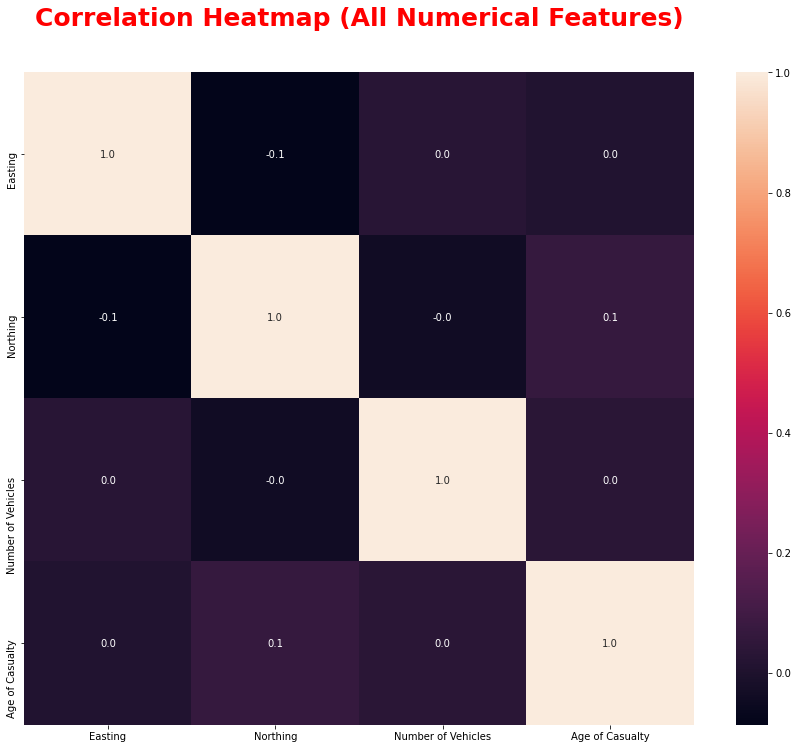

In [52]:
plt.figure(figsize=(15,12))
sns.heatmap(df.corr(method='pearson'), annot=True, fmt='.1f')
plt.title('Correlation Heatmap (All Numerical Features)\n',
          color='red',
          fontsize=25,
          fontweight='bold',
          y=1.02)
plt.show();

<b>Seaborn Pairplot (all numerical features):</b>

In order to create our scatterplot pairplot, we use the .pairplot() function from the seaborn library (Waskom, n.d.b). We can clearly see that there are no linear relationships between the numerical features in our DataFrame in the pairplot.

<Figure size 1080x864 with 0 Axes>

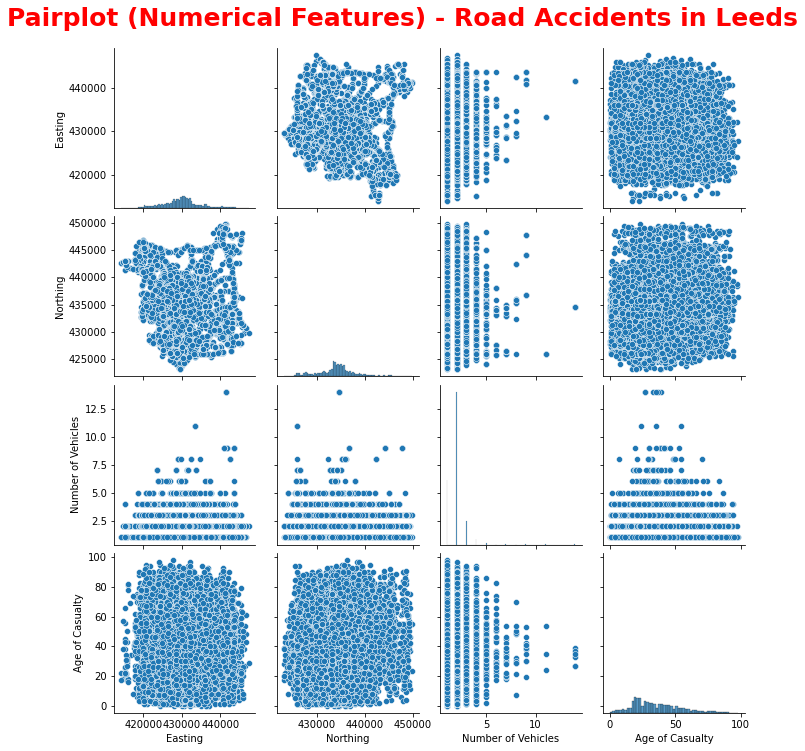

In [53]:
plt.figure(figsize=(15,12))
g = sns.pairplot(df)
g.fig.suptitle('Pairplot (Numerical Features) - Road Accidents in Leeds\n',
               color='red',
               fontsize=25,
               fontweight='bold',
               y=1.04)
plt.show();

<b>Number of Vehicles - Boxplot, Distplot, Violinplot, Countplot, Pie-chart and a scatterplot based on 'Easting' and 'Northing':</b>

In order to plot our boxplot, histogram, violinplot, countplot, piechart and scatterplot, we will use the visualisation code from the data visualization seaborn library (Waskom, n.d.c; n.d.d; n.d.e; n.d.f; n.d.g). We will print the boxplot, distplot, violinplot, countplot, piechart and scatterplot for the Number of Vehicles feature. We first calculate the percentage breakdown of the number of vehicles using the .value_counts() function and the parameter 'normalize=True'.

As over 95% of the values comprise of either 1, 2 or 3 vehicles in each crash, we decide to also add a piechart as it won't appear cluttered with just three values. In order to use the label parameter for generating our piechart, we must first create the labels and use the .unique() and .tolist() functions to create a list of labels for the top three values. The boxplot, histogram and violinplot clearly show that the amount of vehicles in each crash are between 1 and 2. The boxplot shows an extreme outlier of 14, which we later discover was only one vehicle (i.e. a minibus) that was recorded 14 times due to the number of casualties. By plotting the Easting and Northing scatterplot against the Number of Vehicles, we are able to visualise where the accidents took place by number of vehicles.

In [54]:
df['Number of Vehicles'].value_counts(normalize=True)*100

2     61.021018
1     25.978875
3      9.554038
4      2.251147
5      0.693481
6      0.197375
7      0.128027
9      0.064014
8      0.064014
14     0.032007
11     0.016003
Name: Number of Vehicles, dtype: float64

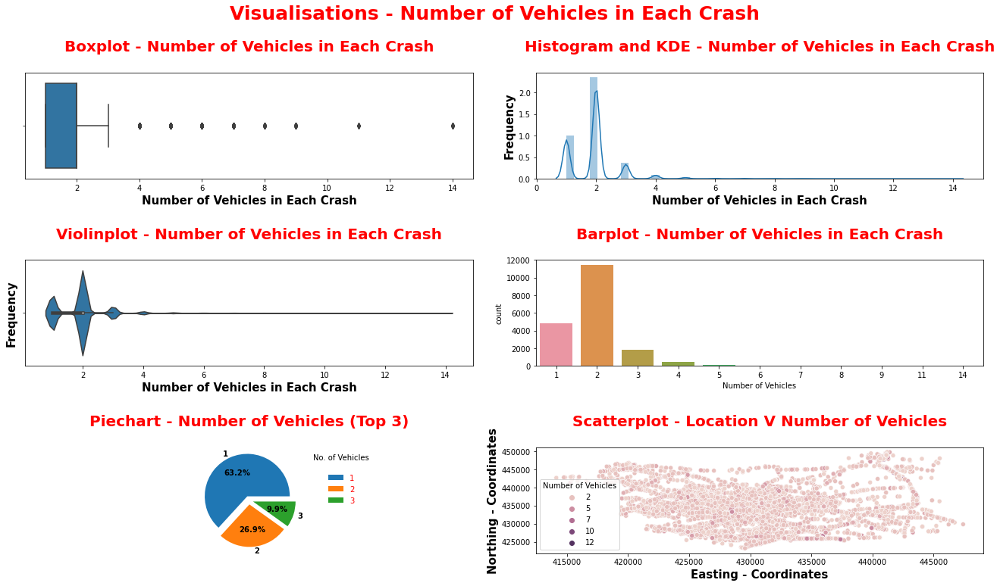

In [55]:
fig, axes = plt.subplots(3,2, constrained_layout=True, figsize=(18, 10), squeeze=False)

labels_for_pie_chart_1 = df['Number of Vehicles'].unique().tolist()[:3]

sns.boxplot(ax=axes[0,0], x=df['Number of Vehicles'])
sns.distplot(ax=axes[0,1], x=df['Number of Vehicles'])
sns.violinplot(ax=axes[1,0], x=df['Number of Vehicles'])
sns.countplot(ax=axes[1,1], x=df['Number of Vehicles'])
axes[2,0].pie(x=df['Number of Vehicles'].value_counts().nlargest(3),
              autopct='%1.1f%%',
              labels = labels_for_pie_chart_1,
              explode=[0.1, 0.1, 0.1,],
              textprops=dict(color='black',
                             weight='bold',
                             fontsize=10))
sns.scatterplot(ax=axes[2,1], x=df['Easting'], y=df['Northing'], hue=df['Number of Vehicles'])

axes[0,0].set_title('Boxplot - Number of Vehicles in Each Crash\n', weight='bold', fontsize=20, color='red')
axes[0,1].set_title('Histogram and KDE - Number of Vehicles in Each Crash\n', weight='bold', fontsize=20, color='red')
axes[1,0].set_title('Violinplot - Number of Vehicles in Each Crash\n', weight='bold', fontsize=20, color='red')
axes[1,1].set_title('Barplot - Number of Vehicles in Each Crash\n', weight='bold', fontsize=20, color='red')
axes[2,0].set_title('Piechart - Number of Vehicles (Top 3)\n', weight='bold', fontsize=20, color='red')
axes[2,1].set_title('Scatterplot - Location V Number of Vehicles\n', weight='bold', fontsize=20, color='red')

axes[0,0].set_xlabel('Number of Vehicles in Each Crash\n', weight='bold', fontsize=15)
axes[0,1].set_xlabel('Number of Vehicles in Each Crash\n', weight='bold', fontsize=15)
axes[0,1].set_ylabel('Frequency', weight='bold', fontsize=15)
axes[1,0].set_xlabel('Number of Vehicles in Each Crash\n', weight='bold', fontsize=15)
axes[1,0].set_ylabel('Frequency', weight='bold', fontsize=15)
axes[2,1].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[2,1].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)

axes[2,0].legend(loc='best', ncol = 1,
           bbox_to_anchor=(1.04,1),
           title='No. of Vehicles\n',
           title_fontsize='10', frameon=False, labelcolor='red', fontsize = 10)

plt.suptitle('Visualisations - Number of Vehicles in Each Crash', fontsize=25, weight='bold', color='red', y=1.06)
plt.show();

<b>Age of Casualty - Boxplot, Distplot, Violinplot, Countplot and a scatterplot based on 'Easting' and 'Northing':</b>

We will print the boxplot, distplot, violinplot, countplot and scatterplot for the Number of Vehicles feature against the Easting and Northing coordinates using plots generated from the seaborn visualisation library. We first calculate the percentage breakdown of the number of vehicles and as no age comprises more than 3.5% of the values, we decide to not add a piechart as it would appear cluttered with so many unique values. The boxplot, histogram and violinplot clearly show that the age of casualties are primarily in the early 20's to mid-40's age group. By plotting the Easting and Northing scatterplot against the Age of Casualty, we are able to visualise where the accidents took place by the recorded age of casualty.

In [56]:
df['Age of Casualty'].value_counts(normalize=True)*100

20    3.216686
19    3.136669
23    3.051318
21    3.045983
22    2.933959
        ...   
94    0.032007
92    0.021338
95    0.016003
97    0.010669
98    0.005334
Name: Age of Casualty, Length: 98, dtype: float64

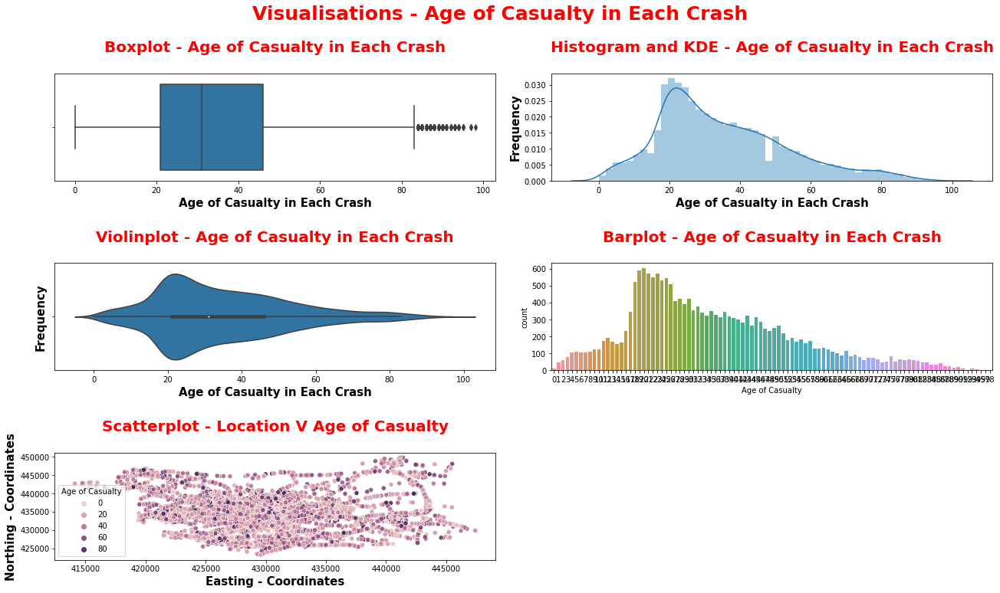

In [57]:
fig, axes = plt.subplots(3,2, constrained_layout=True, figsize=(18, 10), squeeze=False)

sns.boxplot(ax=axes[0,0], x=df['Age of Casualty'])
sns.distplot(ax=axes[0,1], x=df['Age of Casualty'])
sns.violinplot(ax=axes[1,0], x=df['Age of Casualty'])
sns.countplot(ax=axes[1,1], x=df['Age of Casualty'])
sns.scatterplot(ax=axes[2,0], x=df['Easting'], y=df['Northing'], hue=df['Age of Casualty'])

axes[0,0].set_title('Boxplot - Age of Casualty in Each Crash\n', weight='bold', fontsize=20, color='red')
axes[0,1].set_title('Histogram and KDE - Age of Casualty in Each Crash\n', weight='bold', fontsize=20, color='red')
axes[1,0].set_title('Violinplot - Age of Casualty in Each Crash\n', weight='bold', fontsize=20, color='red')
axes[1,1].set_title('Barplot - Age of Casualty in Each Crash\n', weight='bold', fontsize=20, color='red')
axes[2,0].set_title('Scatterplot - Location V Age of Casualty\n', weight='bold', fontsize=20, color='red')

axes[0,0].set_xlabel('Age of Casualty in Each Crash\n', weight='bold', fontsize=15)
axes[0,1].set_xlabel('Age of Casualty in Each Crash\n', weight='bold', fontsize=15)
axes[0,1].set_ylabel('Frequency', weight='bold', fontsize=15)
axes[1,0].set_xlabel('Age of Casualty in Each Crash\n', weight='bold', fontsize=15)
axes[1,0].set_ylabel('Frequency', weight='bold', fontsize=15)
axes[2,0].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[2,0].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)

fig.delaxes(axes[2][1])

plt.suptitle('Visualisations - Age of Casualty in Each Crash', fontsize=25, weight='bold', color='red', y=1.06)
plt.show();

<b>Scatteplot Subplots - 'Easting' and 'Northing' Visualisations:</b>

<b>Important note:</b> These scatterplot subplots may take up to twenty minutes to load given the amount of information being visualised.

We plotted the scatterplots for Easting and Northing versus the other features which may be useful for visualising possible patterns and further investigations later on. We removed the legends for space purposes but the legends can be added back in to each plot for further investigation.

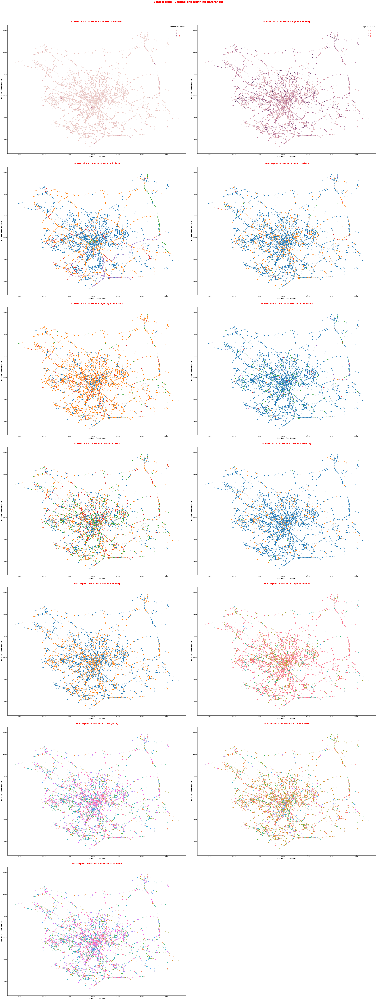

In [58]:
fig, axes = plt.subplots(7,2, constrained_layout=True, figsize=(50, 130), squeeze=False)

ax1 = sns.scatterplot(ax=axes[0,0], x=df['Easting'], y=df['Northing'], hue=df['Number of Vehicles'])
ax2 = sns.scatterplot(ax=axes[0,1], x=df['Easting'], y=df['Northing'], hue=df['Age of Casualty'])
ax3 = sns.scatterplot(ax=axes[1,0], x=df['Easting'], y=df['Northing'], hue=df['1st Road Class'])
ax4 = sns.scatterplot(ax=axes[1,1], x=df['Easting'], y=df['Northing'], hue=df['Road Surface'])
ax5 = sns.scatterplot(ax=axes[2,0], x=df['Easting'], y=df['Northing'], hue=df['Lighting Conditions'])
ax6 = sns.scatterplot(ax=axes[2,1], x=df['Easting'], y=df['Northing'], hue=df['Weather Conditions'])
ax7 = sns.scatterplot(ax=axes[3,0], x=df['Easting'], y=df['Northing'], hue=df['Casualty Class'])
ax8 = sns.scatterplot(ax=axes[3,1], x=df['Easting'], y=df['Northing'], hue=df['Casualty Severity'])
ax9 = sns.scatterplot(ax=axes[4,0], x=df['Easting'], y=df['Northing'], hue=df['Sex of Casualty'])
ax10 = sns.scatterplot(ax=axes[4,1], x=df['Easting'], y=df['Northing'], hue=df['Type of Vehicle'])
ax11 = sns.scatterplot(ax=axes[5,0], x=df['Easting'], y=df['Northing'], hue=df['Accident Date'])
ax12 = sns.scatterplot(ax=axes[5,1], x=df['Easting'], y=df['Northing'], hue=df['Time (24hr)'])
ax13 = sns.scatterplot(ax=axes[6,0], x=df['Easting'], y=df['Northing'], hue=df['Reference Number'])

axes[0,0].set_title('Scatterplot - Location V Number of Vehicles\n', weight='bold', fontsize=20, color='red')
axes[0,1].set_title('Scatterplot - Location V Age of Casualty\n', weight='bold', fontsize=20, color='red')
axes[1,0].set_title('Scatterplot - Location V 1st Road Class\n', weight='bold', fontsize=20, color='red')
axes[1,1].set_title('Scatterplot - Location V Road Surface\n', weight='bold', fontsize=20, color='red')
axes[2,0].set_title('Scatterplot - Location V Lighting Conditions\n', weight='bold', fontsize=20, color='red')
axes[2,1].set_title('Scatterplot - Location V Weather Conditions\n', weight='bold', fontsize=20, color='red')
axes[3,0].set_title('Scatterplot - Location V Casualty Class\n', weight='bold', fontsize=20, color='red')
axes[3,1].set_title('Scatterplot - Location V Casualty Severity\n', weight='bold', fontsize=20, color='red')
axes[4,0].set_title('Scatterplot - Location V Sex of Casualty\n', weight='bold', fontsize=20, color='red')
axes[4,1].set_title('Scatterplot - Location V Type of Vehicle\n', weight='bold', fontsize=20, color='red')                 
axes[5,0].set_title('Scatterplot - Location V Time (24hr)\n', weight='bold', fontsize=20, color='red')
axes[5,1].set_title('Scatterplot - Location V Accident Date\n', weight='bold', fontsize=20, color='red')
axes[6,0].set_title('Scatterplot - Location V Reference Number\n', weight='bold', fontsize=20, color='red')

axes[0,0].set_xlabel('Easting - Coordinates\n', weight='bold', fontsize=15)
axes[0,0].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)
axes[0,1].set_xlabel('Easting - Coordinates\n', weight='bold', fontsize=15)
axes[0,1].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)
axes[1,0].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[1,0].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)
axes[1,1].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[1,1].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)
axes[2,0].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[2,0].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)
axes[2,1].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[2,1].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)
axes[3,0].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[3,0].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)
axes[3,1].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[3,1].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)
axes[4,0].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[4,0].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)
axes[4,1].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[4,1].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)
axes[5,0].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[5,0].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)
axes[5,1].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[5,1].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)
axes[6,0].set_xlabel('Easting - Coordinates', weight='bold', fontsize=15)
axes[6,0].set_ylabel('Northing - Coordinates', weight='bold', fontsize=15)

axes[0,0].legend(loc='best',
           bbox_to_anchor=(1, 1),
           title='Number of Vehicles\n',
           title_fontsize='15', frameon=False, labelcolor='red', fontsize = 10)
axes[0,1].legend(loc='best',
           bbox_to_anchor=(1, 1),
           title='Age of Casualty\n',
           title_fontsize='15', frameon=False, labelcolor='red', fontsize = 10)

ax3.get_legend().remove()
ax4.get_legend().remove()
ax5.get_legend().remove()
ax6.get_legend().remove()
ax7.get_legend().remove()
ax8.get_legend().remove()
ax9.get_legend().remove()
ax10.get_legend().remove()
ax11.get_legend().remove()
ax12.get_legend().remove()
ax13.get_legend().remove()

fig.delaxes(axes[6][1])

plt.suptitle('Scatterplots - Easting and Northing References\n', fontsize=25, weight='bold', color='red', y=1.02)
plt.show();

# EDA VISUALISATIONS - PART II - CATEGORICAL FEATURES

<b>Countplots (All Categorical Features):</b>

By visualising the countplots for the categorical features, we can clearly see that most accidents happened when the weather was Dry, in daylight with street lighting present, fine weather without high winds and on unclassified roads which we later learn from both the above scatterplots and our clustering most likely refer to inner city road networks. The driver was the person most likely to be injured and the injury is most likely to be slight. The sex is most likely to be male and the type of vehicle is most likely to be a car. We added the values on each bar to make data investigation easier from the matplotlib visualisation library (Matplotlib development team, n.d.a; n.d.b) and rotated some of the axis values to avoid cluttering.

AttributeError: 'AxesSubplot' object has no attribute 'bar_label'

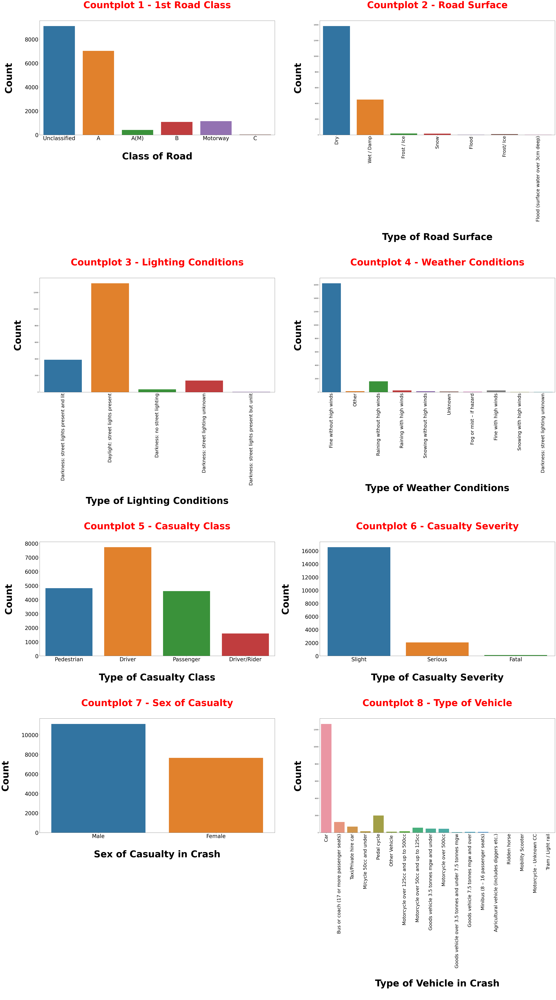

In [59]:
fig, axes = plt.subplots(4,2, constrained_layout=True, figsize=(50, 90), squeeze=False)

ax1 = sns.countplot(ax=axes[0,0], x=df['1st Road Class'])
ax2 = sns.countplot(ax=axes[0,1], x=df['Road Surface'])
ax3 = sns.countplot(ax=axes[1,0], x=df['Lighting Conditions'])
ax4 = sns.countplot(ax=axes[1,1], x=df['Weather Conditions'])
ax5 = sns.countplot(ax=axes[2,0], x=df['Casualty Class'])
ax6 = sns.countplot(ax=axes[2,1], x=df['Casualty Severity'])
ax7 = sns.countplot(ax=axes[3,0], x=df['Sex of Casualty'])
ax8 = sns.countplot(ax=axes[3,1], x=df['Type of Vehicle'])

axes[0,0].set_title('Countplot 1 - 1st Road Class\n', weight='bold', fontsize=60, color='red')
axes[0,1].set_title('Countplot 2 - Road Surface\n', weight='bold', fontsize=60, color='red')
axes[1,0].set_title('Countplot 3 - Lighting Conditions\n', weight='bold', fontsize=60, color='red')
axes[1,1].set_title('Countplot 4 - Weather Conditions\n', weight='bold', fontsize=60, color='red')
axes[2,0].set_title('Countplot 5 - Casualty Class\n', weight='bold', fontsize=60, color='red')
axes[2,1].set_title('Countplot 6 - Casualty Severity\n', weight='bold', fontsize=60, color='red')
axes[3,0].set_title('Countplot 7 - Sex of Casualty\n', weight='bold', fontsize=60, color='red')
axes[3,1].set_title('Countplot 8 - Type of Vehicle\n', weight='bold', fontsize=60, color='red')

axes[0,0].set_xlabel('\nClass of Road', weight='bold', fontsize=60)
axes[0,0].set_ylabel('Count\n', weight='bold', fontsize=60)
axes[0,1].set_xlabel('\nType of Road Surface\n', weight='bold', fontsize=60)
axes[0,1].set_ylabel('Count\n', weight='bold', fontsize=60)
axes[1,0].set_xlabel('\nType of Lighting Conditions\n', weight='bold', fontsize=60)
axes[1,0].set_ylabel('Count\n', weight='bold', fontsize=60)
axes[1,1].set_xlabel('\nType of Weather Conditions\n', weight='bold', fontsize=60)
axes[1,1].set_ylabel('Count\n', weight='bold', fontsize=60)
axes[2,0].set_xlabel('\nType of Casualty Class\n', weight='bold', fontsize=60)
axes[2,0].set_ylabel('Count\n', weight='bold', fontsize=60)
axes[2,1].set_xlabel('\nType of Casualty Severity\n', weight='bold', fontsize=60)
axes[2,1].set_ylabel('Count\n', weight='bold', fontsize=60)
axes[3,0].set_xlabel('\nSex of Casualty in Crash\n', weight='bold', fontsize=60)
axes[3,0].set_ylabel('Count\n', weight='bold', fontsize=60)
axes[3,1].set_xlabel('\nType of Vehicle in Crash\n', weight='bold', fontsize=60)
axes[3,1].set_ylabel('Count\n', weight='bold', fontsize=60)

axes[0,0].tick_params(labelsize=35)
axes[0,1].tick_params(labelsize=30, axis='x', rotation=90)
axes[1,0].tick_params(labelsize=30, axis='x', rotation=90)
axes[1,1].tick_params(labelsize=30, axis='x', rotation=90)
axes[2,0].tick_params(labelsize=35)
axes[2,1].tick_params(labelsize=35)
axes[3,0].tick_params(labelsize=35)
axes[3,1].tick_params(labelsize=30, axis='x', rotation=90)

ax1.bar_label(ax1.containers[0],
             fontweight='bold',
             color='black',
             fontsize=40,
             padding=5)
ax2.bar_label(ax2.containers[0],
             fontweight='bold',
             color='black',
             fontsize=40,
             padding=5)
ax3.bar_label(ax3.containers[0],
             fontweight='bold',
             color='black',
             fontsize=40,
             padding=5)
ax4.bar_label(ax4.containers[0],
             fontweight='bold',
             color='black',
             fontsize=40,
             padding=5)
ax5.bar_label(ax5.containers[0],
             fontweight='bold',
             color='black',
             fontsize=40,
             padding=5)
ax6.bar_label(ax6.containers[0],
             fontweight='bold',
             color='black',
             fontsize=40,
             padding=5)
ax7.bar_label(ax7.containers[0],
             fontweight='bold',
             color='black',
             fontsize=40,
             padding=5)
ax8.bar_label(ax8.containers[0],
             fontweight='bold',
             color='black',
             fontsize=20,
             padding=5)

plt.suptitle('Visualisations - Categorical Features (Countplots)', fontsize=100, weight='bold', color='red', y=1.03);
plt.show();

<b>Piecharts (All Categorical Features):</b>

We plotted the piecharts for each of the categorical features but only included the top five values in each feature to avoid cluttering. If anything interesting appears, we can then look into each of these piecharts separately with all values instead of just the top five to investigate further. However, the information from the piecharts appear to correspond to the above countplots and are another means of visually investigating, providing clarity or possible patterns about the information in our dataframe.

In order to create the piechart subplots for the categorical features, we created a new DataFrame 'df_piecharts' to rename some of the value strings with long labels to shorter names using the .replace() function. This will allow the piecharts to be presented in a more visually appealing and less cluttered manner.

In order to get the labels and legends showing, we needed to create a list of the top 5 values for each of the values in each pie chart using the unique() and .tolist() functions.

In [ ]:
df_piecharts = df

In [ ]:
df_piecharts = df_piecharts.replace({'Flood (surface water over 3cm deep)':'Flood',
                                     'Wet / Damp':'Wet',
                                     'Frost / Ice':'Frost',
                                     'Frost/ Ice':'Frost',
                                     'Fine without high winds':'Fine_No_High_Winds',
                                     'Raining without high winds':'Raining_No_High_Winds',
                                     'Raining with high winds':'Raining_With_High_Winds',
                                     'Snowing without high winds':'Snowing_No_High_Winds',
                                     'Fog or mist – if hazard':'Fog_Mist',
                                     'Fine with high winds':'Fine_With_High_Winds',
                                     'Snowing with high winds':'Snowing_With_High_Winds',
                                     'Darkness: street lights present and lit':'Night-Time',
                                     'Daylight: street lights present':'Day-Time',
                                     'Darkness: no street lighting':'Night-Time',
                                     'Darkness: street lights present and lit':'Night-Time',
                                     'Darkness: street lights present and lit':'Night-Time',
                                     'Darkness: street lighting unknown':'Night-Time',
                                     'Darkness: street lights present but unlit':'Night-Time',
                                     'Bus or coach (17 or more passenger seats)':'Bus/Coach'})

In [ ]:
color_scheme = sns.color_palette('colorblind')

fig, axes = plt.subplots(4,2, constrained_layout=True, figsize=(50, 90), squeeze=False)

labels_1 = df_piecharts['1st Road Class'].unique().tolist()[:5]
labels_2 = df_piecharts['Road Surface'].unique().tolist()[:5]
labels_3 = df_piecharts['Lighting Conditions'].unique().tolist()[:5]
labels_4 = df_piecharts['Weather Conditions'].unique().tolist()[:5]
labels_5 = df_piecharts['Casualty Class'].unique().tolist()[:5]
labels_6 = df_piecharts['Casualty Severity'].unique().tolist()[:5]
labels_7 = df_piecharts['Sex of Casualty'].unique().tolist()[:5]
labels_8 = df_piecharts['Type of Vehicle'].unique().tolist()[:5]

axes[0,0].pie(x=df_piecharts['1st Road Class'].value_counts().nlargest(5),
              colors=color_scheme,
              autopct='%1.1f%%',
              labels = labels_1,
              explode=[0.1, 0.1, 0.1, 0.1, 0.1],
              textprops=dict(color='black',
                             weight='bold',
                             fontsize=35))

axes[0,1].pie(x=df['Road Surface'].value_counts().nlargest(5),
              colors=color_scheme,
              autopct='%1.1f%%',
              labels = labels_2,
              explode=[0.1, 0.1, 0.3, 0.1, 0.3],
              textprops=dict(color='black',
                             weight='bold',
                             fontsize=35))
axes[1,0].pie(x=df_piecharts['Lighting Conditions'].value_counts().nlargest(5),
              colors=color_scheme,
              autopct='%1.1f%%',
              labels = labels_3,
              textprops=dict(color='black',
                             weight='bold',
                             fontsize=35))
axes[1,1].pie(x=df_piecharts['Weather Conditions'].value_counts().nlargest(5),
              colors=color_scheme,
              autopct='%1.1f%%',
              labels = labels_4,
              explode=[0.1, 0.1, 0.1, 0.3, 0.3],
              textprops=dict(color='black',
                             weight='bold',
                             fontsize=35))
axes[2,0].pie(x=df_piecharts['Casualty Class'].value_counts().nlargest(5), 
              colors=color_scheme,
              autopct='%1.1f%%',
              labels = labels_5,
              textprops=dict(color='black',
                             weight='bold',
                             fontsize=35))
axes[2,1].pie(x=df_piecharts['Casualty Severity'].value_counts().nlargest(5),
              colors=color_scheme,
              autopct='%1.1f%%',
              labels = labels_6,
              explode=[0.1, 0.1, 0.3],
              textprops=dict(color='black',
                             weight='bold',
                             fontsize=35))
axes[3,0].pie(x=df_piecharts['Sex of Casualty'].value_counts().nlargest(5),
              colors=color_scheme,
              autopct='%1.1f%%',
              labels = labels_7,
              textprops=dict(color='black',
                             weight='bold',
                             fontsize=35))
axes[3,1].pie(x=df_piecharts['Type of Vehicle'].value_counts().nlargest(5),
              colors=color_scheme,
              autopct='%1.1f%%',
              labels = labels_8,
              textprops=dict(color='black',
                             weight='bold',
                             fontsize=35))

axes[0,0].set_title('Pie Chart 1 - 1st Road Class\n', weight='bold', fontsize=60, color='red')
axes[0,1].set_title('Pie Chart 2 - Road Surface\n', weight='bold', fontsize=60, color='red')
axes[1,0].set_title('Pie Chart 3 - Lighting Conditions\n', weight='bold', fontsize=60, color='red')
axes[1,1].set_title('Pie Chart 4 - Weather Conditions\n', weight='bold', fontsize=60, color='red')
axes[2,0].set_title('Pie Chart 5 - Casualty Class\n', weight='bold', fontsize=60, color='red')
axes[2,1].set_title('Pie Chart 6 - Casualty Severity\n', weight='bold', fontsize=60, color='red')
axes[3,0].set_title('Pie Chart 7 - Sex of Casualty\n', weight='bold', fontsize=60, color='red')
axes[3,1].set_title('Pie Chart 8 - Type of Vehicle\n', weight='bold', fontsize=60, color='red')


axes[0,0].legend(loc='best',
           bbox_to_anchor=(1.01, 0.5, 0.5, 0.5),
           title='1st Road Class\n',
           title_fontsize='45', frameon=False, labelcolor='red', fontsize = 35);
axes[0,1].legend(loc='best',
           bbox_to_anchor=(1.01, 0.5, 0.5, 0.5),
           title='Road Surface\n',
           title_fontsize='45', frameon=False, labelcolor='red', fontsize = 35);
axes[1,0].legend(loc='best',
           bbox_to_anchor=(1.01, 0.5, 0.5, 0.5),
           title='Lighting Conditions\n',
           title_fontsize='45', frameon=False, labelcolor='red', fontsize = 35);
axes[1,1].legend(loc='best',
           bbox_to_anchor=(1.01, 0.5, 0.5, 0.5),
           title='Weather Conditions\n',
           title_fontsize='45', frameon=False, labelcolor='red', fontsize = 35);
axes[2,0].legend(loc='best',
           bbox_to_anchor=(1.01, 0.5, 0.5, 0.5),
           title='Casualty Class\n',
           title_fontsize='45', frameon=False, labelcolor='red', fontsize = 35);
axes[2,1].legend(loc='best',
           bbox_to_anchor=(1.01, 0.5, 0.5, 0.5),
           title='Casualty Severity\n',
           title_fontsize='45', frameon=False, labelcolor='red', fontsize = 35);
axes[3,0].legend(loc='best',
           bbox_to_anchor=(1.01, 0.5, 0.5, 0.5),
           title='Sex of Casualty\n',
           title_fontsize='45', frameon=False, labelcolor='red', fontsize = 35);
axes[3,1].legend(loc='best',
           bbox_to_anchor=(1.01, 0.5, 0.5, 0.5),
           title='Type of Vehicle\n',
           title_fontsize='45', frameon=False, labelcolor='red', fontsize = 35);

plt.suptitle('Visualisations - Categorical Features (Pie Charts - Only Top 5 values)', fontsize=80, weight='bold', color='red', y=1.03);
plt.show();

# PART III - CLUSTERING ANALYSIS

<b>Introduction to clustering - from Sam's notes:</b>

Clustering is an unsupervised learning technique used to separate data points into a number of groups or clusters and help us identify new possible target variables when the target variable values have not been provided or to help identify possible new target features and values that may not appear evident from looking at a dataset at first glance. After performing clustering, it will be the data scientist's responsibility to conclude, identify and tag the groups after clustering based on their domain knowledge of a dataset. Clustering techniques can be very beneficial when working with raw data. Clustering algorithms segment records and maximise the homogeneity in the subgroups and try to ensure that the similarity to records outside the clusters are minimised (Weiss, 2022a).

The most common clustering technique is K-Means, but there are other clustering methods such as HAC clustering, K-Medoids, Fuzzy C-Means, DBSCAN and OPTICS. The main issue with these type of clustering methods is that they require numerical data to measure similarity using distance measurements such as euclidean, city-block, manhattan or minkowski distance metrics. They will generally then use the elbow method and the silhouette coefficient to determine the number of clusters to use and to evaluate the clusters. The silhouette coefficient values range from -1 to +1 and the coefficient will be higher for compact clusters that are well separated and will be lower for overlapping clusters. It uses the formula (b-a)/max(a,b) where a is the average intra-cluster distance (i.e. the average distance between each point within a cluster) and b is the average inter-cluster distance (i.e. the average distance between all clusters) (Weiss, 2022a).

The primary advantage of k-medoids over k-means is that the partition around medoids (PAM) is less sensitive to outliers but is not suitable for clustering non-spherical groups of objects as it relies on minimising the distances between the non-medoid objects and the medoid or cluster centre. Another advantage of k-medoids is that is works well with other measurement metrics while k-means prefers the euclidean distance metric. It should be noted that both the k-means and k-medoids algorithms are partitional i.e. they break the dataset into groups. K-medoids also uses datapoints as its centres while k-means uses centroids (Weiss, 2022a).

Fuzzy c-means clustering is also known as soft clustering and it's primary difference to k-means and k-medoids is that each record can potentially belong to multiple clusters with the degree of belonging given a value between 0 and 1, hence the name fuzzy clustering. It is important to note that the 0 to 1 values are not probabilities and do not need to add up to 1. With k-means and k-medoids, each record would belong to either a cluster or not i.e. they are hard clustering techniques i.e. true or false (Weiss, 2022b).

Another form of clustering is hierarchical clustering with the most common method being agglomerative hierarchial clustering (HAC) which is a bottom-up technique (i.e. where we start with many clusters until we reach the optimum number of clusters) instead of a top-down (i.e. where we start with one cluster) which is devisive clustering. They should both reach a similar result but HAC is considered easier to solve from a mathematical perspective and is the most commonly used.

The HAC technique relies on euclidean distance which is one of several methods to measure the distance between two datapoints and allows us to represent our clusters in a tree-like visualisation called a dendrogram. This algorithm using euclidean distance will eventually consider all our datapoints as one big cluster and as there is no point in having one cluster, we must identify the best place to stop clustering the data by plotting and viewing our Dendrogram. 

It's primary advantage is that it will show all the possible linkages between the clusters but does not work well on large datasets and is very resource intensive. The criteria used to decide on when to stop merging the clusters depends on which linkage method we decide to use in our dendrogram parameter. The linkage method used will depend on the problem we are trying to resolve and it is important to note that each of the following linkage methods will result in different clusters being generated. The four possible linkage methods are:

<b>a. Single linkage</b> which minimises the distance between the nearest points in the clusters;<br>
<b>b. Complete linkage</b> which minimises the distance between the farthest points in the clusters;<br>
<b>c. Average linkage</b> which minimises the distances between the centroids of the clusters; and,<br> 
<b>d. Ward linkage</b> which minimises the variance of the clusters being merged. It should be noted that the ward linkage method is analogous to Within Cluster Sum of Sqaures (WCSS) used by K-Means (Weiss, 2022b).

The other two common clustering techniques are DBSCAN and OPTICS which are density based approaches to clustering which is useful if we have clusters of varying densities.

DBSCAN stands for density-based spatial clustering of applications and noise and is useful for document clustering, image segmentation and anomaly detection. The algorithm can be tuned using two parameters i.e. epsilon (eps) and minPoints (minPts) which determines how far to search for the points near a given point and determines how many points should be present in the neighbourhood of a given point in order to keep expanding a particular cluster respectively.

DBSCAN uses euclidean distance and works by creating a circle of epsilon radius around every datapoint and classifies them into core points, border points and noise. It's primary advantages are that we don't need to specify the number of clusters in advance, is not too impacted by outliers and can find clusters of arbitrary shapes. This is its primary advantage over the k-means algorithm which prefers spherical shapes. It's primary disadvantages are it works better with constant density otherwise it may consider some obvious clusters are noise (low epsilon) or as one big cluster (high epsilon), it's not deterministic with boarder points and our epsilon and minPoints may not be obvious from the start. It should also be noted that the DBSCAN library from scikit-learn uses default values for epsilon and the min_samples of 0.5 and 3, 4 or 5 respectively depending on the kind of data (Weiss, 2022c).

The other density based clustering algorithm i.e. OPTICS, was developed to solve the issues in the DBSCAN algorithm i.e. DBSCAN is hard to tune the input parameters and is very sensitive to the input parameters. OPTICS is based on DBSCAN and rather than produce clusters explicitly, it generates an ordering of data objects which represents the density based clustering structure. It also has the added benefit in that we can represent our clusters graphically using visualisation techniques.

As OPTICS draws inspiration from the DBSCAN clustering algorithm, it also adds two additional concepts i.e. core distance and reachability distance. Core distance is the minimum value of the radius required to classify a given point as a core point and reachability distance is defined with respect to another datapoint which is calculated as the distance between the maximum of the core distance and the euclidean distance between two data points. This is also different in that this clustering techique does not explicitly segment our data into clusters but instead produces a visualisation of the reachability distances and then uses this visualisation to cluster our data. Its basic data structure uses a controlList to memorize the shortest reachability distances and always makes the shortest jump with the ouput being the order of points, the core distance of points and the reachability distance of points (Weiss, 2022c).

As our dataset was comprised primarily of categorical values, we decided to use two other clustering techniques which were specifically developed to deal with categorical or a mixture of categorical and numerical data values to achieve our required clustering outcomes i.e. K-Modes and K-Prototypes clustering.

### KModes Clustering:

Like the numerical clustering algorithms e.g. K-Means etc., KModes is an unsupervised algorithm that is used to cluster categorical variables based upon the similarity or dissimilarity between the variables. With K-Means, the centroids will be decided by the means distance based on euclidean or some other distance measurement. As categorical datapoints are not numerical, we cannot use such distance measurements. KModes therefore uses dissimilarities or total mismatches between the categorical datapoints and uses modes instead of means to determine if there are similarities or dissimilarities between our datapoints (Bonthu, 2022).

The KModes algorithm works as follows (Bonthu, 2022):

<b>1.</b> It will pick a number of our datapoint observations at random.

<b>2.</b> It will then calculate the dissimilarities and use this calculation to assign each of the observations to its closest cluster. Dissimilarities are the number of mismatches.

<b>3.</b> It will then define new modes for the clusters and keep iterating until it reaches the best number of clusters with the total number of cluster being initially defined by using a elbow plot to observe a bend which represents a low cost value.

<b>4.</b> It's important to note that KModes won't work when the features have mixed datatypes e.g. categorical and numerical. We will therefore only use the categorical features for implementing our KModes algorithm.

In [ ]:
df.head(1)

<b>Step 1:</b>

We will first separate out the categorical features in our DataFrame by using a for loop to extract and list just the categorical features that have an object datatype (pandas.pydata.org, n.d.a). We will then print both the list and the column index position of these features. This is important because the K-Modes algorithm will return an error if our features don't have consistent categorical datatypes i.e. the algorithm will not work with mixed datatypes (pypi.org, 2022).

We can see that the categorical features have column index positions of 0, 5, 7, 8, 9, 10, 11, 12, 13 and 15. These are the features we will use to implement our K-Modes algorithm but we will exclude the 'Reference Number' and 'Time (24hr)' features so that our Kmodes algorithms will just evaluate the remaining categorical features.

In [ ]:
catColumnsPos = [df.columns.get_loc(col) for col in list(df.select_dtypes('object').columns)]
print('\nCategorical Column Names = {}\n'.format(list(df.select_dtypes('object').columns)))
print('Categorical Column Index Positions = {}'.format(catColumnsPos))

<b>Step 2:</b>

In order to test the accuracy of our K-Modes clustering algorithm, we will use four categorical features i.e. 'Casualty Severity', 'Casualty Class', '1st Road Class' and 'Road Surface' which have an index position of 12, 11, 7 and 8 respectively as our target features and not include these features in the four separate KModes algorithms we will execute.

We now create the four separate X variables (X_casualty_severity, X_casualty_class, X_road_class and X_road_surface) that includes just the categorical features in our DataFrame but excludes each the categorical features we will wish to test our end clustering algorithm against. We will also create four separate y variables that will include the four target features we will test our clustering algorithm against (y_casualty_severity, y_casualty_class, y_road_class and y_road_surface).

In [ ]:
X_casualty_severity = df.iloc[:,[7, 8, 9, 10, 11, 13, 15]]
y_casualty_severity = df.iloc[:, 12]

X_casualty_class = df.iloc[:,[7, 8, 9, 10, 12, 13, 15]]
y_casualty_class = df.iloc[:, 11]

X_road_class = df.iloc[:,[8, 9, 10, 11, 12, 13, 15]]
y_road_class = df.iloc[:, 7]

X_road_surface = df.iloc[:,[7, 9, 10, 11, 12, 13, 15]]
y_road_surface = df.iloc[:, 8]

<b>Step 3:</b> In order to implement our K-Modes clustering algorithm, we will first pip install kmodes and then import the required library to perform the KModes algorithm (pypi.org, 2022). KModes defines clusters based on the number of matching categories between data points based on modes. This is different to the k-Means algorithm, which primarily clusters numerical data based on the euclidean distance measurement.

In [182]:
from kmodes.kmodes import KModes

<b>Step 4:</b>

As we will need to specify the number of optimal clusters for our KModes algorithm, we will use a Scree Plot (Elbow Curve) to determine the optimal number of clusters we will use in each of the four KModes algorithms we will execute and then eventually test these clusters against each of our four specified target features detailed above.

The elbow curve shows that the optimal number of clusters for each of our four independent variables will be 3 which is where the bend in the curve starts to level off. However, in order to test the accuracy of our clustering algorithms, we decide to use four clusters for some of them as that number of clusters better represents the possible number of clusters (i.e. the unique values) in our target feature. We will then eventually use a countplot to visualise and compare the clusters to our target features at the end of this KModes section.

<b>Implementation of the KModes Elbow Plot:</b>

KMeans uses the Within Cluster Sum of Squares (WCSS) to measure the squared average distance of all points within a cluster to the cluster centroid. WCSS is calculated by first finding the Euclidean distance between a given data point and the centroid to which it is assigned.

As this method cannot be used with categorical values, the cost in our KModes will be the sum of all the dissimilarities between the clusters (Bonthu, 2022). We will then select the number of clusters to use in our KModes algorithm by choosing the number where the cost value begins to level off on our plotted elbow curve i.e. where the bend on the curve is most evident. However, we will use an extra cluster to allow a better comparison and evaluation against our target features at the end.

<b>Explanation of Elbow Plot code:</b>

We will first declare our array to hold our cost. We will then set the minimum and maximum values for our for loop i.e. 1 and 5 i.e. we wish to have a maximum of 4 clusters as the last number '5' isn't included. We will set the method for initialization to 'random'.

The other possible initialization parameters are 'Cao' and 'Huang' (nicodv, 2022). However, the 'random' parameter appeared to show a clearer number of possible clusters to choose from i.e. either 2, 3 or 4 and the bend in the curves appeared more evident. The 'Huang' parameter showed to use just two clusters and the 'Cao' parameter showed to just use three clusters.

We set the n_init to '5' which is the number of time the k-modes algorithm will be run with different centroid seeds. The final results will be the best output of n_init consecutive runs in terms of cost. It should be noted that the default parameter for n_init is '10'. We also set the verbose to silent i.e. '0' to save space. If we wished to see the execution of the code, we can change verbose to '1' or '2' which will output both a progress bar and one line per epoch or total number of epochs respectively. We also set the random_state so we would achieve similar results each time we execute the elbow plot code. 

Finally, we fit our KModes algorithm onto each of the list of X variables we created earlier and append this information to our plot using kmode.cost_. The Clustering cost attribute is the sum distance of all points to their respective cluster centroids (nicodv, 2022).

<b>Elbow plot code to find optimal number of clusters to compare against our target features:</b>

In [ ]:
cost_casualty_severity = []
for i in range(1, 5):
    kmode = KModes(n_clusters=i,
                   init = 'random',
                   n_init = 5,
                   verbose=0,
                   random_state=42)
    kmode.fit_predict(X_casualty_severity)
    cost_casualty_severity.append(kmode.cost_)
    
cost_casualty_class = []
for i in range(1, 5):
    kmode = KModes(n_clusters=i,
                   init = 'random',
                   n_init = 5,
                   verbose=0,
                   random_state=42)
    kmode.fit_predict(X_casualty_class)
    cost_casualty_class.append(kmode.cost_)
    
cost_road_class = []
for i in range(1, 5):
    kmode = KModes(n_clusters=i,
                   init = 'random',
                   n_init = 5,
                   verbose=0,
                   random_state=42)
    kmode.fit_predict(X_road_class)
    cost_road_class.append(kmode.cost_)
    
cost_road_surface = []
for i in range(1, 5):
    kmode = KModes(n_clusters=i,
                   init = 'random',
                   n_init = 5,
                   verbose=0,
                   random_state=42)
    kmode.fit_predict(X_road_surface)
    cost_road_surface.append(kmode.cost_)

<b>Elbow plot ouputs to find optimal number of clusters to compare against each of our target features:</b>

In [ ]:
fig, axes = plt.subplots(2,2, constrained_layout=True, figsize=(18, 10), squeeze=False)

axes[0,0].plot(range(1, 5), cost_casualty_severity, marker='X',markersize=15)
axes[0,1].plot(range(1, 5), cost_casualty_class, marker='X', markersize=15)
axes[1,0].plot(range(1, 5), cost_road_class, marker='X', markersize=15)
axes[1,1].plot(range(1, 5), cost_road_surface, marker='X', markersize=15)

axes[0,0].set_title('Elbow Plot- X_casualty_severity\n', weight='bold', fontsize=20, color='red')
axes[0,1].set_title('Elbow Plot- X_casualty_class\n', weight='bold', fontsize=20, color='red')
axes[1,0].set_title('Elbow Plot- X_road_class\n', weight='bold', fontsize=20, color='red')
axes[1,1].set_title('Elbow Plot- X_road_surface\n', weight='bold', fontsize=20, color='red')


axes[0,0].set_xlabel('Number of Clusters\n', weight='bold', fontsize=15)
axes[0,1].set_ylabel('Cost', weight='bold', fontsize=15)
axes[0,1].set_xlabel('Number of Clusters\n', weight='bold', fontsize=15)
axes[0,1].set_ylabel('Cost', weight='bold', fontsize=15)
axes[1,0].set_xlabel('Number of Clusters\n', weight='bold', fontsize=15)
axes[1,0].set_ylabel('Cost', weight='bold', fontsize=15)
axes[1,1].set_xlabel('Number of Clusters', weight='bold', fontsize=15)
axes[1,1].set_ylabel('Cost', weight='bold', fontsize=15)

axes[0,0].tick_params(labelsize=15)
axes[0,1].tick_params(labelsize=15)
axes[1,0].tick_params(labelsize=15)
axes[1,1].tick_params(labelsize=15)

plt.suptitle('Elbow Method For Optimal Number of Clusters', fontsize=25, weight='bold', color='red', y=1.06)
plt.show();

<b>Step 5:</b> We will now build our K-Modes models with the optimal number of clusters as determined by the above Elbow plots where the bend in the curve starts to level off i.e. we will use 3 or 4 clusters. However, we will use additional clusters in order to allow us to make better comparisions with our target features. We will then fit our clustering predictions onto the independent features we created earlier. We will then print our clustering arrays. We will then print our cluster centroids which are the centers or modes for each of our clusters.

<b>Building the model with 3 clusters to compare against the Casualty Severity feature:</b>

In [ ]:
kmode = KModes(n_clusters=3, init = 'random', n_init = 5, verbose=0)
clusters_casualty_severity = kmode.fit_predict(X_casualty_severity)
clusters_casualty_severity

<b>Print these cluster centroids:</b>

In [ ]:
print(kmode.cluster_centroids_)

<b>Building the model with 3 clusters to compare against the Casualty Class feature:</b>

In [ ]:
kmode = KModes(n_clusters=4, init = 'random', n_init = 5, verbose=0)
clusters_casualty_class = kmode.fit_predict(X_casualty_class)
clusters_casualty_class

<b>Print these cluster centroids:</b>

In [ ]:
print(kmode.cluster_centroids_)

<b>Building the model with 3 clusters to compare against the 1st Road Class feature:</b>

In [ ]:
kmode = KModes(n_clusters=4, init = 'random', n_init = 5, verbose=0)
clusters_road_class = kmode.fit_predict(X_road_class)
clusters_road_class

<b>Print these cluster centroids:</b>

In [ ]:
print(kmode.cluster_centroids_)

<b>Building the model with 3 clusters to compare against the Road Surface feature:</b>

In [ ]:
kmode = KModes(n_clusters=4, init = 'random', n_init = 5, verbose=0)
clusters_road_surface = kmode.fit_predict(X_road_surface)
clusters_road_surface

<b>Print these cluster centroids:</b>

In [ ]:
print(kmode.cluster_centroids_)

<b>Step 6:</b> We will now insert the predicted cluster values and our dependent features we created earlier back into each of our dataframes. We also rename the dependent features to 'OUR TARGET FEATURE: Feature Name' to emphasise that this is the feature we will want to evaluate our K-Modes clustering algorithm against in our end countplot visualisations and print the first observations from each of our dataframes.

We will insert our new clusters and target features at column locations 0 and 1 respectively to make them easier to view and interpret. We set the allow_duplicates parameter to False to ensure that duplicate features aren't created if these code snippets are run a second time and so will return an error to remind us to run the code from the top of this particular KModes coding section again (pandas.pydata.org, n.d.e).

<b>Inserting the clusters and target feature (Casualty Severity) back into our dataframe:</b>

In [ ]:
X_casualty_severity.insert(0, 'Clusters', clusters_casualty_severity, allow_duplicates = False)
X_casualty_severity.insert(1, 'OUR TARGET FEATURE: Casualty Severity', y_casualty_severity, allow_duplicates = False)
X_casualty_severity.head(1)

<b>Inserting the clusters and target feature (Casualty Class) back into our dataframe:</b>

In [ ]:
X_casualty_class.insert(0, 'Clusters', clusters_casualty_class, allow_duplicates = False)
X_casualty_class.insert(1, 'OUR TARGET FEATURE: Casualty Class', y_casualty_class, allow_duplicates = False)
X_casualty_class.head(1)

<b>Inserting the clusters and target feature (Road Class) back into our dataframe:</b>

In [ ]:
X_road_class.insert(0, 'Clusters', clusters_road_class, allow_duplicates = False)
X_road_class.insert(1, 'OUR TARGET FEATURE: 1st Road Class', y_road_class, allow_duplicates = False)
X_road_class.head(1)

<b>Inserting the clusters and target feature (Road Surface) back into our dataframe:</b>

In [ ]:
X_road_surface.insert(0, 'Clusters', clusters_road_surface, allow_duplicates = False)
X_road_surface.insert(1, 'OUR TARGET FEATURE: Road Surface', y_road_surface, allow_duplicates = False)
X_road_surface.head(1)

<b>Step 7:</b> We will now create new dataframes comprising five random samples from each of the clusters for each of our dataframes to check if we can make any inferences from the clusters compared to their target features. Importing 'display' from 'IPython.display' will allow us to print them in the same output (IPython Development Team, n.d.).

In [ ]:
cluster_casualty_severity_0 = X_casualty_severity[X_casualty_severity['Clusters'] == 0]
cluster_casualty_severity_1 = X_casualty_severity[X_casualty_severity['Clusters'] == 1]
cluster_casualty_severity_2 = X_casualty_severity[X_casualty_severity['Clusters'] == 2]

cluster_casualty_class_0 = X_casualty_class[X_casualty_class['Clusters'] == 0]
cluster_casualty_class_1 = X_casualty_class[X_casualty_class['Clusters'] == 1]
cluster_casualty_class_2 = X_casualty_class[X_casualty_class['Clusters'] == 2]
cluster_casualty_class_3 = X_casualty_class[X_casualty_class['Clusters'] == 3]

cluster_1st_Road_Class_0 = X_road_class[X_road_class['Clusters'] == 0]
cluster_1st_Road_Class_1 = X_road_class[X_road_class['Clusters'] == 1]
cluster_1st_Road_Class_2 = X_road_class[X_road_class['Clusters'] == 2]
cluster_1st_Road_Class_3 = X_road_class[X_road_class['Clusters'] == 3]

cluster_road_surface_0 = X_road_surface[X_road_surface['Clusters'] == 0]
cluster_road_surface_1 = X_road_surface[X_road_surface['Clusters'] == 1]
cluster_road_surface_2 = X_road_surface[X_road_surface['Clusters'] == 2]
cluster_road_surface_3 = X_road_surface[X_road_surface['Clusters'] == 3]

<b>Five random samples from each of the clusters labelled '0', '1' and '2' to compare against 'Casualty Severity':</b>

Please note: Better inferences can probably be made by analysing more random samples or all clusters in each dataframe.

<b>Inferences:</b>

Cluster 0 appears to be using the Slight value as a cluster.<br>
Cluster 1 appears to be using the Slight value as a cluster.<br>
Cluster 2 appears to be merging the Slight and Serious values as a cluster.<br>

In [ ]:
from IPython.display import display

In [ ]:
display(cluster_casualty_severity_0.sample(n=5, random_state=42))
display(cluster_casualty_severity_1.sample(n=5, random_state=42))
display(cluster_casualty_severity_2.sample(n=5, random_state=42))

<b>Five random samples from each of the clusters labelled '0', '1', '2' and '3' to compare against 'Casualty Class':</b>

Please note: Better inferences can probably be made by analysing more random samples or all clusters in each dataframe.

<b>Inferences:</b>

Cluster 0 appears to be merging Pedestrian and Passenger values as a cluster.<br>
Cluster 1 appears to be merging Driver and Pedestrian values as a cluster.<br>
Cluster 2 appears to be merging Driver and Passenger values as a cluster.<br>
Cluster 3 appears to be merging Driver and Passenger values as a cluster.<br>

In [ ]:
display(cluster_casualty_class_0.sample(n=5, random_state=42))
display(cluster_casualty_class_1.sample(n=5, random_state=42))
display(cluster_casualty_class_2.sample(n=5, random_state=42))
display(cluster_casualty_class_3.sample(n=5, random_state=42))

<b>Five random samples from each of the clusters labelled '0', '1', '2' and '3 to compare against '1st Road Class':</b>

Please note: Better inferences can probably be made by analysing more random samples or all clusters in each dataframe.

<b>Inferences:</b>

Cluster 0 appears to be using the 'A' value as a cluster.<br>
Cluster 1 appears to be merging the 'A' and 'Unclassified' values as a cluster.<br>
Cluster 2 appears to be using the 'Unclassified' value as a cluster.<br>
Cluster 3 appears to be using the 'Unclassified' value as a cluster.<br>

In [ ]:
display(cluster_1st_Road_Class_0.sample(n=5, random_state=42))
display(cluster_1st_Road_Class_1.sample(n=5, random_state=42))
display(cluster_1st_Road_Class_2.sample(n=5, random_state=42))
display(cluster_1st_Road_Class_3.sample(n=5, random_state=42))

<b>Five random samples from each of the clusters labelled '0', '1', '2' and '3' to compare against 'Road Surface':</b>

Please note: Better inferences can probably be made by analysing more random samples or all clusters in each dataframe.

<b>Inferences:</b>

Cluster 0 appears to be using the 'Dry' value as a cluster.<br>
Cluster 1 appears to be merging the 'Dry' and 'Wet/Damp' values as a cluster.<br>
Cluster 2 appears to be merging the 'Dry' and 'Wet/Damp' values as a cluster.<br>
Cluster 3 appears to be using the 'Dry' value as a cluster.<br>

In [ ]:
display(cluster_road_surface_0.sample(n=5, random_state=42))
display(cluster_road_surface_1.sample(n=5, random_state=42))
display(cluster_road_surface_2.sample(n=5, random_state=42))
display(cluster_road_surface_3.sample(n=5, random_state=42))

<b>Step 8:</b> We will now print the percentage of each cluster and compare them to the percentage of each value in our target features. We can see that there is a pattern between our clusters and our target features.

<b>Comparing percentage comprising each cluster to percentage of each value in our target feature - 'Casualty Serverity':</b>

By comparing the percentage breakdown of clusters versus the percentage breakdown of the values in our target feature, we can see that our KModes clustering algorithm is following a definite breakdown pattern. The high percentage of the 'Slight' value in our target feature (88%) may suggest that there is imbalancing impacting the cluster percentages. However, there is definitely a pattern comparison that can be seen.

In [ ]:
print('Percentage associated with each cluster:')
display(X_casualty_severity['Clusters'].value_counts(normalize=True)*100)
print('Percentage of each value associated with Casualty Serverity:')
display(X_casualty_severity['OUR TARGET FEATURE: Casualty Severity'].value_counts(normalize=True)*100)

<b>Comparing percentage comprising each cluster to percentage of each value in our target feature - 'Casualty Class':</b>

By comparing the percentage breakdown of clusters versus the percentage breakdown of the values in our target feature, we can see that our KModes clustering algorithm is following a definite breakdown pattern. The clusters appear to closely match the values in our target feature.

In [ ]:
print('Percentage associated with each cluster:')
display(X_casualty_class['Clusters'].value_counts(normalize=True)*100)
print('Percentage of each value associated with Casualty Class:')
display(X_casualty_class['OUR TARGET FEATURE: Casualty Class'].value_counts(normalize=True)*100)

<b>Comparing percentage comprising each cluster to percentage of each value in our target feature - '1st Road Class':</b>

By comparing the percentage breakdown of clusters versus the percentage breakdown of the values in our target feature, we can see that our KModes clustering algorithm is following a definite breakdown pattern. The clusters appear to closely match the values in our target feature.

In [ ]:
print('Percentage associated with each cluster:')
display(X_road_class['Clusters'].value_counts(normalize=True)*100)
print('Percentage of each value associated with 1st Road Class:')
display(X_road_class['OUR TARGET FEATURE: 1st Road Class'].value_counts(normalize=True)*100)

<b>Comparing percentage comprising each cluster to percentage of each value in our target feature - 'Road Surface':</b>

By comparing the percentage breakdown of clusters versus the percentage breakdown of the values in our target feature, we can see that our KModes clustering algorithm is following a definite breakdown pattern. The high percentage of the 'Dry' value in our target feature (73%) may suggest that there is imbalancing impacting the cluster percentages. Because there are seven distinct values in our target feature versus only four possible clusters, this may also be impacting the percentage results for comparison purposes. As the values Dry and Wet/Damp comprise 98% of our target feature's values, using two clusters for our algorithm may have provided a better outcome in this particular case.

In [ ]:
print('Percentage associated with each cluster:')
display(X_road_surface['Clusters'].value_counts(normalize=True)*100)
print('Percentage of each value associated with Road Surface:')
display(X_road_surface['OUR TARGET FEATURE: Road Surface'].value_counts(normalize=True)*100)

<b>Step 9 - Final plots and KModes Conclusion:</b>

We will now use a countplot to plot the count of unique values in our Cluster features versus the count of unique values in our target features for each of our dataframes so we can visualise the above results. The countplots appear to show that a pattern does exist when comparing our clusters to our target features in each of our dataframes.

As we can't use evaluation metrics such as the silhoutte coefficient that can be used for evaluating a k-means clustering, visualising our clusters against a target feature allows us to visually evaluate our kmodes clustering algorithms. The above normalised value counts also allow use to evaluate our clustering algorithms and as mentioned previously, using less number of clusters in our KModes n_clusters parameter for our algorithm may achieve different or better results. However, we wished to match the possible number of clusters as close as possible to the number of unique values in our target feature for comparison and evaluation purposes.

In [ ]:
fig, axes = plt.subplots(4,2, constrained_layout=True, figsize=(100, 90), squeeze=False)

ax1 = sns.countplot(ax=axes[0,0], x=X_casualty_class['Clusters'],
                    order = X_casualty_class['Clusters'].value_counts().index)
ax2 = sns.countplot(ax=axes[0,1], x=X_casualty_class['OUR TARGET FEATURE: Casualty Class'],
                    order = X_casualty_class['OUR TARGET FEATURE: Casualty Class'].value_counts().index)

ax3 = sns.countplot(ax=axes[1,0], x=X_casualty_severity['Clusters'],
                    order = X_casualty_severity['Clusters'].value_counts().index)
ax4 = sns.countplot(ax=axes[1,1], x=X_casualty_severity['OUR TARGET FEATURE: Casualty Severity'],
                   order = X_casualty_severity['OUR TARGET FEATURE: Casualty Severity'].value_counts().index)

ax5 = sns.countplot(ax=axes[2,0], x=X_road_class['Clusters'],
                    order = X_road_class['Clusters'].value_counts().index)
ax6 = sns.countplot(ax=axes[2,1], x=X_road_class['OUR TARGET FEATURE: 1st Road Class'],
                   order = X_road_class['OUR TARGET FEATURE: 1st Road Class'].value_counts().index)

ax7 = sns.countplot(ax=axes[3,0], x=X_road_surface['Clusters'],
                    order = X_road_surface['Clusters'].value_counts().index)
ax8 = sns.countplot(ax=axes[3,1], x=X_road_surface['OUR TARGET FEATURE: Road Surface'],
                   order = X_road_surface['OUR TARGET FEATURE: Road Surface'].value_counts().index)


axes[0,0].set_title('Countplot - Clusters --------------------------------->\n',
                    weight='bold',
                    fontsize=60,
                    color='red')
axes[0,1].set_title('<------------------------ Countplot - TARGET FEATURE: Casualty Class\n',
                    weight='bold',
                    fontsize=60,
                    color='red')
axes[1,0].set_title('Countplot - Clusters --------------------------------->\n',
                    weight='bold',
                    fontsize=60,
                    color='red')
axes[1,1].set_title('<------------------------ Countplot - TARGET FEATURE: Casualty Severity\n',
                    weight='bold',
                    fontsize=60,
                    color='red')
axes[2,0].set_title('Countplot - Clusters --------------------------------->\n', weight='bold',
                    fontsize=60,
                    color='red')
axes[2,1].set_title('<------------------------ Countplot - TARGET FEATURE: 1st Road Class\n',
                    weight='bold',
                    fontsize=60,
                    color='red')
axes[3,0].set_title('Countplot - Clusters --------------------------------->\n', weight='bold',
                    fontsize=60,
                    color='red')
axes[3,1].set_title('<------------------------ Countplot - TARGET FEATURE: Road Surface\n',
                    weight='bold',
                    fontsize=60,
                    color='red')

axes[0,0].set_xlabel('\nCluster',
                     weight='bold',
                     fontsize=60)
axes[0,0].set_ylabel('Count\n',
                     weight='bold',
                     fontsize=60)
axes[0,1].set_xlabel('\nTARGET FEATURE: Casualty Class\n',
                     weight='bold',
                     fontsize=60)
axes[0,1].set_ylabel('Count\n',
                     weight='bold',
                     fontsize=60)
axes[1,0].set_xlabel('\nCluster',
                     weight='bold',
                     fontsize=60)
axes[1,0].set_ylabel('Count\n',
                     weight='bold',
                     fontsize=60)
axes[1,1].set_xlabel('\nTARGET FEATURE: Casualty Severity\n',
                     weight='bold',
                     fontsize=60)
axes[1,1].set_ylabel('Count\n',
                     weight='bold',
                     fontsize=60)
axes[2,0].set_xlabel('\nCluster',
                     weight='bold',
                     fontsize=60)
axes[2,0].set_ylabel('Count\n',
                     weight='bold',
                     fontsize=60)
axes[2,1].set_xlabel('\nTARGET FEATURE: 1st Road Class\n',
                     weight='bold',
                     fontsize=60)
axes[2,1].set_ylabel('Count\n',
                     weight='bold',
                     fontsize=60)
axes[3,0].set_xlabel('\nCluster',
                     weight='bold',
                     fontsize=60)
axes[3,0].set_ylabel('Count\n',
                     weight='bold',
                     fontsize=60)
axes[3,1].set_xlabel('\nTARGET FEATURE: Road Surface\n',
                     weight='bold',
                     fontsize=60)
axes[3,1].set_ylabel('Count\n',
                     weight='bold',
                     fontsize=60)

axes[0,0].tick_params(labelsize=55)
axes[0,1].tick_params(labelsize=55)
axes[1,0].tick_params(labelsize=55)
axes[1,1].tick_params(labelsize=55)
axes[2,0].tick_params(labelsize=55)
axes[2,1].tick_params(labelsize=55)
axes[3,0].tick_params(labelsize=55)
axes[3,1].tick_params(labelsize=55)

ax1.bar_label(ax1.containers[0],
             fontweight='bold',
             color='black',
             fontsize=60,
             padding=5)
ax2.bar_label(ax2.containers[0],
             fontweight='bold',
             color='black',
             fontsize=60,
             padding=5)
ax3.bar_label(ax3.containers[0],
             fontweight='bold',
             color='black',
             fontsize=60,
             padding=5)

ax4.bar_label(ax4.containers[0],
             fontweight='bold',
             color='black',
             fontsize=60,
             padding=5)

ax5.bar_label(ax5.containers[0],
             fontweight='bold',
             color='black',
             fontsize=60,
             padding=5)
ax6.bar_label(ax6.containers[0],
             fontweight='bold',
             color='black',
             fontsize=60,
             padding=5)
ax7.bar_label(ax7.containers[0],
             fontweight='bold',
             color='black',
             fontsize=60,
             padding=5)

ax8.bar_label(ax8.containers[0],
             fontweight='bold',
             color='black',
             fontsize=60,
             padding=5)

plt.suptitle('Countplots - Clusters versus TARGET FEATURE\n(Clusters on left, target feature on right)',
             fontsize=75,
             weight='bold',
             color='red',
             y=1.10)
plt.show();

### KMeans Clustering:

In order to show how the KMeans algorithm and its evaluation metric (i.e. silhouette score) works, we will use the KMeans algorithm to cluster just the numerical features on our dataset i.e. the number of vehicles and age of casualty features.

<b>Step 1:</b> We will first create a new dataframe with just the number of vehicles and age of casualty features.

In [ ]:
df_kmeans = df[['Number of Vehicles', 'Age of Casualty']]

In [ ]:
df_kmeans.head(1)

<b>Step 2:</b> We will now create an independent variable that will include just the numerical features in our dataframe i.e. Number of Vehicles and Age of Casualty and use .to_numpy() to convert our dataframe into a NumPy array (pandas.pydata.org, n.d.f).

In [ ]:
X = df_kmeans.iloc[:, [0,1]].to_numpy()
print(type(X))

<b>Step 3:</b> As we previously did for the KModes algorithm above, we will now also use the elbow method plot to determine the number of clusters we should use in our KMeans algorithm. However, this time we will import KMeans from the sklearn.cluster library and use the measurement metric Within Cluster Sum of Squares (WCSS) to determine the optimal number of clusters we require for our KMeans clustering. 

WCSS measures the squared average distance of all the points within a cluster to the cluster centroid. To calculate WCSS, we will first find the Euclidean distance between a given point and the centroid to which it is assigned. The elbow plot method will then plot the value of the cost function produced by different values of the clusters. As the number of clusters increases, the average distortion will decrease as each cluster will have fewer constituent instances and the instances will be closer to their respective centroids.

However, the improvement in the average distortions will decline as the number of clusters increases and the value of the number of clusters where improvements in the distortion declines the most is called the elbow and we will use the number of clusters at this elbow to decide on the number of clusters we should use in our KMeans algoritm below i.e. the elbow is when the WCSS doesn't decrease significantly with further iterations i.e. when the steep decline stops and the gradual decline begins (Weiss, 2022a). We will also use the ticklabel_format() function with the parameter style set to plain from the matplotlib library to remove scientific notations from our y-axis (Matplotlib development team, n.d.c).

In [ ]:
from sklearn.cluster import KMeans
wcss = []                 
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(15, 7))
plt.plot(range(1, 11), wcss, marker='X',markersize=15)
plt.title('The elbow method', weight='bold', fontsize=20, color='red', y=1.03)
plt.xlabel('Number of clusters', weight='bold', fontsize=15)
plt.ylabel('WCSS', weight='bold', fontsize=15)

plt.tick_params(labelsize=15)

plt.ticklabel_format(style='plain', axis='y')

plt.show();

<b>Step 4:</b> We will now use our KMeans algorithm to predict our clusters. This algorithm will construct clusters where the between-cluster-variation is large compared to the within-cluster-variation. We will use the number of clusters as determined by our above elbow method plot. We will use n_init to pick ten different random starting cluster centers and then fit our model onto the independent variables array we created above i.e. X (Weiss, 2022a).

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, max_iter=300, n_init=10, random_state=42)
y_kmeans = kmeans.fit_predict(X)
y_kmeans

<b>Step 5:</b> We can also also use the silhouette coefficient metric to evaluate the compactness and separation of our clusters i.e. are our clusters well assigned. The silhouette coefficient will have a value betwen -1 and +1 and the higher the value the better as higher values represent a better quality of cluster i.e. the coefficient will be higher for clusters that are well separated and be lower for overlapping clusters i.e. clusters that are not well separated.

It should be noted that a silhouette coefficient of 0 would indicate that the cluster assignments aren't meaningful, a coefficient of 1 would indicate that the datapoints assigned to our clusters are very well assigned and a negative coefficient would indicate that our datapoints have probably been assigned to the wrong clusters i.e. they should probably belong to other clusters. It should also be noted that the silhouette coefficient is calculated per instance and will use the mean of the individual sample's score for a set of instances (Weiss, 2022a). Our silhouette score for three clusters is 0.56 isn't that great. After executing the KMeans and silhouette score again with different numbers of clusters, this score didn't appear to imprive significantly, so we left it with three clusters.

In [ ]:
from sklearn.metrics import silhouette_score
print(f'Silhouette Score(n=3): {silhouette_score(X, y_kmeans)}')

<b>Step 6:</b> We will now print the cluster centroids.

In [ ]:
kmeans.cluster_centers_

<b>Step 7:</b> We will now use a scatterplot to visualise our clusters and centroids (Weiss, 2022a). This scatterplot appears to show that the age of casualty and number of vehicles are well separated and well assigned. The cluster centroids are represented by the black dots. Cluster 1 (red dots) appears to refer to age of casualty primarily in their 30s, 40s and 50s and the number of vehicles involved in their accidents. Cluster 2 (blue dots) appears to refer to age of casualty primarily greater than 50s and the number of vehicles involved in their accidents.  Cluster 3 (yellow dots) appears to refer to age of casualty primarily up to their mid-20s and the number of vehicles involved in their accidents.

In [ ]:
plt.figure(figsize=(15, 7))

plt.scatter(X[y_kmeans == 0,0],
            X[y_kmeans == 0,1],
            c='red',
            label='Cluster 1')
plt.scatter(X[y_kmeans == 1,0],
            X[y_kmeans == 1,1],
            c='blue',
            label='Cluster 2')
plt.scatter(X[y_kmeans == 2,0],
            X[y_kmeans == 2,1],
            c='yellow',
            label='Cluster 3')

plt.scatter(kmeans.cluster_centers_[:,0],
            kmeans.cluster_centers_[:,1],
            c='black',
            label='Centroids')

plt.title('Scatterplot - Clusters and Centroids', weight='bold', fontsize=20, color='red', y=1.03)

plt.xlabel('Number of Vehicles', weight='bold', fontsize=15)
plt.ylabel('Age of Casualty', weight='bold', fontsize=15)

plt.tick_params(labelsize=15)

plt.legend(loc='best')

plt.show();

In [3]:
from kmodes.kprototypes import KPrototypes
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
df_2009 = pd.read_csv('2009.csv', encoding='cp1252' )
df_2010 = pd.read_csv('2010.csv', encoding='cp1252')
df_2011 = pd.read_csv('2011.csv', encoding='cp1252')
df_2012 = pd.read_csv('2012.csv', encoding='cp1252')
df_2013 = pd.read_csv('2013.csv', encoding='cp1252')
df_2014 = pd.read_csv('2014.csv', encoding='cp1252')
df_2015 = pd.read_csv('2015.csv', encoding='cp1252')

#### At first glance it looks like there was a large amount of missing data but on closer inspection it was that Some of the datasets had different names for columns or the column names were messed around so I changed their nemes and put the data in the correct columns

In [5]:
df_2013=df_2013.rename({'Grid Ref: Easting':'Easting', 'Grid Ref: Northing':'Northing'}, axis=1)
df_2013=df_2013.rename({'Unnamed: 15':'Type of Vehicle'}, axis=1)
df_2013 = df_2013.drop(['Casualty Class'], axis = 1)
df_2013=df_2013.rename({'Unnamed: 11':'Casualty Class'}, axis=1)
                       
df_2013

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,130021591,426983,433434,3,15-Jan-13,1545,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,42,Car
1,130021629,424366,445442,2,15-Jan-13,1640,A,Frost / Ice,Darkness: street lights present and lit,Other,Passenger,Slight,Female,78,Car
2,130021704,424481,435632,2,13-Jan-13,1345,Unclassified,Wet / Damp,Daylight: street lights present,Fine without high winds,Driver,Serious,Male,34,Motorcycle over 125cc and up to 500cc
3,130022047,430284,432421,1,15-Jan-13,1313,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Pedestrian,Slight,Male,47,Car
4,130023385,430374,433485,1,16-Jan-13,2015,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Passenger,Serious,Male,65,Bus or coach (17 or more passenger seats)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2428,131302816,427804,430028,2,07-Jul-13,1530,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,27,Car
2429,131303091,429855,432306,2,26-Jul-13,1955,A,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,24,Car
2430,140001146,428370,434666,3,19-Dec-13,1715,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,36,Car
2431,140002242,433138,434006,2,22-Dec-13,1800,A,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Male,55,Bus or coach (17 or more passenger seats)


In [6]:
df_2014=df_2014.rename({'Grid Ref: Easting':'Easting', 'Grid Ref: Northing':'Northing'}, axis=1)
df_2014 = df_2014.drop(['Casualty Class'], axis = 1)
df_2014=df_2014.rename({'Unnamed: 11':'Casualty Class'}, axis=1)

df_2014

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,1112091,429175,431904,2,01-Jan-14,1840,Unclassified,Wet / Damp,Darkness: street lights present and lit,Raining without high winds,Driver,Slight,Male,58,Car
1,1180869,430429,431025,3,08-Jan-14,1430,Motorway,Wet / Damp,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,69,Car
2,1180869,430429,431025,3,08-Jan-14,1430,Motorway,Wet / Damp,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,41,Car
3,11A0238,424660,427582,3,10-Jan-14,817,Motorway,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,35,Car
4,11A0238,424660,427582,3,10-Jan-14,817,Motorway,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,25,Car
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2528,1CV0080,428839,433995,1,31-Dec-14,153,Unclassified,Wet / Damp,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Serious,Male,19,Taxi/Private hire car
2529,1CV0542,436092,434785,2,31-Dec-14,1310,Unclassified,Wet / Damp,Daylight: street lights present,Fine without high winds,Passenger,Slight,Female,15,Car
2530,2130577,426119,426906,1,25-Dec-14,830,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Male,71,Taxi/Private hire car
2531,21D1298,430261,431186,1,27-Dec-14,50,Unclassified,Dry,Darkness: street lighting unknown,Fine without high winds,Pedestrian,Slight,Male,23,Car


In [7]:
df_2015=df_2015.rename({'Grid Ref: Easting':'Easting', 'Grid Ref: Northing':'Northing'}, axis=1)
df_2015

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,21G0539,427798,426248,5,16-Jan-15,1205,A,Snow,Daylight: street lights present,Snowing without high winds,Driver/Rider,Slight,Male,36,Goods vehicle 3.5 tonnes mgw and under
1,21G0539,427798,426248,5,16-Jan-15,1205,A,Snow,Daylight: street lights present,Snowing without high winds,Passenger,Slight,Male,27,Goods vehicle 3.5 tonnes mgw and under
2,21G1108,431142,430087,1,16-Jan-15,1732,Unclassified,Wet / Damp,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Serious,Male,68,Car
3,21H0565,434602,436699,2,17-Jan-15,930,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver/Rider,Slight,Male,49,Car
4,21H0638,434254,434318,2,17-Jan-15,1315,A,Wet / Damp,Daylight: street lights present,Fine without high winds,Driver/Rider,Slight,Male,33,Car
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2659,2CV1152,430942,435672,3,31-Dec-15,1908,A,Wet / Damp,Darkness: street lights present and lit,Raining without high winds,Passenger,Slight,Female,4,Taxi/Private hire car
2660,2CV1424,431965,435834,2,31-Dec-15,2208,A,Dry,Darkness: street lights present and lit,Fine without high winds,Driver/Rider,Slight,Female,23,Car
2661,2CV1424,431965,435834,2,31-Dec-15,2208,A,Dry,Darkness: street lights present and lit,Fine without high winds,Passenger,Slight,Female,23,Car
2662,31F0582,430278,434811,1,27-Nov-15,1600,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Female,76,Car


### Now we will Concat Datasets

In [8]:
dataframes = [df_2009, df_2010, df_2011, df_2012, df_2013, df_2014, df_2015]
df = pd.concat(dataframes, ignore_index=True, axis=0)

In [9]:
print(df.isnull().sum())

Reference Number       0
Easting                0
Northing               0
Number of Vehicles     0
Accident Date          0
Time (24hr)            0
1st Road Class         0
Road Surface           1
Lighting Conditions    0
Weather Conditions     0
Casualty Class         0
Casualty Severity      0
Sex of Casualty        0
Age of Casualty        0
Type of Vehicle        0
dtype: int64


We can see one null value

In [10]:
print(df[df['Road Surface'].isnull()])

      Reference Number  Easting  Northing  Number of Vehicles Accident Date  \
15971          1BR1318   432729    438445                   2     27-Nov-14   

       Time (24hr) 1st Road Class Road Surface  \
15971         2005   Unclassified          NaN   

                     Lighting Conditions Weather Conditions Casualty Class  \
15971  Darkness: street lighting unknown            Unknown         Driver   

      Casualty Severity Sex of Casualty  Age of Casualty Type of Vehicle  
15971            Slight            Male               40             Car  


In [11]:
df['Road Surface'].unique()

array(['Dry', 'Wet / Damp', 'Frost / Ice', 'Snow', 'Flood', 'Frost/ Ice',
       '5', nan, 'Flood (surface water over 3cm deep)'], dtype=object)

In [12]:
df['Road Surface']. describe()

count     18885
unique        8
top         Dry
freq      13943
Name: Road Surface, dtype: object

Now I will Replace null value with dry, Dry is the mode
Also an accident at a similar time on same day was dry. 

In [13]:
df['Road Surface'] = df['Road Surface'].fillna('Dry')

In [14]:
print(df.isnull().sum())

Reference Number       0
Easting                0
Northing               0
Number of Vehicles     0
Accident Date          0
Time (24hr)            0
1st Road Class         0
Road Surface           0
Lighting Conditions    0
Weather Conditions     0
Casualty Class         0
Casualty Severity      0
Sex of Casualty        0
Age of Casualty        0
Type of Vehicle        0
dtype: int64


I will approach road surface '5' at a later stage

In [15]:
df[df['Road Surface'] == '5']

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
4510,10AA0005243,427519,435871,2,20-Jul-10,1855,B,5,Daylight: street lights present,Raining without high winds,Driver,Slight,Female,20,Car
4511,10AA0005243,427519,435871,2,20-Jul-10,1855,B,5,Daylight: street lights present,Raining without high winds,Passenger,Slight,Female,20,Car
8430,110577292,426648,441801,2,18-Dec-11,2305,A,5,Darkness: street lights present and lit,Fine without high winds,Driver,Slight,Male,37,Car
9659,120251571,442501,434488,2,10-Jun-12,2015,Motorway,5,Darkness: street lighting unknown,Raining with high winds,Driver,Slight,Male,22,Car
9660,120251571,442501,434488,2,10-Jun-12,2015,Motorway,5,Darkness: street lighting unknown,Raining with high winds,Driver,Slight,Male,22,Car
10986,120513100,426982,440718,1,25-Nov-12,455,A,5,Darkness: street lights present and lit,Raining with high winds,Driver,Slight,Male,33,Car
11216,120554538,425886,429879,2,22-Dec-12,1245,A,5,Daylight: street lights present,Raining without high winds,Driver,Slight,Female,21,Car
11217,120554538,425886,429879,2,22-Dec-12,1245,A,5,Daylight: street lights present,Raining without high winds,Driver,Slight,Male,54,Car


Lets find Duplicates

In [18]:
duplicates = df[df.duplicated()]

print(duplicates)

      Reference Number  Easting  Northing  Number of Vehicles Accident Date  \
572             215409   424473    433641                   1     17-Mar-09   
600             223909   431499    425082                   4     19-Mar-09   
613             235809   433357    428847                   1     21-Mar-09   
766             287009   440840    445870                   3     11-Apr-09   
778             286209   435744    443414                   2     12-Apr-09   
...                ...      ...       ...                 ...           ...   
18080          29L0820   427555    434481                   2     21-Sep-15   
18427          2B60373   420654    441119                   2     06-Nov-15   
18482          2BC0752   428622    432989                   2     12-Nov-15   
18503          2BE1731   430674    434359                   1     14-Nov-15   
18697          2C50683   425228    437874                   2     05-Dec-15   

       Time (24hr) 1st Road Class Road Surface  \
5

In [19]:
df.drop_duplicates(inplace = True)

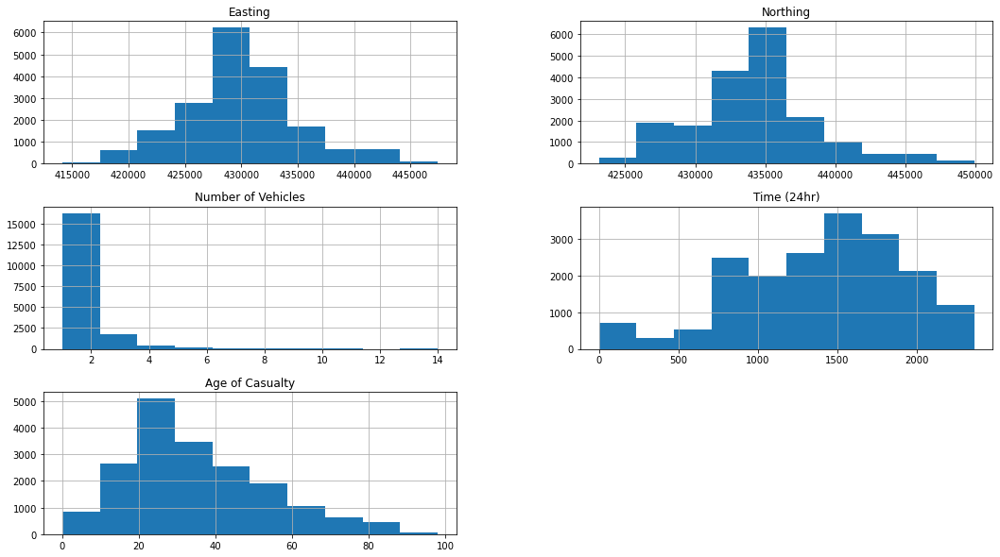

In [20]:
df.hist(figsize = (18,10))
plt.show()

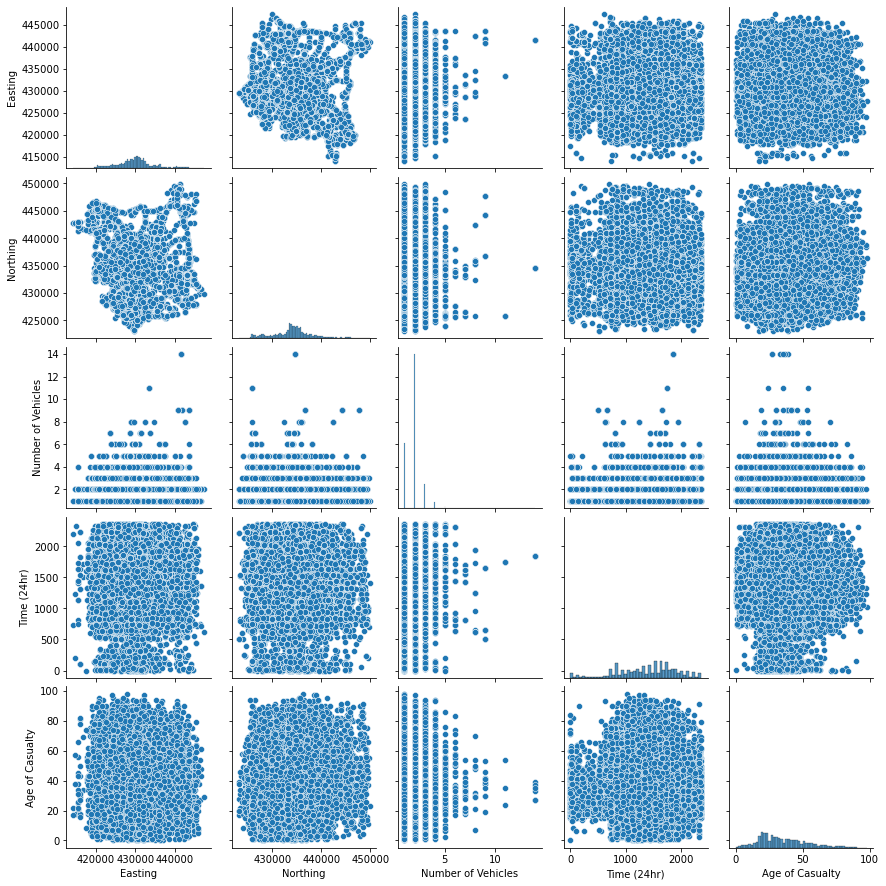

In [21]:
import seaborn as sns
%matplotlib inline
sns.pairplot(df)

Looking for outliers

C:\Users\edmun\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\edmun\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\edmun\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\edmun\anaconda3\lib\si

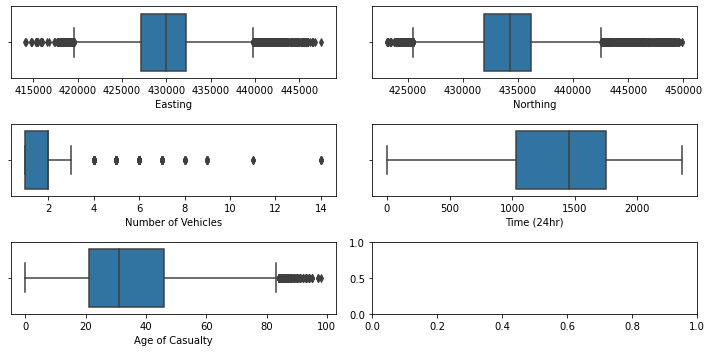

In [22]:
fig, axs = plt.subplots(3, 2, figsize = (10, 5))
plt1 = sns.boxplot(df['Easting'],     ax = axs[0, 0])
plt2 = sns.boxplot(df['Northing'],       ax = axs[0, 1])
plt3 = sns.boxplot(df['Number of Vehicles'], ax = axs[1, 0])
plt4 = sns.boxplot(df['Time (24hr)'],  ax = axs[1, 1])
plt5 = sns.boxplot(df['Age of Casualty'],  ax = axs[2, 0])
plt.tight_layout()

Lets change time to time format

In [23]:
def time(x):
  x = str(x)
  y = x.zfill(4)
  hour = y[:2]
  min = y[2:]
  return hour+':'+min

df['Time (24hr)'] = df['Time (24hr)'].apply(time)
df

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,3309,429093,436258,1,01-Jan-09,00:55,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,44,Car
1,2609,434723,435534,1,02-Jan-09,23:35,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Driver,Serious,Female,23,Car
2,2809,441173,433047,1,02-Jan-09,16:45,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Female,12,Car
3,3809,428487,431364,1,02-Jan-09,17:23,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,15,Car
4,3909,425928,435480,2,02-Jan-09,13:50,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,34,Car
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18881,2CV1152,430942,435672,3,31-Dec-15,19:08,A,Wet / Damp,Darkness: street lights present and lit,Raining without high winds,Passenger,Slight,Female,4,Taxi/Private hire car
18882,2CV1424,431965,435834,2,31-Dec-15,22:08,A,Dry,Darkness: street lights present and lit,Fine without high winds,Driver/Rider,Slight,Female,23,Car
18883,2CV1424,431965,435834,2,31-Dec-15,22:08,A,Dry,Darkness: street lights present and lit,Fine without high winds,Passenger,Slight,Female,23,Car
18884,31F0582,430278,434811,1,27-Nov-15,16:00,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Female,76,Car


1 reference number for each vehicle crash so for 10MU005317 year 2010 it was a mini bus 12 people onboard.

In [25]:
df['Reference Number'].describe()


count           18746
unique          13711
top       10MU0005317
freq               12
Name: Reference Number, dtype: object

In [26]:
df['Easting'].describe()

count     18746.000000
mean     429977.525445
std        5026.993600
min      414118.000000
25%      427146.250000
50%      429999.000000
75%      432192.000000
max      447413.000000
Name: Easting, dtype: float64

In [27]:
df['Easting'].nunique()

8615

In [28]:
df['Easting'].value_counts()

431884    31
432513    21
431883    21
431402    18
432172    18
          ..
429354     1
432290     1
422699     1
420842     1
424719     1
Name: Easting, Length: 8615, dtype: int64

In [29]:
df['Northing'].nunique()

8183

In [30]:
df['Northing'].value_counts()

435025    31
433450    22
433457    18
433800    18
439313    17
          ..
438300     1
432385     1
438271     1
435002     1
434528     1
Name: Northing, Length: 8183, dtype: int64

Easting and Northing are grid reference numbers on a map from Leeds.

In [31]:
print("1st Road Class \n", df["1st Road Class"].unique(), "\n")

# Road surface 5?
print("Road Surface \n", df["Road Surface"].unique(), "\n")

# Lighting conditions 5?
print("Lighting Conditions \n", df["Lighting Conditions"].unique(), "\n")

#Darkness: street lighting unknown? Wrong column?
print("Weather Conditions \n", df["Weather Conditions"].unique(), "\n")

print("Casualty Class \n", df["Casualty Class"].unique(), "\n")
print("Casualty Severity \n", df["Casualty Severity"].unique(), "\n")
print("Sex of Casualty \n", df["Sex of Casualty"].unique(), "\n")
print("Type of Vehicle \n", df["Type of Vehicle"].unique(), "\n")

1st Road Class 
 ['Unclassified' 'A' 'A(M)' 'B' 'Motorway' 'C'] 

Road Surface 
 ['Dry' 'Wet / Damp' 'Frost / Ice' 'Snow' 'Flood' 'Frost/ Ice' '5'
 'Flood (surface water over 3cm deep)'] 

Lighting Conditions 
 ['Darkness: street lights present and lit'
 'Daylight: street lights present' 'Darkness: no street lighting'
 'Darkness: street lighting unknown'
 'Darkness: street lights present but unlit' '5'] 

Weather Conditions 
 ['Fine without high winds' 'Other' 'Raining without high winds'
 'Raining with high winds' 'Snowing without high winds' 'Unknown'
 'Fog or mist – if hazard' 'Fine with high winds'
 'Snowing with high winds' 'Darkness: street lighting unknown'] 

Casualty Class 
 ['Pedestrian' 'Driver' 'Passenger' 'Driver/Rider'] 

Casualty Severity 
 ['Slight' 'Serious' 'Fatal'] 

Sex of Casualty 
 ['Male' 'Female'] 

Type of Vehicle 
 ['Car' 'Bus or coach (17 or more passenger seats)' 'Taxi/Private hire car'
 'M/cycle 50cc and under' 'Pedal cycle' 'Other Vehicle '
 'Motorcycle ov

### Road Surface '5'

In [32]:
df[df['Road Surface'] == '5']

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
4510,10AA0005243,427519,435871,2,20-Jul-10,18:55,B,5,Daylight: street lights present,Raining without high winds,Driver,Slight,Female,20,Car
4511,10AA0005243,427519,435871,2,20-Jul-10,18:55,B,5,Daylight: street lights present,Raining without high winds,Passenger,Slight,Female,20,Car
8430,110577292,426648,441801,2,18-Dec-11,23:05,A,5,Darkness: street lights present and lit,Fine without high winds,Driver,Slight,Male,37,Car
9659,120251571,442501,434488,2,10-Jun-12,20:15,Motorway,5,Darkness: street lighting unknown,Raining with high winds,Driver,Slight,Male,22,Car
10986,120513100,426982,440718,1,25-Nov-12,04:55,A,5,Darkness: street lights present and lit,Raining with high winds,Driver,Slight,Male,33,Car
11216,120554538,425886,429879,2,22-Dec-12,12:45,A,5,Daylight: street lights present,Raining without high winds,Driver,Slight,Female,21,Car
11217,120554538,425886,429879,2,22-Dec-12,12:45,A,5,Daylight: street lights present,Raining without high winds,Driver,Slight,Male,54,Car


ref number 10AA0005243 happened in Rain so, reasonable assumption road was wet.
Change Road Surfacen '5' to 'Wet / Damp'

In [33]:
df['Road Surface'] = np.where(df['Reference Number'] == '10AA0005243', 'Wet / Damp', df['Road Surface'])


ref number 120251571 happened in Rain so, reasonable assumption road was wet.
Change Road Surfacen '5' to 'Wet / Damp'

In [34]:
df['Road Surface'] = np.where(df['Reference Number'] == 120251571, 'Wet / Damp', df['Road Surface'])

ref number 120513100 happened in Rain so, reasonable assumption road was wet.
Change Road Surfacen '5' to 'Wet / Damp'

In [35]:
df['Road Surface'] = np.where(df['Reference Number'] == 120513100, 'Wet / Damp', df['Road Surface'])

ref number 120554538 happened in Rain so, reasonable assumption road was wet.
Change Road Surfacen '5' to 'Wet / Damp'

In [37]:
df['Road Surface'] = np.where(df['Reference Number'] == 120554538, 'Wet / Damp', df['Road Surface'])

In [38]:
df['Road Surface'].mode()

0    Dry
dtype: object

ref number 120554538 happened in Fine weather so, reasonable assumption road was dry.
Also Dry is the mode so not a bad option to change. 
Change Road Surfacen '5' to 'Dry'

In [39]:
df['Road Surface'] = np.where(df['Reference Number'] == 110577292, 'Dry', df['Road Surface'])

In [40]:
df[df['Road Surface'] == '5']

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle


### Lighting Conditions '5'

In [41]:
df[df['Lighting Conditions'] == '5']

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
10113,120345671,429425,435416,1,08-Aug-12,17:30,Unclassified,Dry,5,Fine without high winds,Pedestrian,Serious,Male,12,Car
10459,120409994,439839,433194,4,21-Sep-12,19:15,A,Dry,5,Fine without high winds,Driver,Slight,Male,77,Car
10460,120409994,439839,433194,4,21-Sep-12,19:15,A,Dry,5,Fine without high winds,Driver,Slight,Male,69,Car
10461,120409994,439839,433194,4,21-Sep-12,19:15,A,Dry,5,Fine without high winds,Passenger,Slight,Female,66,Car
10462,120409994,439839,433194,4,21-Sep-12,19:15,A,Dry,5,Fine without high winds,Passenger,Slight,Female,54,Car
10891,120493132,430630,435270,2,09-Nov-12,23:50,Unclassified,Dry,5,Fine without high winds,Passenger,Slight,Female,26,Car
11056,120525424,436342,430693,2,03-Dec-12,06:55,Unclassified,Frost / Ice,5,Fine without high winds,Driver,Slight,Male,44,Car
11057,120525424,436342,430693,2,03-Dec-12,06:55,Unclassified,Frost / Ice,5,Fine without high winds,Driver,Slight,Male,34,Car
11058,120525424,436342,430693,2,03-Dec-12,06:55,Unclassified,Frost / Ice,5,Fine without high winds,Passenger,Slight,Male,36,Car


In [42]:
['Darkness: street lights present and lit'
 'Daylight: street lights present' 'Darkness: no street lighting'
 'Darkness: street lighting unknown'
 'Darkness: street lights present but unlit' '5']

['Darkness: street lights present and litDaylight: street lights presentDarkness: no street lightingDarkness: street lighting unknownDarkness: street lights present but unlit5']

Aug 8th sunset @ 21.07 so, ref number 120345671 happened in daylight.
Change Lighting Condition '5' to 'Daylight: street lights present'

In [43]:
df['Lighting Conditions'] = np.where(df['Reference Number'] == 120345671, 'Daylight: street lights present', df['Lighting Conditions'])


Nov 12th @23.50 it would be dark  so, ref number 120493132 happened in dark.
Change Lighting Condition '5' to 'Darkness: street lighting unknown'

In [45]:
df['Lighting Conditions'] = np.where(df['Reference Number'] == 120493132, 'Darkness: street lighting unknown', df['Lighting Conditions'])


Dec 3rd @ 6:55 it would be dark  so, ref number 120525424 happened in dark.
Change Lighting Condition '5' to 'Darkness: street lighting unknown'

In [46]:
df['Lighting Conditions'] = np.where(df['Reference Number'] == 120525424, 'Darkness: street lighting unknown', df['Lighting Conditions'])


Sep 21st daylight ends at 20:24 so, ref number 120409994 happened in daylight.
Change Lighting Condition '5' to 'Daylight: street lights present'

In [48]:
df['Lighting Conditions'] = np.where(df['Reference Number'] == 120409994, 'Daylight: street lights present', df['Lighting Conditions'])

In [49]:
df[df['Lighting Conditions'] == '5']

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle


### Weather Conditions 'Darkness street lighting unknown'

In [50]:
df[df['Weather Conditions'] == 'Darkness: street lighting unknown']

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
14262,1420276,425823,433131,1,02-Apr-14,08:18,Unclassified,Wet / Damp,Daylight: street lights present,Darkness: street lighting unknown,Pedestrian,Serious,Female,12,Car
14266,1430163,422919,434104,2,03-Apr-14,06:23,A,Wet / Damp,Darkness: street lights present and lit,Darkness: street lighting unknown,Driver,Slight,Male,41,Car


In [51]:
df['Weather Conditions'] = df['Weather Conditions'].replace(['Darkness: street lighting unknown'],'Unknown')

In [52]:
print("Weather Conditions \n", df["Weather Conditions"].unique())

Weather Conditions 
 ['Fine without high winds' 'Other' 'Raining without high winds'
 'Raining with high winds' 'Snowing without high winds' 'Unknown'
 'Fog or mist – if hazard' 'Fine with high winds'
 'Snowing with high winds']


We will now create a Pie chart to represent Male and Female

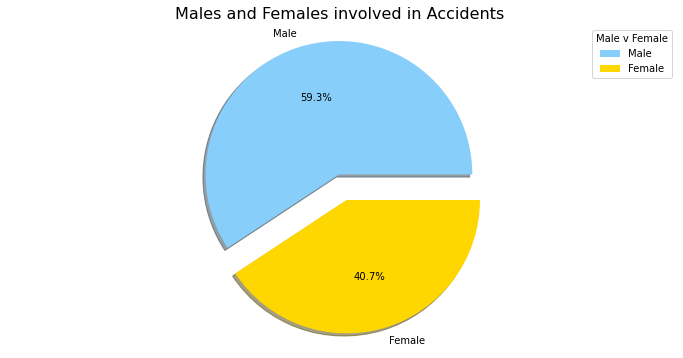

In [54]:
chart = df["Sex of Casualty"].value_counts()

fig, ax = plt.subplots(figsize = (12,6))

labels = ['Male', 'Female']
ax.pie(chart, labels=labels, explode = (0, 0.2) , autopct='%1.1f%%', shadow=True, colors=['lightskyblue','gold'])

ax.axis('equal')

plt.title("Males and Females involved in Accidents ", fontsize=16)
plt.legend(title='Male v Female')

plt.show()

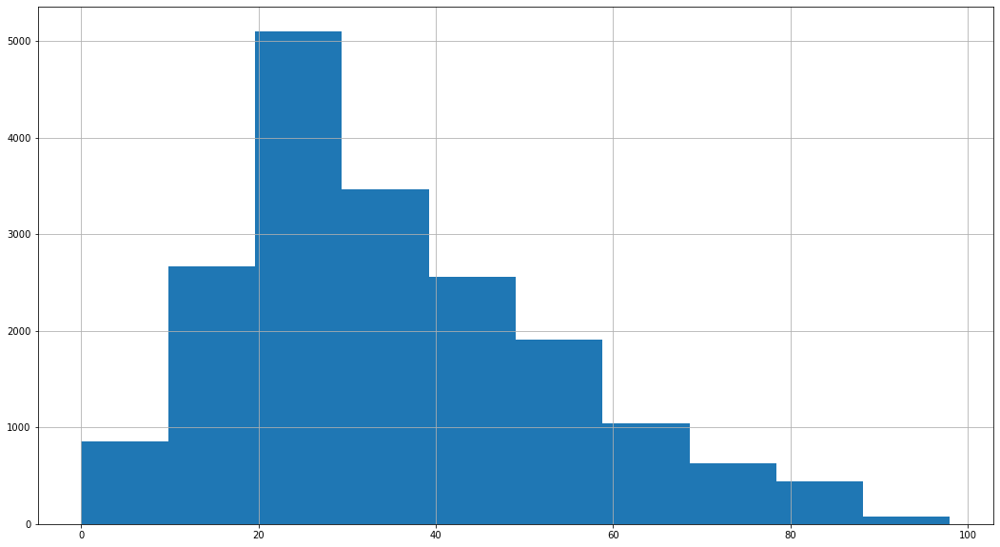

In [55]:
df['Age of Casualty'].hist(figsize = (18,10))
plt.show()

In [56]:
df['Accident Date'] = pd.to_datetime(df['Accident Date'])

df = df.reset_index(drop=True)
df.head()

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,3309,429093,436258,1,2009-01-01,00:55,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,44,Car
1,2609,434723,435534,1,2009-01-02,23:35,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Driver,Serious,Female,23,Car
2,2809,441173,433047,1,2009-01-02,16:45,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Female,12,Car
3,3809,428487,431364,1,2009-01-02,17:23,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,15,Car
4,3909,425928,435480,2,2009-01-02,13:50,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,34,Car


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18746 entries, 0 to 18745
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Reference Number     18746 non-null  object        
 1   Easting              18746 non-null  int64         
 2   Northing             18746 non-null  int64         
 3   Number of Vehicles   18746 non-null  int64         
 4   Accident Date        18746 non-null  datetime64[ns]
 5   Time (24hr)          18746 non-null  object        
 6   1st Road Class       18746 non-null  object        
 7   Road Surface         18746 non-null  object        
 8   Lighting Conditions  18746 non-null  object        
 9   Weather Conditions   18746 non-null  object        
 10  Casualty Class       18746 non-null  object        
 11  Casualty Severity    18746 non-null  object        
 12  Sex of Casualty      18746 non-null  object        
 13  Age of Casualty      18746 non-

In [58]:
data_numerical = df[['Easting','Northing','Number of Vehicles', 'Age of Casualty']]
data_categorical = df[['1st Road Class', 'Road Surface', 'Lighting Conditions', 'Weather Conditions', 'Casualty Class', 'Casualty Severity', 
                       'Sex of Casualty', 'Type of Vehicle']]

I will now crea a Histogram to visualize the 4 numerical variables

C:\Users\edmun\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\edmun\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\edmun\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

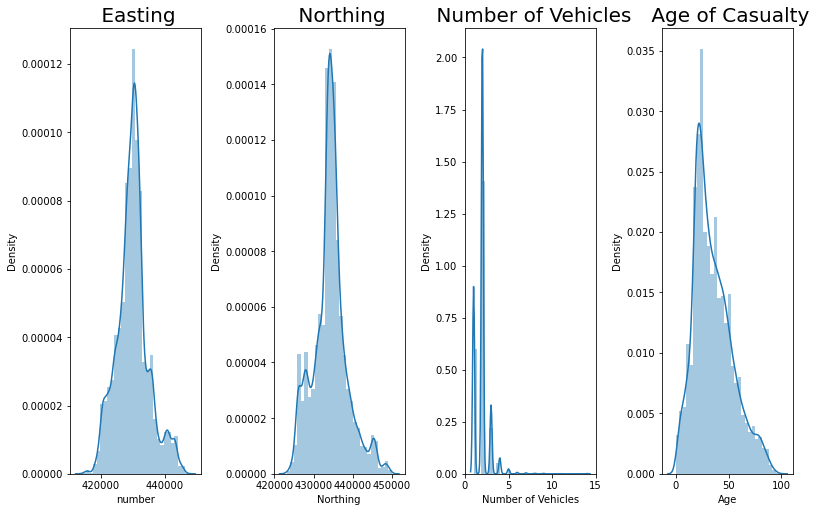

In [59]:
def plot_hist(col, bins=30, title="", xlabel="", ax=None):
    sns.distplot(col, bins=bins,ax=ax)
    ax.set_title(f' {title}',fontsize=20)
    ax.set_xlabel(xlabel)
 
fig, axes = plt.subplots(1,4, figsize=(11,7), constrained_layout=True)
plot_hist(df.Easting,
          title='Easting',
          xlabel="number",
          ax=axes[0])
plot_hist(df.Northing,
          bins=30,
          title='Northing',
          xlabel='Northing',
          ax=axes[1])
plot_hist(df['Number of Vehicles'],
          title='Number of Vehicles', 
          xlabel='Number of Vehicles',
          ax=axes[2])
plot_hist(df['Age of Casualty'],
          title='Age of Casualty', 
          xlabel='Age',
          ax=axes[3])

plt.show()

In [60]:
df['Lighting Conditions'] = np.where(df['Reference Number'] == 120345671, 'Daylight: street lights present', df['Lighting Conditions'])


In [61]:
df_fatal = np.where(df['Casualty Severity'] == 'Fatal')
df_fatal

(array([   23,   194,   885,   887,   888,   927,   944,  1095,  1098,
         1304,  1383,  1433,  1464,  1678,  1679,  1693,  1816,  1895,
         2470,  2627,  2910,  2948,  3403,  3615,  3702,  3778,  3789,
         3869,  3961,  4014,  4198,  4376,  4610,  4669,  4690,  4973,
         4974,  5310,  5479,  5756,  5774,  5855,  5951,  6252,  6257,
         6423,  6425,  6532,  6558,  6841,  6862,  6963,  7050,  7111,
         7237,  7238,  7239,  7321,  7360,  7764,  7797,  8124,  8184,
         8276,  8305,  8332,  8433,  8473,  8474,  8728,  8783,  8934,
         8938,  8964,  9180,  9184,  9224,  9345,  9700,  9775, 10041,
        10707, 11208, 11250, 11429, 11458, 11898, 12080, 12195, 12414,
        12478, 12718, 12809, 12815, 13163, 13277, 13416, 13926, 14268,
        14427, 14644, 14950, 14951, 14979, 15045, 15120, 15255, 15260,
        15261, 15332, 15334, 15339, 15417, 15591, 15842, 15897, 15949,
        16013, 16072, 16073, 16150, 16174, 16528, 16529, 16885, 17004,
      

The follwoing chart will represent stroke vs non stroke

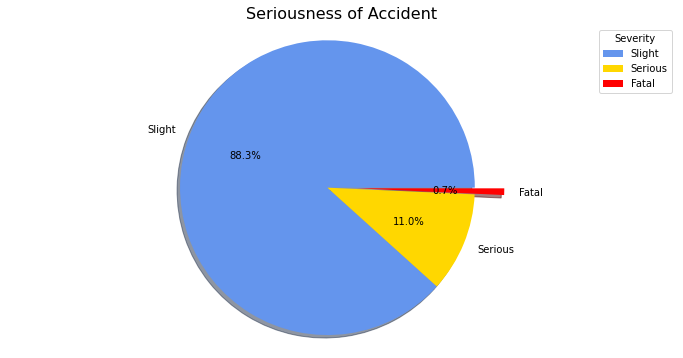

In [63]:

chart = df['Casualty Severity'].value_counts()

fig, ax = plt.subplots(figsize=(12,6))

labels = ['Slight', 'Serious', 'Fatal']
ax.pie(chart, labels=labels, explode=(0, 0, 0.2) , autopct='%1.1f%%', shadow=True, colors=['cornflowerblue','gold', 'red'])

ax.axis('equal')

plt.title("Seriousness of Accident", fontsize=16)
plt.legend(title='Severity')

plt.show()

## Clustering using KPrototype

### Using init 'Huang'

In [64]:
df_norm = df.copy()
df_norm = df_norm.drop(['Reference Number'], axis = 1)
df_norm = df_norm[:100]
df_norm

,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,429093,436258,1,2009-01-01,00:55,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,44,Car
1,434723,435534,1,2009-01-02,23:35,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Driver,Serious,Female,23,Car
2,441173,433047,1,2009-01-02,16:45,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Female,12,Car
3,428487,431364,1,2009-01-02,17:23,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,15,Car
4,425928,435480,2,2009-01-02,13:50,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,34,Car
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,428344,431608,2,2009-01-15,13:30,Motorway,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,36,Car
96,432998,436045,1,2009-01-16,00:15,A,Wet / Damp,Darkness: street lights present and lit,Raining without high winds,Driver,Serious,Male,38,Motorcycle over 500cc
97,430330,433321,2,2009-01-16,14:04,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Female,25,Bus or coach (17 or more passenger seats)
98,430330,433321,2,2009-01-16,14:04,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Female,53,Bus or coach (17 or more passenger seats)


In [65]:
'''
from kmodes.kprototypes import KPrototypes
import seaborn as sns

num_clusters = list(range(1, 10))
cost_values = []
# calculate cost values for each number of clusters (2 to 10)
for k in num_clusters:
    kproto = KPrototypes(n_clusters=k, init='Huang', random_state=42)
    kproto.fit_predict(df_norm, categorical= [3, 4, 5, 6, 7, 8, 9, 10, 11, 13])
    cost_values.append(kproto.cost_)
# plot cost against number of clusters
ax = sns.lineplot(x=num_clusters, y=cost_values, marker="o")
ax.set_title('Elbow curve', fontsize=14)
ax.set_xlabel('No of clusters', fontsize=11)
ax.set_ylabel('Cost', fontsize=11)
'''

'\nfrom kmodes.kprototypes import KPrototypes\nimport seaborn as sns\n\nnum_clusters = list(range(1, 10))\ncost_values = []\n# calculate cost values for each number of clusters (2 to 10)\nfor k in num_clusters:\n    kproto = KPrototypes(n_clusters=k, init=\'Huang\', random_state=42)\n    kproto.fit_predict(df_norm, categorical= [3, 4, 5, 6, 7, 8, 9, 10, 11, 13])\n    cost_values.append(kproto.cost_)\n# plot cost against number of clusters\nax = sns.lineplot(x=num_clusters, y=cost_values, marker="o")\nax.set_title(\'Elbow curve\', fontsize=14)\nax.set_xlabel(\'No of clusters\', fontsize=11)\nax.set_ylabel(\'Cost\', fontsize=11)\n'

### Using init 'Cao'

In [67]:
df_norm = df.copy()
df_norm = df_norm.drop(['Reference Number'], axis = 1)
df_norm = df_norm[:100]
df_norm

,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,429093,436258,1,2009-01-01,00:55,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,44,Car
1,434723,435534,1,2009-01-02,23:35,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Driver,Serious,Female,23,Car
2,441173,433047,1,2009-01-02,16:45,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Female,12,Car
3,428487,431364,1,2009-01-02,17:23,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,15,Car
4,425928,435480,2,2009-01-02,13:50,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,34,Car
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,428344,431608,2,2009-01-15,13:30,Motorway,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,36,Car
96,432998,436045,1,2009-01-16,00:15,A,Wet / Damp,Darkness: street lights present and lit,Raining without high winds,Driver,Serious,Male,38,Motorcycle over 500cc
97,430330,433321,2,2009-01-16,14:04,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Female,25,Bus or coach (17 or more passenger seats)
98,430330,433321,2,2009-01-16,14:04,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Female,53,Bus or coach (17 or more passenger seats)


I will now calculate cost values for each number of clusters (2 to 10) and plot cost against number of clusters

Text(0, 0.5, 'Cost')

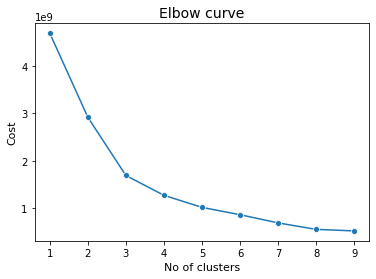

In [68]:
from kmodes.kprototypes import KPrototypes

num_clusters = list(range(1, 10))
cost_values = []

for k in num_clusters:
    kproto = KPrototypes(n_clusters=k, init='Cao', random_state=42)
    kproto.fit_predict(df_norm, categorical= [3, 4, 5, 6, 7, 8, 9, 10, 11, 13])
    cost_values.append(kproto.cost_)

ax = sns.lineplot(x=num_clusters, y=cost_values, marker="o")
ax.set_title('Elbow curve', fontsize=14)
ax.set_xlabel('No of clusters', fontsize=11)
ax.set_ylabel('Cost', fontsize=11)

I will join data with labels

In [70]:
kproto = KPrototypes(n_clusters=5, init='Cao')
clusters = kproto.fit_predict(df_norm, categorical=[3, 4, 5, 6, 7, 8, 9, 10, 11, 13])
labels = pd.DataFrame(clusters)
labeled_df = pd.concat((df_norm,labels),axis=1)
labeled_df = labeled_df.rename({0:'labels'},axis=1)

In [71]:
labeled_df.head()

,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle,labels
0,429093,436258,1,2009-01-01,00:55,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,44,Car,4
1,434723,435534,1,2009-01-02,23:35,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Driver,Serious,Female,23,Car,0
2,441173,433047,1,2009-01-02,16:45,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Female,12,Car,0
3,428487,431364,1,2009-01-02,17:23,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,15,Car,3
4,425928,435480,2,2009-01-02,13:50,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,34,Car,4


Lets see the size of each cluster

In [72]:
labeled_df["labels"].value_counts()

0    33
4    26
3    24
2    11
1     6
Name: labels, dtype: int64

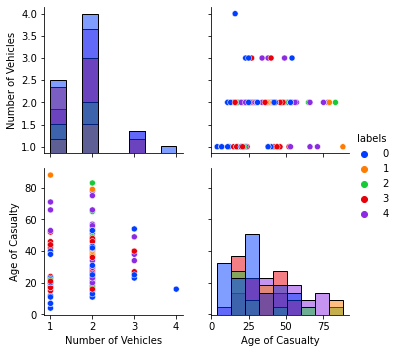

In [73]:
g = sns.PairGrid(labeled_df[['Number of Vehicles', 'Age of Casualty', "labels"]], hue = "labels", palette = 'bright')
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

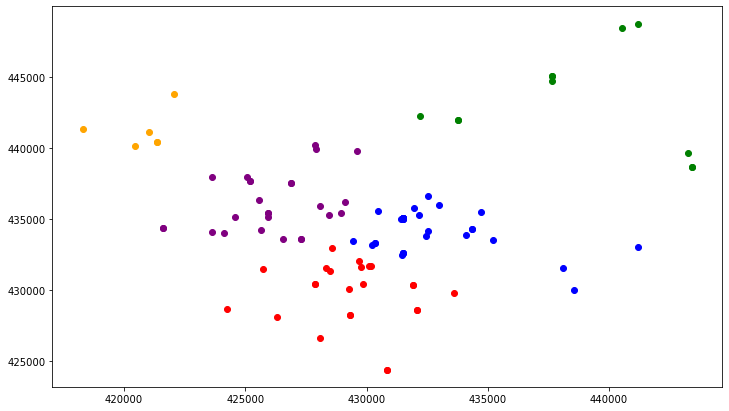

In [77]:
plt.figure(figsize=(12,7))
ax = plt.scatter(data = labeled_df[labeled_df['labels'] == 0], x='Easting', y='Northing', c = 'blue', label = '0')
ax = plt.scatter(data = labeled_df[labeled_df['labels'] == 1], x='Easting', y='Northing', c = 'orange', label = '1')
ax = plt.scatter(data = labeled_df[labeled_df['labels'] == 2], x='Easting', y='Northing', c = 'green', label = '2')
ax = plt.scatter(data = labeled_df[labeled_df['labels'] == 3], x='Easting', y='Northing', c = 'red', label = '3')
ax = plt.scatter(data = labeled_df[labeled_df['labels'] == 4], x='Easting', y='Northing', c = 'purple', label = '4')
ax = plt.scatter(data = labeled_df[labeled_df['labels'] == 5], x='Easting', y='Northing', c = 'brown', label = '5')

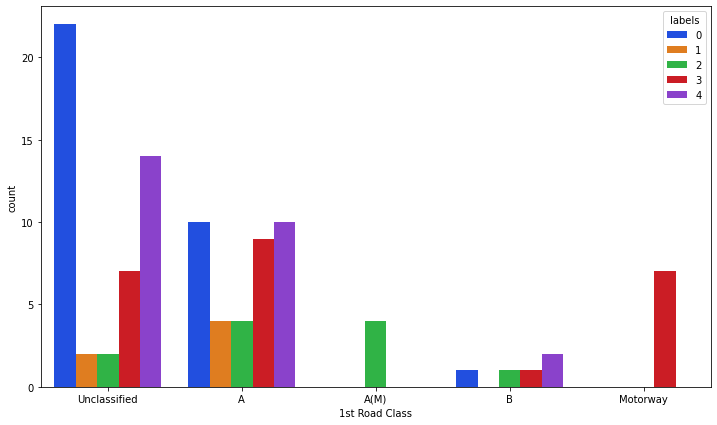

In [78]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = labeled_df, x="1st Road Class", hue = "labels", palette = 'bright' )

[Text(0, 0, 'Dry'), Text(1, 0, 'Wet / Damp'), Text(2, 0, 'Frost / Ice')]

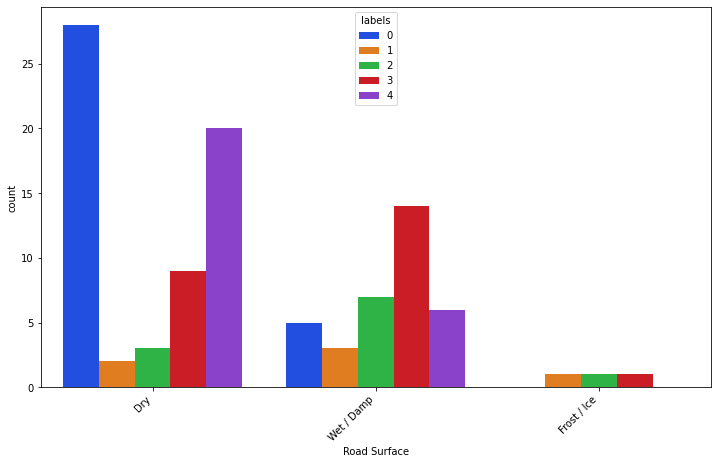

In [79]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = labeled_df, x="Road Surface", hue = "labels", palette = 'bright' )
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

[Text(0, 0, 'Fine without high winds'),
 Text(1, 0, 'Other'),
 Text(2, 0, 'Raining without high winds')]

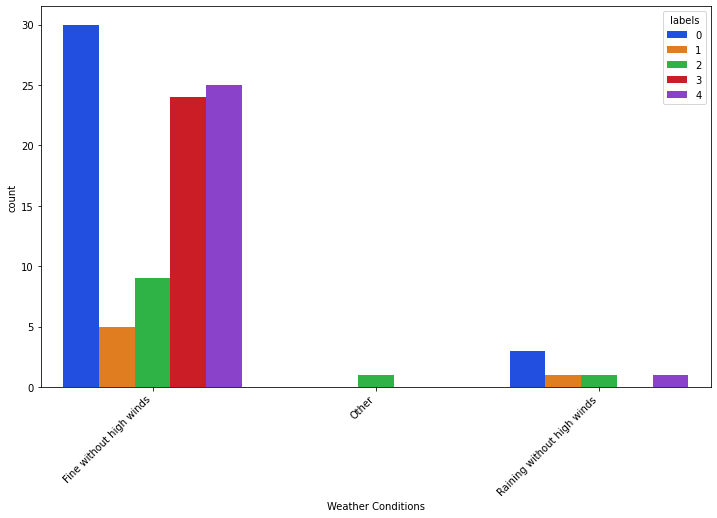

In [81]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = labeled_df, x="Weather Conditions", hue = "labels", palette = 'bright' )
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

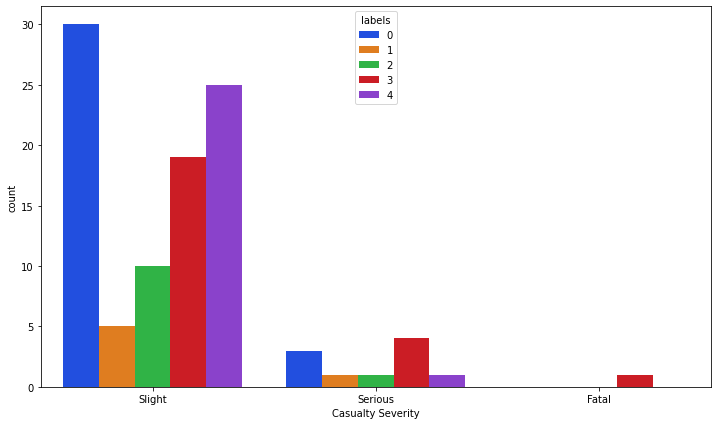

In [82]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = labeled_df, x="Casualty Severity", hue = "labels", palette = 'bright' )

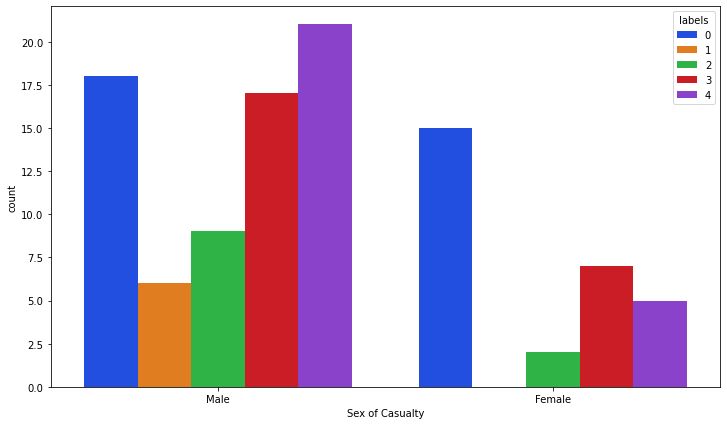

In [83]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = labeled_df, x="Sex of Casualty", hue = "labels", palette = 'bright' )

[Text(0, 0, 'Car'),
 Text(1, 0, 'Bus or coach (17 or more passenger seats)'),
 Text(2, 0, 'Taxi/Private hire car'),
 Text(3, 0, 'M/cycle 50cc and under'),
 Text(4, 0, 'Pedal cycle'),
 Text(5, 0, 'Other Vehicle '),
 Text(6, 0, 'Motorcycle over 125cc and up to 500cc'),
 Text(7, 0, 'Motorcycle over 50cc and up to 125cc'),
 Text(8, 0, 'Goods vehicle 3.5 tonnes mgw and under'),
 Text(9, 0, 'Motorcycle over 500cc'),
 Text(10, 0, 'Goods vehicle over 3.5 tonnes and under 7.5 tonnes mgw')]

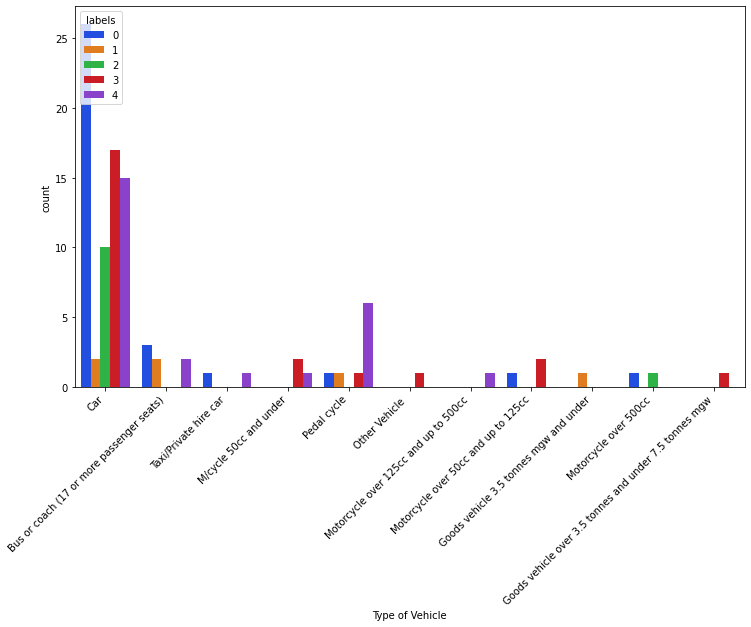

In [84]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = labeled_df, x="Type of Vehicle", hue = "labels", palette = 'bright' )
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

In [85]:
df_en = df

In [86]:
df_en = df_en.drop(['Reference Number', 'Accident Date', 'Time (24hr)', 'Number of Vehicles', 'Age of Casualty'], axis = 1)


In [87]:
df_en.head()

,Easting,Northing,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Type of Vehicle
0,429093,436258,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,Car
1,434723,435534,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Driver,Serious,Female,Car
2,441173,433047,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Female,Car
3,428487,431364,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,Car
4,425928,435480,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,Car


Lets now calculate cost values for each number of clusters and plot

Text(0, 0.5, 'Cost')

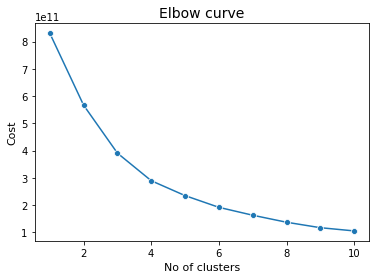

In [88]:
import seaborn as sns
from kmodes.kprototypes import KPrototypes

num_clusters = list(range(1, 11))
cost_values = []

for k in num_clusters:
    kproto = KPrototypes(n_clusters=k, init='Cao', random_state=42)
    kproto.fit_predict(df_en, categorical= [2, 3, 4, 5, 6, 7, 8, 9])
    cost_values.append(kproto.cost_)

ax = sns.lineplot(x=num_clusters, y=cost_values, marker="o")
ax.set_title('Elbow curve', fontsize=14)
ax.set_xlabel('No of clusters', fontsize=11)
ax.set_ylabel('Cost', fontsize=11)

Lets join data with labels

In [89]:
kproto = KPrototypes(n_clusters=6, init='Cao')
clusters = kproto.fit_predict(df_en, categorical=[2, 3, 4, 5, 6, 7, 8, 9])
labels = pd.DataFrame(clusters)
en_cl = pd.concat((df_en,labels),axis=1)
en_cl = en_cl.rename({0:'labels'},axis=1)

In [90]:
en_cl.head()

,Easting,Northing,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Type of Vehicle,labels
0,429093,436258,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,Car,2
1,434723,435534,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Driver,Serious,Female,Car,2
2,441173,433047,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Female,Car,0
3,428487,431364,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,Car,4
4,425928,435480,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,Car,1


Lets see the size of each cluster

In [91]:
en_cl["labels"].value_counts()

2    7571
4    3954
1    3511
0    1962
5    1054
3     694
Name: labels, dtype: int64

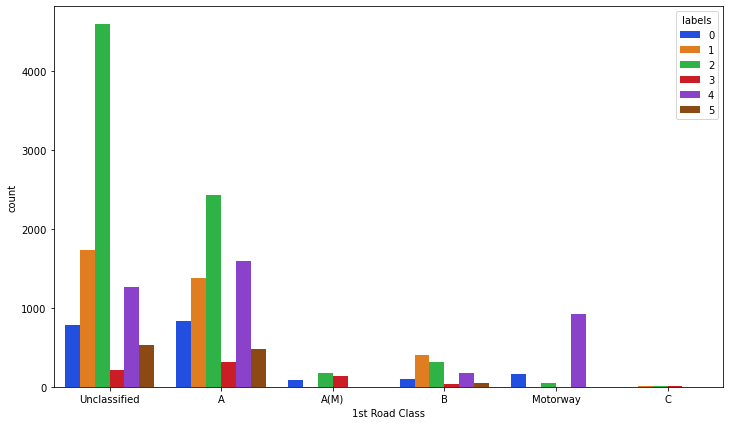

In [92]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = en_cl, x="1st Road Class", hue = "labels", palette = 'bright' )

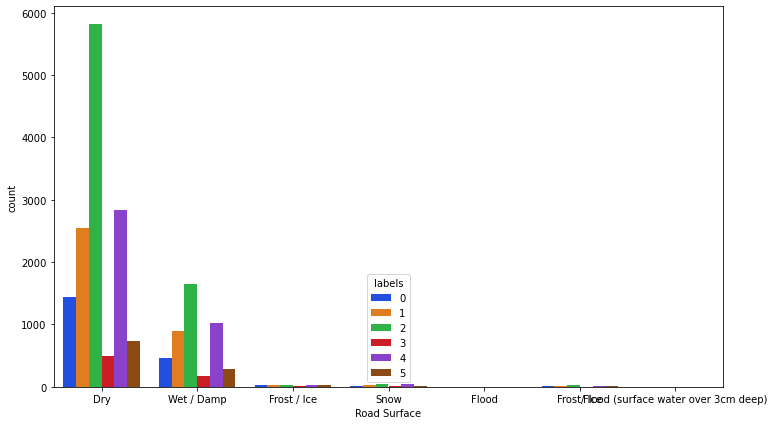

In [93]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = en_cl, x="Road Surface", hue = "labels", palette = 'bright' )

[Text(0, 0, 'Darkness: street lights present and lit'),
 Text(1, 0, 'Daylight: street lights present'),
 Text(2, 0, 'Darkness: no street lighting'),
 Text(3, 0, 'Darkness: street lighting unknown'),
 Text(4, 0, 'Darkness: street lights present but unlit')]

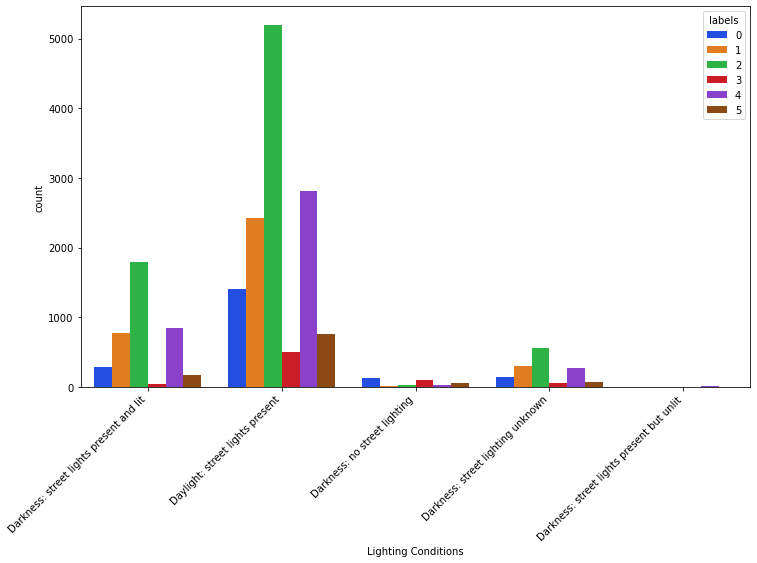

In [94]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = en_cl, x="Lighting Conditions", hue = "labels", palette = 'bright' )
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

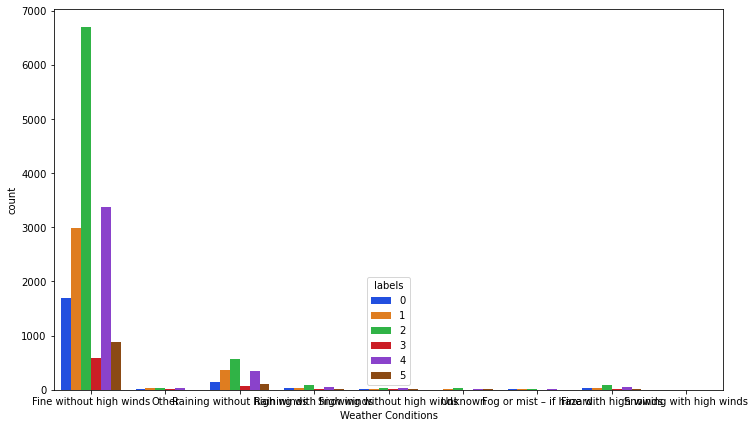

In [95]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = en_cl, x="Weather Conditions", hue = "labels", palette = 'bright' )

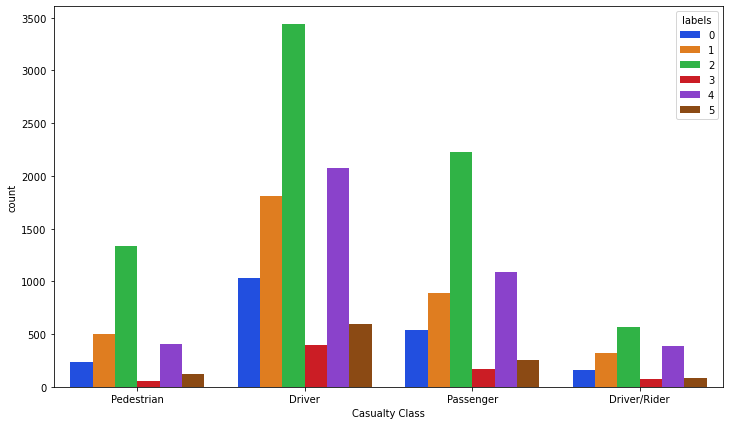

In [96]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = en_cl, x="Casualty Class", hue = "labels", palette = 'bright' )

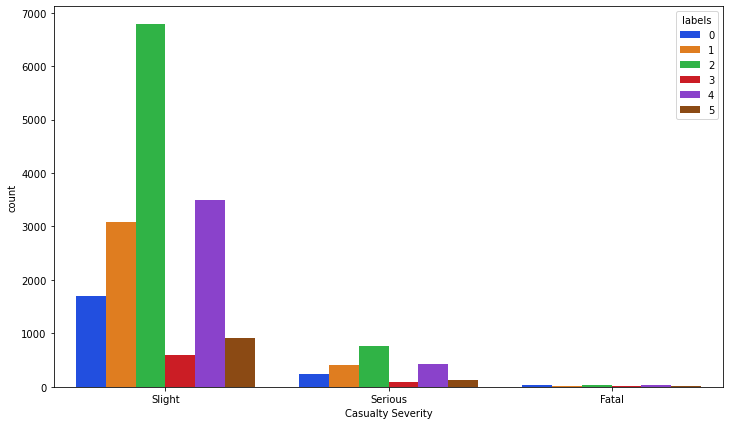

In [97]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = en_cl, x="Casualty Severity", hue = "labels", palette = 'bright' )

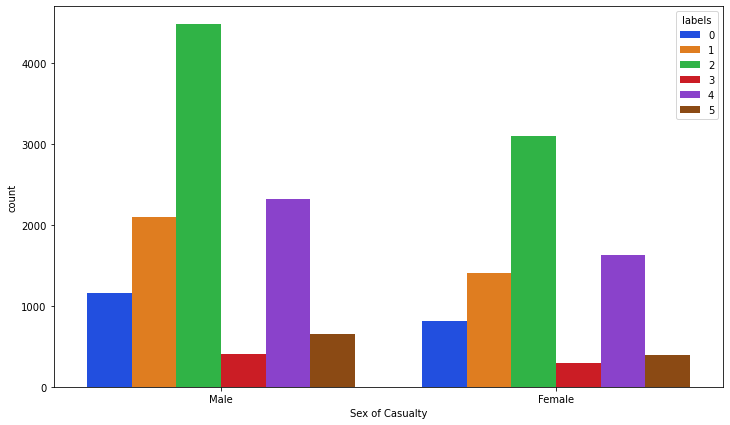

In [98]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = en_cl, x="Sex of Casualty", hue = "labels", palette = 'bright' )

[Text(0, 0, 'Car'),
 Text(1, 0, 'Bus or coach (17 or more passenger seats)'),
 Text(2, 0, 'Taxi/Private hire car'),
 Text(3, 0, 'M/cycle 50cc and under'),
 Text(4, 0, 'Pedal cycle'),
 Text(5, 0, 'Other Vehicle '),
 Text(6, 0, 'Motorcycle over 125cc and up to 500cc'),
 Text(7, 0, 'Motorcycle over 50cc and up to 125cc'),
 Text(8, 0, 'Goods vehicle 3.5 tonnes mgw and under'),
 Text(9, 0, 'Motorcycle over 500cc'),
 Text(10, 0, 'Goods vehicle over 3.5 tonnes and under 7.5 tonnes mgw'),
 Text(11, 0, 'Goods vehicle 7.5 tonnes mgw and over'),
 Text(12, 0, 'Minibus (8 – 16 passenger seats)'),
 Text(13, 0, 'Agricultural vehicle (includes diggers etc.)'),
 Text(14, 0, 'Ridden horse'),
 Text(15, 0, 'Mobility Scooter'),
 Text(16, 0, 'Motorcycle - Unknown CC'),
 Text(17, 0, 'Tram / Light rail')]

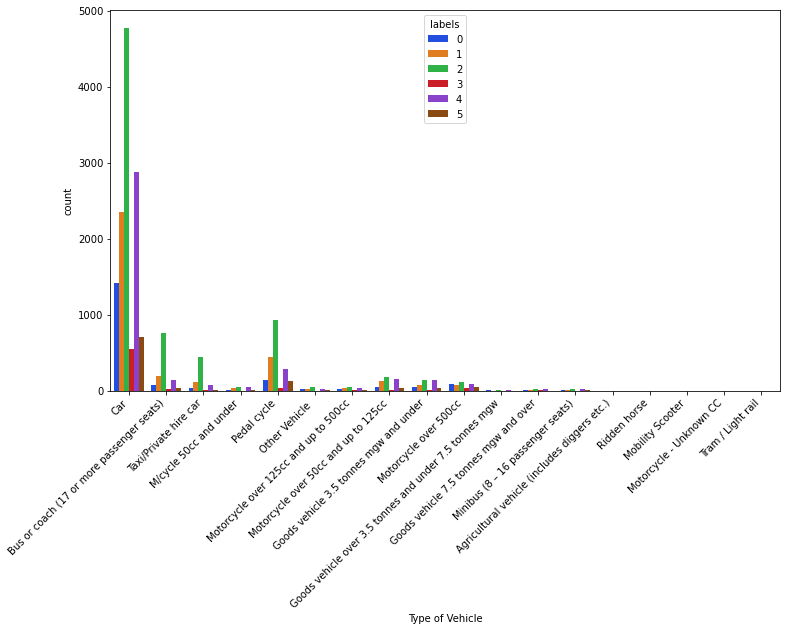

In [99]:
plt.figure(figsize=(12,7))
ax = sns.countplot(data = en_cl, x="Type of Vehicle", hue = "labels", palette = 'bright' )
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

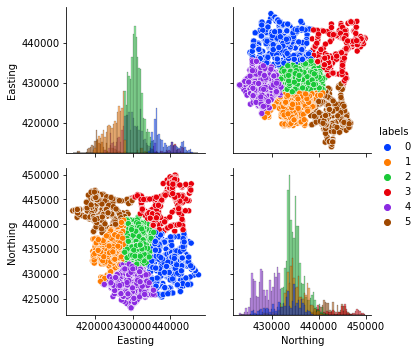

In [100]:
g = sns.PairGrid(en_cl[['Easting', 'Northing', "labels"]], hue = "labels", palette = 'bright')
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

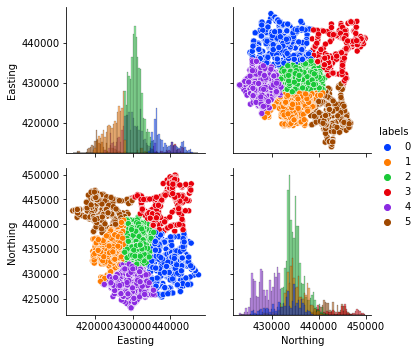

In [101]:
g = sns.PairGrid(en_cl[['Easting', 'Northing', "labels"]], hue = "labels", palette = 'bright')
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

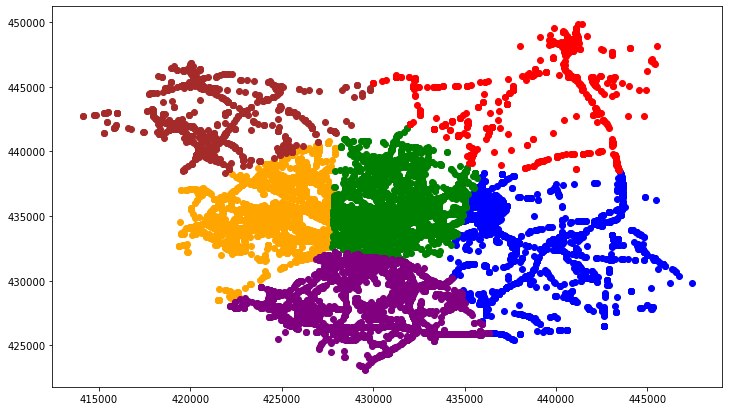

In [102]:
plt.figure(figsize=(12,7))
ax = plt.scatter(data = en_cl[en_cl['labels'] == 0], x='Easting', y='Northing', c = 'blue', label = '0')
ax = plt.scatter(data = en_cl[en_cl['labels'] == 1], x='Easting', y='Northing', c = 'orange', label = '1')
ax = plt.scatter(data = en_cl[en_cl['labels'] == 2], x='Easting', y='Northing', c = 'green', label = '2')
ax = plt.scatter(data = en_cl[en_cl['labels'] == 3], x='Easting', y='Northing', c = 'red', label = '3')
ax = plt.scatter(data = en_cl[en_cl['labels'] == 4], x='Easting', y='Northing', c = 'purple', label = '4')
ax = plt.scatter(data = en_cl[en_cl['labels'] == 5], x='Easting', y='Northing', c = 'brown', label = '5')

## Fatal Clusters

In [103]:
Fatal_loc = df

In [104]:
Fatal_loc = Fatal_loc.drop(['Reference Number', 'Accident Date', 'Time (24hr)', 'Number of Vehicles', 'Age of Casualty'], axis = 1)

In [105]:
Fatal_loc = Fatal_loc[Fatal_loc['Casualty Severity'] != 'Slight']

In [106]:
Fatal_loc = Fatal_loc[Fatal_loc['Casualty Severity'] != 'Slight']

In [107]:
Fatal_loc = Fatal_loc[Fatal_loc['Casualty Severity'] != 'Serious']

In [108]:
Fatal_loc = Fatal_loc.reset_index(drop=True)

In [109]:
Fatal_loc

,Easting,Northing,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Type of Vehicle
0,427890,430474,A,Wet / Damp,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Fatal,Male,Car
1,439643,436962,Unclassified,Wet / Damp,Daylight: street lights present,Fine without high winds,Driver,Fatal,Male,Car
2,437814,429825,A,Dry,Daylight: street lights present,Fine without high winds,Driver,Fatal,Male,Car
3,437814,429825,A,Dry,Daylight: street lights present,Fine without high winds,Passenger,Fatal,Male,Car
4,437814,429825,A,Dry,Daylight: street lights present,Fine without high winds,Passenger,Fatal,Male,Car
...,...,...,...,...,...,...,...,...,...,...
131,427529,426263,A,Wet / Damp,Daylight: street lights present,Fine without high winds,Driver/Rider,Fatal,Male,Motorcycle over 50cc and up to 125cc
132,440032,439599,A,Dry,Daylight: street lights present,Fine without high winds,Driver/Rider,Fatal,Male,Motorcycle over 500cc
133,441634,431830,A,Wet / Damp,Daylight: street lights present,Fine without high winds,Pedestrian,Fatal,Female,Car
134,443306,435473,B,Wet / Damp,Darkness: street lights present and lit,Fog or mist – if hazard,Pedestrian,Fatal,Male,Taxi/Private hire car


I will now calculate the cost values for each number of cluster and plot the cost against the number of clusters

Text(0, 0.5, 'Cost')

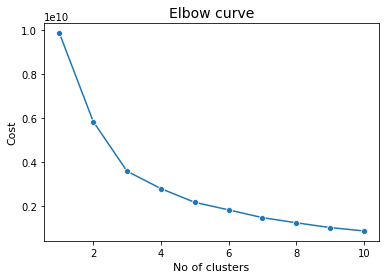

In [110]:
num_clusters = list(range(1, 11))
cost_values = []
for k in num_clusters:
    kproto = KPrototypes(n_clusters=k, init='Cao', random_state=42)
    kproto.fit_predict(Fatal_loc, categorical= [2, 3, 4, 5, 6, 7, 8, 9])
    cost_values.append(kproto.cost_)
ax = sns.lineplot(x=num_clusters, y=cost_values, marker="o")
ax.set_title('Elbow curve', fontsize=14)
ax.set_xlabel('No of clusters', fontsize=11)
ax.set_ylabel('Cost', fontsize=11)

I will join the data with the lables

In [111]:
kproto = KPrototypes(n_clusters=6, init='Cao')
clusters = kproto.fit_predict(Fatal_loc, categorical=[2, 3, 4, 5, 6, 7, 8, 9])
labels = pd.DataFrame(clusters)
Fatal_loc = pd.concat((Fatal_loc,labels),axis=1)
Fatal_loc= Fatal_loc.rename({0:'labels'},axis=1)

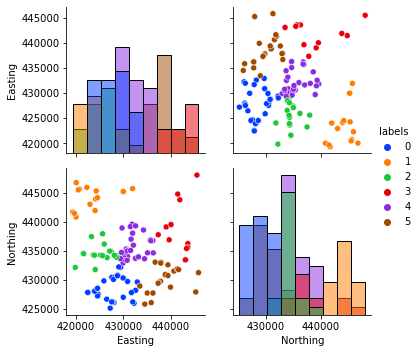

In [112]:
g = sns.PairGrid(Fatal_loc[['Easting', 'Northing', "labels"]], hue = "labels", palette = 'bright')
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

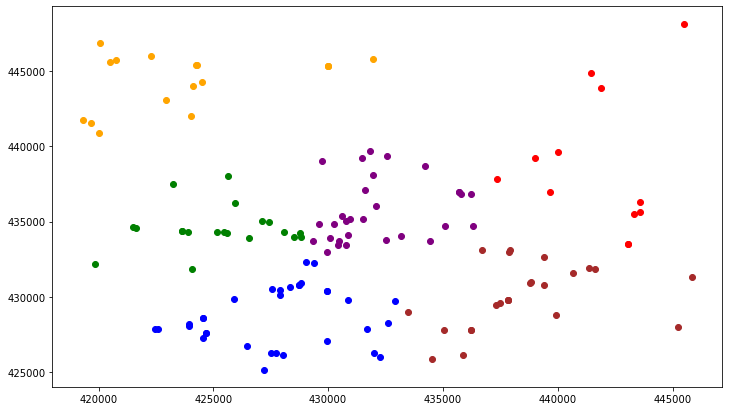

In [113]:
plt.figure(figsize=(12,7))
ax = plt.scatter(data = Fatal_loc[Fatal_loc['labels'] == 0], x='Easting', y='Northing', c = 'blue', label = '0')
ax = plt.scatter(data = Fatal_loc[Fatal_loc['labels'] == 1], x='Easting', y='Northing', c = 'orange', label = '1')
ax = plt.scatter(data = Fatal_loc[Fatal_loc['labels'] == 2], x='Easting', y='Northing', c = 'green', label = '2')
ax = plt.scatter(data = Fatal_loc[Fatal_loc['labels'] == 3], x='Easting', y='Northing', c = 'red', label = '3')
ax = plt.scatter(data = Fatal_loc[Fatal_loc['labels'] == 4], x='Easting', y='Northing', c = 'purple', label = '4')
ax = plt.scatter(data = Fatal_loc[Fatal_loc['labels'] == 5], x='Easting', y='Northing', c = 'brown', label = '5')

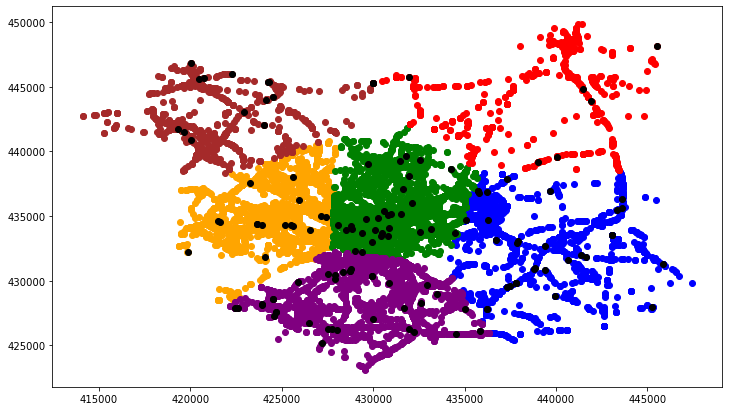

In [114]:
plt.figure(figsize=(12,7))
ax = plt.scatter(data = en_cl[en_cl['labels'] == 0], x='Easting', y='Northing', color = 'blue', label = '0')
ax = plt.scatter(data = en_cl[en_cl['labels'] == 1], x='Easting', y='Northing', c = 'orange', label = '1')
ax = plt.scatter(data = en_cl[en_cl['labels'] == 2], x='Easting', y='Northing', c = 'green', label = '2')
ax = plt.scatter(data = en_cl[en_cl['labels'] == 3], x='Easting', y='Northing', c = 'red', label = '3')
ax = plt.scatter(data = en_cl[en_cl['labels'] == 4], x='Easting', y='Northing', c = 'purple', label = '4')
ax = plt.scatter(data = en_cl[en_cl['labels'] == 5], x='Easting', y='Northing', c = 'brown', label = '5')
ax = plt.scatter(data = Fatal_loc[Fatal_loc['labels'] == 0], x='Easting', y='Northing', c = 'black', label = '0')
ax = plt.scatter(data = Fatal_loc[Fatal_loc['labels'] == 1], x='Easting', y='Northing', c = 'black', label = '1')
ax = plt.scatter(data = Fatal_loc[Fatal_loc['labels'] == 2], x='Easting', y='Northing', c = 'black', label = '2')
ax = plt.scatter(data = Fatal_loc[Fatal_loc['labels'] == 3], x='Easting', y='Northing', c = 'black', label = '3')
ax = plt.scatter(data = Fatal_loc[Fatal_loc['labels'] == 4], x='Easting', y='Northing', c = 'black', label = '4')
ax = plt.scatter(data = Fatal_loc[Fatal_loc['labels'] == 5], x='Easting', y='Northing', c = 'black', label = '5')

<Figure size 864x504 with 0 Axes>

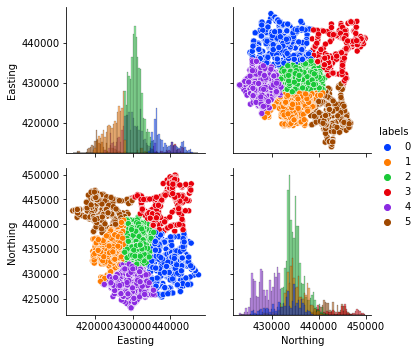

In [115]:
plt.figure(constrained_layout=True, figsize=(12,7))
g = sns.PairGrid(en_cl[['Easting', 'Northing', "labels"]], hue = "labels", palette = 'bright')
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

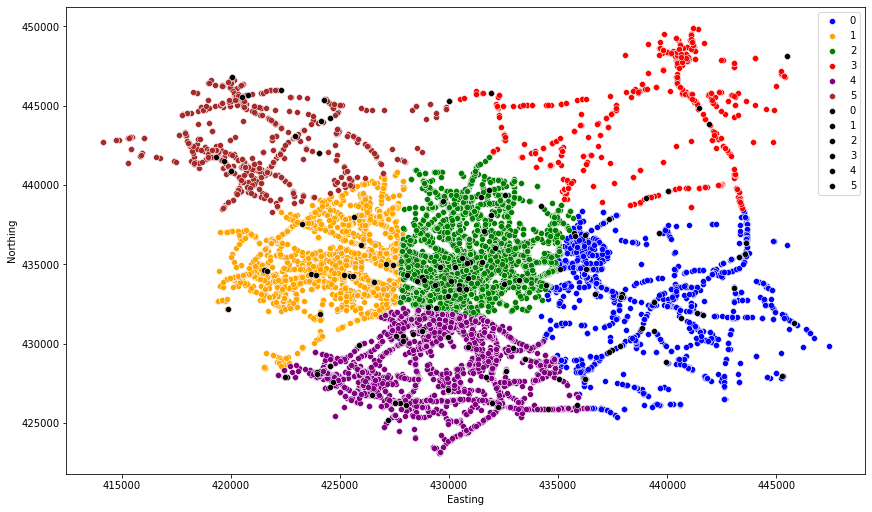

In [116]:
plt.figure(constrained_layout=True, figsize=(12,7))
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 0], x='Easting', y='Northing', color = 'blue', label = '0')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 1], x='Easting', y='Northing', color = 'orange', label = '1')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 2], x='Easting', y='Northing', color = 'green', label = '2')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 3], x='Easting', y='Northing', color = 'red', label = '3')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 4], x='Easting', y='Northing', color = 'purple', label = '4')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 5], x='Easting', y='Northing', color = 'brown', label = '5')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 0], x='Easting', y='Northing', color = 'black', label = '0')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 1], x='Easting', y='Northing', color = 'black', label = '1')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 2], x='Easting', y='Northing', color = 'black', label = '2')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 3], x='Easting', y='Northing', color = 'black', label = '3')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 4], x='Easting', y='Northing', color = 'black', label = '4')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 5], x='Easting', y='Northing', color = 'black', label = '5')

## Serious Clusters

In [117]:
Serious_loc = df

In [118]:
Serious_loc = Serious_loc.drop(['Reference Number', 'Accident Date', 'Time (24hr)', 'Number of Vehicles', 'Age of Casualty'], axis = 1)

In [119]:
Serious_loc = Serious_loc[Serious_loc['Casualty Severity'] != 'Slight']

In [120]:
Serious_loc = Serious_loc[Serious_loc['Casualty Severity'] != 'Fatal']

In [121]:
Serious_loc = Serious_loc.reset_index(drop=True)

In [122]:
Serious_loc

,Easting,Northing,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Type of Vehicle
0,434723,435534,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Driver,Serious,Female,Car
1,437665,444765,A,Dry,Darkness: no street lighting,Fine without high winds,Driver,Serious,Male,Car
2,429298,428264,Unclassified,Wet / Damp,Daylight: street lights present,Fine without high winds,Driver,Serious,Male,Car
3,431914,430363,A,Wet / Damp,Darkness: street lights present and lit,Fine without high winds,Driver,Serious,Male,Car
4,431914,430363,A,Wet / Damp,Darkness: street lights present and lit,Fine without high winds,Passenger,Serious,Female,Car
...,...,...,...,...,...,...,...,...,...,...
2050,427985,434203,Unclassified,Wet / Damp,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Serious,Male,Car
2051,435542,438370,Unclassified,Wet / Damp,Daylight: street lights present,Raining without high winds,Driver/Rider,Serious,Female,Motorcycle over 50cc and up to 125cc
2052,432438,435044,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Driver/Rider,Serious,Male,Motorcycle over 50cc and up to 125cc
2053,438941,431535,A,Wet / Damp,Daylight: street lights present,Fine without high winds,Driver/Rider,Serious,Male,Motorcycle over 500cc


In [123]:
I will calculate cost values for each number of clusters and plot cost against the number of clusters

SyntaxError: invalid syntax (<ipython-input-123-ed2ca5e8c932>, line 1)

In [ ]:
from kmodes.kprototypes import KPrototypes

num_clusters = list(range(1, 11))
cost_values = []
for k in num_clusters:
    kproto = KPrototypes(n_clusters=k, init='Cao', random_state=42)
    kproto.fit_predict(Serious_loc, categorical= [2, 3, 4, 5, 6, 7, 8, 9])
    cost_values.append(kproto.cost_)
ax = sns.lineplot(x=num_clusters, y=cost_values, marker="o")
ax.set_title('Elbow curve', fontsize=14)
ax.set_xlabel('No of clusters', fontsize=11)
ax.set_ylabel('Cost', fontsize=11)

I will join data with labels

In [ ]:
kproto = KPrototypes(n_clusters=6, init='Cao')
clusters = kproto.fit_predict(Fatal_loc, categorical=[2, 3, 4, 5, 6, 7, 8, 9])
labels = pd.DataFrame(clusters)
Serious_loc = pd.concat((Serious_loc,labels),axis=1)
Serious_loc= Serious_loc.rename({0:'labels'},axis=1)

In [ ]:
g = sns.PairGrid(Serious_loc[['Easting', 'Northing', "labels"]], hue = "labels", palette = 'bright')
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

In [ ]:
plt.figure(figsize=(12,7))
ax = plt.scatter(data = Serious_loc[Serious_loc['labels'] == 0], x='Easting', y='Northing', c = 'blue', label = '0')
ax = plt.scatter(data = Serious_loc[Serious_loc['labels'] == 1], x='Easting', y='Northing', c = 'orange', label = '1')
ax = plt.scatter(data = Serious_loc[Serious_loc['labels'] == 2], x='Easting', y='Northing', c = 'green', label = '2')
ax = plt.scatter(data = Serious_loc[Serious_loc['labels'] == 3], x='Easting', y='Northing', c = 'red', label = '3')
ax = plt.scatter(data = Serious_loc[Serious_loc['labels'] == 4], x='Easting', y='Northing', c = 'purple', label = '4')
ax = plt.scatter(data = Serious_loc[Serious_loc['labels'] == 5], x='Easting', y='Northing', c = 'brown', label = '5')

In [ ]:
plt.figure(constrained_layout=True, figsize=(12,7))
g = sns.PairGrid(en_cl[['Easting', 'Northing', "labels"]], hue = "labels", palette = 'bright')
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

In [ ]:
plt.figure(constrained_layout=True, figsize=(12,7))
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 0], x='Easting', y='Northing', color = 'blue', label = '0')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 1], x='Easting', y='Northing', color = 'orange', label = '1')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 2], x='Easting', y='Northing', color = 'green', label = '2')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 3], x='Easting', y='Northing', color = 'red', label = '3')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 4], x='Easting', y='Northing', color = 'purple', label = '4')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 5], x='Easting', y='Northing', color = 'brown', label = '5')
ax = sns.scatterplot(data = Serious_loc[Serious_loc['labels'] == 0], x='Easting', y='Northing', color = 'black', label = '0')
ax = sns.scatterplot(data = Serious_loc[Serious_loc['labels'] == 1], x='Easting', y='Northing', color = 'black', label = '1')
ax = sns.scatterplot(data = Serious_loc[Serious_loc['labels'] == 2], x='Easting', y='Northing', color = 'black', label = '2')
ax = sns.scatterplot(data = Serious_loc[Serious_loc['labels'] == 3], x='Easting', y='Northing', color = 'black', label = '3')
ax = sns.scatterplot(data = Serious_loc[Serious_loc['labels'] == 4], x='Easting', y='Northing', color = 'black', label = '4')
ax = sns.scatterplot(data = Serious_loc[Serious_loc['labels'] == 5], x='Easting', y='Northing', color = 'black', label = '5')

In [ ]:
plt.figure(constrained_layout=True, figsize=(12,7))
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 0], x='Easting', y='Northing', color = 'blue', label = '0')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 1], x='Easting', y='Northing', color = 'orange', label = '1')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 2], x='Easting', y='Northing', color = 'green', label = '2')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 3], x='Easting', y='Northing', color = 'red', label = '3')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 4], x='Easting', y='Northing', color = 'purple', label = '4')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 5], x='Easting', y='Northing', color = 'brown', label = '5')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 0], x='Easting', y='Northing', color = 'black', label = '0')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 1], x='Easting', y='Northing', color = 'black', label = '1')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 2], x='Easting', y='Northing', color = 'black', label = '2')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 3], x='Easting', y='Northing', color = 'black', label = '3')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 4], x='Easting', y='Northing', color = 'black', label = '4')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 5], x='Easting', y='Northing', color = 'black', label = '5')

In [ ]:
plt.figure(constrained_layout=True, figsize=(12,7))
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 0], x='Easting', y='Northing', color = 'black', label = '0')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 1], x='Easting', y='Northing', color = 'black', label = '1')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 2], x='Easting', y='Northing', color = 'black', label = '2')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 3], x='Easting', y='Northing', color = 'black', label = '3')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 4], x='Easting', y='Northing', color = 'black', label = '4')
ax = sns.scatterplot(data = en_cl[en_cl['labels'] == 5], x='Easting', y='Northing', color = 'black', label = '5')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 0], x='Easting', y='Northing', color = 'orange', label = '0')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 1], x='Easting', y='Northing', color = 'orange', label = '1')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 2], x='Easting', y='Northing', color = 'orange', label = '2')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 3], x='Easting', y='Northing', color = 'orange', label = '3')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 4], x='Easting', y='Northing', color = 'orange', label = '4')
ax = sns.scatterplot(data = Fatal_loc[Fatal_loc['labels'] == 5], x='Easting', y='Northing', color = 'orange', label = '5')
ax = sns.scatterplot(data = Serious_loc[Serious_loc['labels'] == 0], x='Easting', y='Northing', color = 'red', label = '0')
ax = sns.scatterplot(data = Serious_loc[Serious_loc['labels'] == 1], x='Easting', y='Northing', color = 'red', label = '1')
ax = sns.scatterplot(data = Serious_loc[Serious_loc['labels'] == 2], x='Easting', y='Northing', color = 'red', label = '2')
ax = sns.scatterplot(data = Serious_loc[Serious_loc['labels'] == 3], x='Easting', y='Northing', color = 'red', label = '3')
ax = sns.scatterplot(data = Serious_loc[Serious_loc['labels'] == 4], x='Easting', y='Northing', color = 'red', label = '4')
ax = sns.scatterplot(data = Serious_loc[Serious_loc['labels'] == 5], x='Easting', y='Northing', color = 'red', label = '5')

## Time Series

In [126]:
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

%matplotlib inline
import seaborn as sns
import datetime as datetime
from datetime import timedelta
from dateutil.relativedelta import relativedelta

from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller, acf,pacf
from statsmodels.tsa.arima_model import ARIMA, ARMA
from statsmodels.tsa.seasonal import seasonal_decompose
from pmdarima import auto_arima
from pmdarima.arima import StepwiseContext

from itertools import product
from sklearn.metrics import mean_squared_error, mean_absolute_error


# Data Preparation

Data Preparation is an integral part of every machine learning process, it is usually the first step in any data science project. Raw data, on most cases has issues like null values, irrelevant features and inconsistency that needs to be resolved before our data will be fed to the machine learning algorithm (ProjectPro, 2022).  Most ML algorithms required specific data format for it to be able to perform the task required.

Below code is where we read and save or data to a dataframe. Creating a list of the possible corrupted strings and using it as an argument to filter them while reading will save our time determining them if not done prior reading. This method will make the corrupted strings to be converted to a Null value recognized by Pandas.

In [127]:
missing_value_formats = ['n.a.','?','NA','N.A.','n/a', 'na','-','']
df_2009 = pd.read_csv(r'2009.csv', encoding='cp1252',na_values = missing_value_formats)
df_2010 = pd.read_csv(r'2010.csv', encoding='cp1252',na_values = missing_value_formats)
df_2011 = pd.read_csv(r'2011.csv', encoding='cp1252',na_values = missing_value_formats)
df_2012 = pd.read_csv(r'2012.csv', encoding='cp1252',na_values = missing_value_formats)
df_2013 = pd.read_csv(r'2013.csv', encoding='cp1252',na_values = missing_value_formats)
df_2014 = pd.read_csv(r'2014.csv', encoding='cp1252',na_values = missing_value_formats)
df_2015 = pd.read_csv(r'2015.csv', encoding='cp1252',na_values = missing_value_formats)

This is where we merge the 7 dataframes into single dataset for further analysis. Running the .head() to check if the dataframe was loaded correctly.

In [128]:
dataframe = [df_2009, df_2010, df_2011, df_2012, df_2013, df_2014, df_2015]
df = pd.concat(dataframe, ignore_index=True, axis=0)
df.head()

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle,Grid Ref: Easting,Grid Ref: Northing,Unnamed: 11,Unnamed: 15
0,3309,429093.0,436258.0,1,01-Jan-09,55,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,44,Car,NaN,NaN,NaN,NaN
1,2609,434723.0,435534.0,1,02-Jan-09,2335,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Driver,Serious,Female,23,Car,NaN,NaN,NaN,NaN
2,2809,441173.0,433047.0,1,02-Jan-09,1645,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Female,12,Car,NaN,NaN,NaN,NaN
3,3809,428487.0,431364.0,1,02-Jan-09,1723,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,15,Car,NaN,NaN,NaN,NaN
4,3909,425928.0,435480.0,2,02-Jan-09,1350,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,34,Car,NaN,NaN,NaN,NaN


Since we are dealing with Time Series project, we have to convert the date from being an 'object' to 'datetime'. This is required for some Time Series algorithm.

In [129]:
df['Accident Date']=pd.to_datetime(df['Accident Date'])

Selecting the features only required for the time series analysis. We dont need the entire dataset. Hence, irrelevant columns are dropped or preselected, this will reduce complexity and noise during our analysis. This project will forecast the number of vehicles involved in the accident.

In [130]:
df_time_series = df[['Reference Number','Number of Vehicles','Accident Date']]

In [131]:
df_time_series.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18886 entries, 0 to 18885
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Reference Number    18886 non-null  object        
 1   Number of Vehicles  18886 non-null  int64         
 2   Accident Date       18886 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 442.8+ KB


Removing duplicates while retaining one of the row, using subset as the reference number. The dataset has itemized the accident reference number to reflect the individual people's profile involved in the accident. This has caused duplication and need to be removed.

In [133]:
df_time_series.drop_duplicates(subset='Reference Number', keep='first', inplace=True)

Resampling our Time series to 'Start of Month' frequency. This will reduce the data points while retaining the signal pattern of the series. This will reduce the noise and data points on the series.

In [134]:
df_time_series_M = pd.DataFrame(df_time_series.set_index('Accident Date').resample('MS')['Number of Vehicles'].sum())
df_time_series_M.index.asfreq='MS'

After sampling, our dataset should have 84 months of data, from January 2009 to December 2015.

In [135]:
df_time_series_M.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 84 entries, 2009-01-01 to 2015-12-01
Freq: MS
Data columns (total 1 columns):
 #   Column              Non-Null Count  Dtype
---  ------              --------------  -----
 0   Number of Vehicles  84 non-null     int64
dtypes: int64(1)
memory usage: 1.3 KB


In [136]:
df_time_series_M.head()

,Number of Vehicles
Accident Date,
2009-01-01,313
2009-02-01,270
2009-03-01,303
2009-04-01,304
2009-05-01,329


# Plotting the Time Series - Visualizing the Signal

Using Plotly express, The plot will be interactive and values will appear when hoovered on the actual line graph. The graph can be zoomed as well.

In [137]:
import plotly.express as px

px.defaults.template = "ggplot2"
fig = px.line(df_time_series_M, y='Number of Vehicles',width=950, height=750)
fig.update_traces(line_color="#0c8f8f")

m = dict(
    l = 10,
    r = 10,
    b= 80,
    t = 80,
    pad = 30)
    

fig.update_layout(margin=m,paper_bgcolor="#bdbfc0")
fig.update_yaxes(title_text='<b>Number of Vehicles</b>', row=1, 
                 col=1,tickfont_size=10,titlefont = dict(size = 14))
fig.update_xaxes(title_text='<b>Accident Date</b>', row=1, 
                 col=1,tickfont_size=10,titlefont = dict(size = 14))
    
fig.show()

Visual Findings:

1. The time series shows trend going down from 2019 up to 2013 and picking up after that.
2. Seasonality is evident as well, the number of vehicles is drop every beginning of the year and higher mid-year.

# Descriptive Analysis of the Time Series Data

Describing the time series using statistical and employing python libraries is essential part of the analysis. Using these techniques will determine patterns and tests that will help us to select the appropriate algorithm and hyper parameters for the algorithm.The most common test are the statsmodel's Augmented Dickey-Fuller Test and the seasonal decompose. Basically, Dickey-Fuller Test it’s the unit-root which is applicable when performing null-hypothesis test (Harris,R.I, 1992).

## Augmented Dickey-Fuller Test

Augmented Dickey Fuller test (ADF Test) is a common statistical test used to test whether a given Time series is stationary or not. It is one of the most commonly used statistical test when it comes to analyzing the stationary of a series (Prabhakaran, 2019).

In [138]:
print('Augmented Dickey-Fuller Test on Daily Number of Vehicles')
test = adfuller(df_time_series_M['Number of Vehicles'],autolag='AIC')
out = pd.Series(test[0:4],index=['ADF test statistic','p-value','# lags used','# observations'])

for key,val in test[4].items():
    out[f'critical value ({key})']=val
print(out)

Augmented Dickey-Fuller Test on Daily Number of Vehicles
ADF test statistic      -2.649766
p-value                  0.083142
# lags used             10.000000
# observations          73.000000
critical value (1%)     -3.523284
critical value (5%)     -2.902031
critical value (10%)    -2.588371
dtype: float64


**Findings:**
1. The p-values is more than 0.05, we cannot reject the null hypothesis and assume that the our time series is not stationary.

## Decomposing the Time Series - Plot the Trend, Seasonality and Residual

Decomposition plots are used to describe the time series trend and seasonal factors. The main objective of this procedure is to estimate seasonal effect that can be used to create and present seasonally adjusted values. A seasonal adjusted value deducts the effect of the seasonality from the main signal so that the trend can be seen clearly (Penn State University, 2022).

I will Store the results for seasonal decomposition using seasonal_decompose()

In [139]:
decompose_result = seasonal_decompose(df_time_series_M['Number of Vehicles'],model = 'add',period = 12)

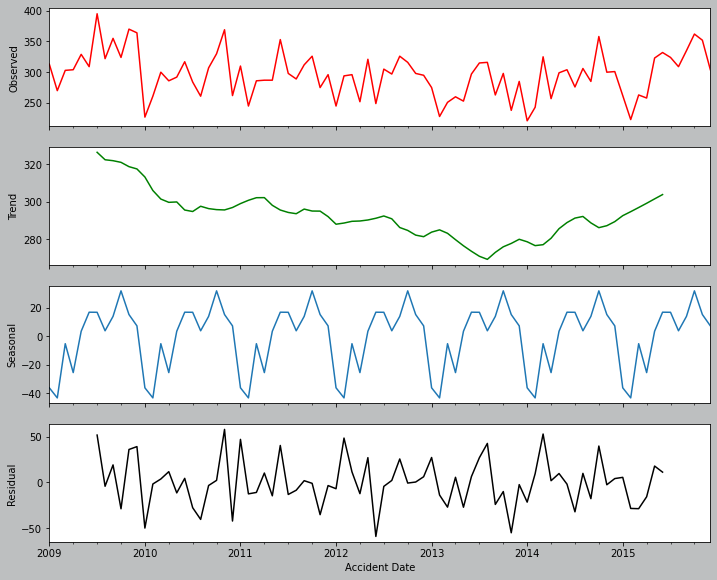

In [140]:
fig, axes = plt.subplots(4, 1, sharex=True)
fig.set_size_inches((10,8))
fig.tight_layout() 
fig.set_facecolor('#bdbfc0')

decompose_result.observed.plot(ax=axes[0], legend=False, color='r')
axes[0].set_ylabel('Observed');
decompose_result.trend.plot(ax=axes[1], legend=False, color='g')
axes[1].set_ylabel('Trend');
decompose_result.seasonal.plot(ax=axes[2], legend=False)
axes[2].set_ylabel('Seasonal');
decompose_result.resid.plot(ax=axes[3], legend=False, color='k')
axes[3].set_ylabel('Residual');
plt.show()

**Findings:**
1. It is confirmed that our time series shows trend going down until mid 2013 and picking up after that. Our data is not stationary.
2. We see a very small scale of seasonality versus the overall values, but there is a definite annual seasonality on our time series.

## Differencing - Make the Series Stationary

Differencing is one method of dealing with non stationary data, this process make such series stationary. In practice, it means subtracting subsequent observation s from one another (Lewinson, 2020). Most of statistical forecasting methods derived from the assumption that the time series can be extracted nearly stationary with the use of mathematical transformations such as differencing, this will make the prediction to be easy because the the statistical property of the series will be the same in the future as they in the past (Nau, 2019).

In [142]:
df_time_series_M['First Difference'] = df_time_series_M['Number of Vehicles'] - df_time_series_M['Number of Vehicles'].shift(1)
df_time_series_M.head()

,Number of Vehicles,First Difference
Accident Date,,
2009-01-01,313,NaN
2009-02-01,270,-43.0
2009-03-01,303,33.0
2009-04-01,304,1.0
2009-05-01,329,25.0


Lets drop NA values and see the first 5 records

In [143]:
df_time_series_M.dropna(subset = ['First Difference'], inplace = True)

df_time_series_M.head()

,Number of Vehicles,First Difference
Accident Date,,
2009-02-01,270,-43.0
2009-03-01,303,33.0
2009-04-01,304,1.0
2009-05-01,329,25.0
2009-06-01,309,-20.0


## Plotting the First Difference Values

In [144]:
import plotly.express as px


fig = px.line(df_time_series_M, y='First Difference',width=900, height=700)
fig.update_traces(line_color="#0c8f8f")

m = dict(
    l = 10,
    r = 10,
    b= 80,
    t = 80,
    pad = 30)
    

fig.update_layout(margin=m,paper_bgcolor="#bdbfc0")
fig.update_yaxes(title_text='<b>Number of Vehicles</b>', row=1, 
                 col=1,tickfont_size=10,titlefont = dict(size = 14))
fig.update_xaxes(title_text='<b>Accident Date</b>', row=1, 
                 col=1,tickfont_size=10,titlefont = dict(size = 14))
    
fig.show()

## Augmented Dickey-Fuller Re-Test for Stationarity

Augmented Dickey-Fuller re-test

In [146]:
print('Augmented Dickey-Fuller Test on Daily Number of Vehicles')
test = adfuller(df_time_series_M['First Difference'],autolag='AIC')
out = pd.Series(test[0:4],index=['ADF test statistic','p-value','# lags used','# observations'])

for key,val in test[4].items():
    out[f'critical value ({key})']=val
print(out)

Augmented Dickey-Fuller Test on Daily Number of Vehicles
ADF test statistic     -7.027143e+00
p-value                 6.321567e-10
# lags used             9.000000e+00
# observations          7.300000e+01
critical value (1%)    -3.523284e+00
critical value (5%)    -2.902031e+00
critical value (10%)   -2.588371e+00
dtype: float64


**Findings:**
1. The p values is less than 0.05, we can reject the null hypothesis and assume that the our time series is stationary
2. The time series was made stationary by 1 differencing, this will be used to the seasonal parameters of the model

## ACF and PACF Plots

We can use the statsmodels library to build auto-correlation (ACF) and partial auto-correlation plots from the differenced series. ACF describes how well the present value of the series is related with its past values while PACF finds correlation of the residuals with the next lag value. These plot can be utilized to determine the AR and MA values. Below plots shows that the ARMA parameter can be (1,2) or (1,1). On this project we are using the auto arima and SARIMAX algorithm to determine parameters required using the lowest AIC values.

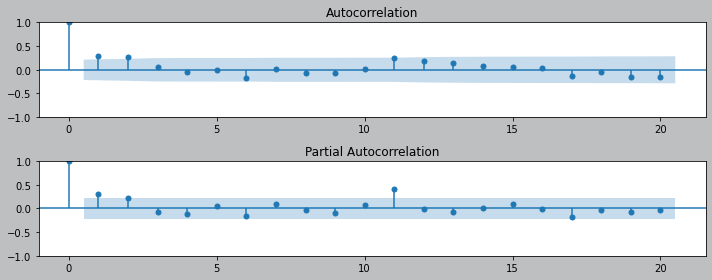

In [147]:
import statsmodels.api as sm
fig = plt.figure(figsize = (10, 4))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_time_series_M['Number of Vehicles'].dropna(),lags = 20,ax = ax1,)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_time_series_M['Number of Vehicles'].dropna(),lags = 20,ax = ax2,)
fig.set_facecolor('#bdbfc0')
fig.tight_layout()

# Obtaining The (p,d,q)(P,D,Q) Values

### Using auto_arima stepwise to obtain recommended orders of (p,d,q)(P,D,Q)

The auto_arima from the pmdarima library seeks to identify the most optimal parameter fro the ARIMA model. In order to locate the best model, it algorithm optimizes for a given information criterion which is the AIC as default by the algorithm (Smith, 2017).

On the below model, we know that that 1 differencing is enough to make our series stationary hence the D is equal to 1, and let the algorithm define the value of the p,q,P,Q by calculating the AIC (Aiken Information criterion). AIC estimate the quality of the model and compare it to the other model, thats why it being used for model selection. The lower the AIC value the better. The model will start from 0 up to the max value of 3 orders for its iteration as our AFC and PACF plots shows no significant lags after 2 lags.

In [149]:
model = auto_arima(df_time_series_M['Number of Vehicles'].dropna(), start_p=0, start_q=0,
                          max_p=3, max_q=3,m=12,
                          max_P=3,max_Q=3,
                          seasonal= True,
                          trace=True,D=1,d=0,
                          error_action='ignore',   
                          suppress_warnings=True,  
                          stepwise=True)          
model.summary()

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=738.121, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=723.554, Time=0.28 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=736.514, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=740.039, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=722.113, Time=0.79 sec
 ARIMA(1,0,0)(3,1,0)[12] intercept   : AIC=722.574, Time=1.56 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(1,0,0)(3,1,1)[12] intercept   : AIC=inf, Time=3.21 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=721.270, Time=0.46 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=722.036, Time=0.18 sec
 ARIMA(0,0,0)(3,1,0)[12] intercept   : AIC=721.793, Time=1.03 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   83
Model:             SARIMAX(2, 0, 0)x(3, 1, 0, 12)   Log Likelihood                -352.300
Date:                            Sun, 06 Nov 2022   AIC                            716.600
Time:                                    18:04:23   BIC                            730.176
Sample:                                02-01-2009   HQIC                           721.999
                                     - 12-01-2015                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1100      0.136      0.808      0.419      -0.157       0.377
ar.L2          0.3955      0.149      2.659      0.008       0.104       0.687
ar.S.L12      -0.7781      0.151     -5.147      0.000      -1.074      -0.482
ar.S.L24      -0.5412      0.174     -3.115      0.002      -0.882      -0.201
ar.S.L36      -0.4459      0.218     -2.042      0.041      -0.874      -0.018
sigma2       984.8994    245.857      4.006      0.000     503.028    1466.771
===================================================================================
Ljung-Box (L1) (Q):                   0.23   Jarque-Bera (JB):                 0.51
Prob(Q):                              0.63   Prob(JB):                         0.77
Heteroskedasticity (H):               0.50   Skew:                            -0.21
Prob(H) (two-sided):                  0.10   Kurtosis:                         3.07
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

**Findings:**
1. auto_arima stepwise recommended order value (2,0,0)x(3,1,0,12)
2. The p value of the lags coefficients as per the summary are pretty low, this imply a good fit.

Now I will Diagnose the model residuals

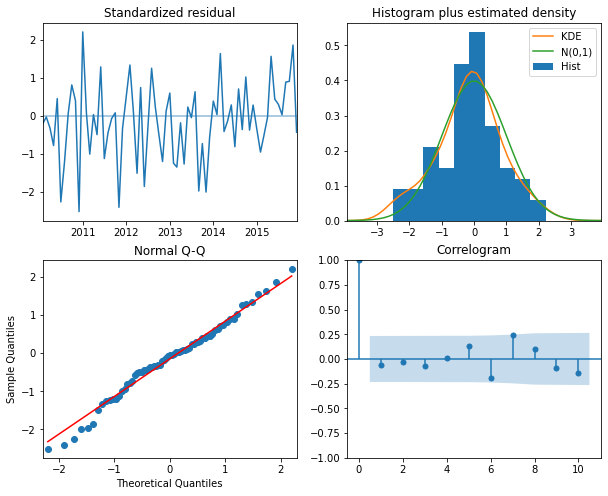

In [150]:
model.plot_diagnostics(figsize = (10, 8))
plt.show()

Above diagnostic are all normal, the residual sits across the zero mark, the histogram is very distributed, for Q-Q plot, most of the values are touching the red line and the correlogram shows that the values are below the significant level.

### Using statsmodel SARIMA to obtain recommended orders of (p,d,q)(P,D,Q)

Statsmodel is the most popular library in Python for dealing with Time Series data. It allow user to to estimate statistical model, explore and do statistical tests. Below code utilizes nested loop for the (p,q) and (P,Q) to be iterated and fitted to the model. The algorithm uses AIC as the model selection criterion. The lower the AIC value the better. Since we know that our data were differenced once to become stationary and has seasonality, we have to set value the D = 1.

In [151]:
aicVal=[]
for ari in range(0,3):
    for maj in range(0,3):
        for ari2 in range (0,3):
            for maj2 in range(0,3):
                model= SARIMAX(df_time_series_M['Number of Vehicles'].dropna(), order=(ari,0,maj), 
                                    seasonal_order=(ari2,1,maj2,12),method_kwargs={"warn_convergence": False})
                model_fit=model.fit()
                aicVal.append([ari,0,maj,ari2,1,maj2, model_fit.aic])

I will Construct DataFrame from order_aic_bic

In [152]:
order= pd.DataFrame(aicVal,columns=['p','d','q','P','D','Q','AIC'])


Print order in order of increasing AIC

In [153]:
order.sort_values('AIC').head(10)

,p,d,q,P,D,Q,AIC
37,1,0,1,0,1,1,711.273141
64,2,0,1,0,1,1,712.157687
40,1,0,1,1,1,1,712.171102
55,2,0,0,0,1,1,712.205605
38,1,0,1,0,1,2,712.281698
46,1,0,2,0,1,1,712.409523
67,2,0,1,1,1,1,712.818866
65,2,0,1,0,1,2,712.930499
49,1,0,2,1,1,1,713.082704
47,1,0,2,0,1,2,713.205234


The model's notation is SARIMA(p, d, q) (P, D, Q,m)lag. These parameters account for trend, seasonality and noise in data. It uses the AIC (Akaike information criterion) indicator which is an estimator of the relative quality of statistical models. The lower the AIC value the better. The model suggests that SARIMA(1,0,1)x(0,1,1,12) is the best combination.

Diagnosing the model residuals

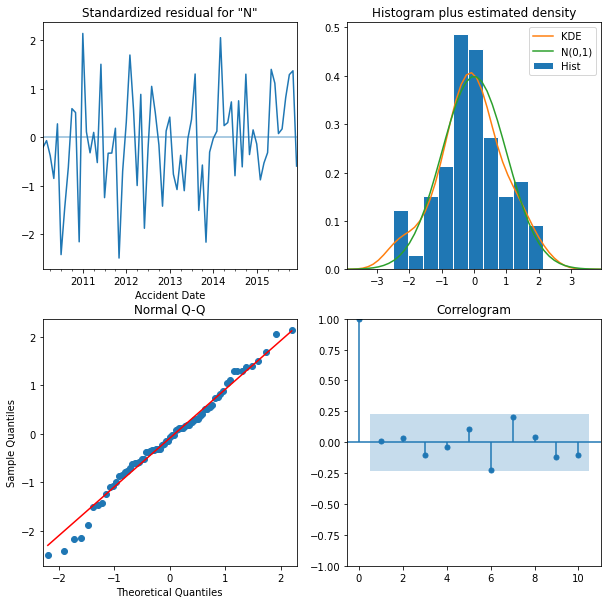

In [154]:
model_fit.plot_diagnostics(figsize = (10, 10))
plt.show()

Above diagnostic are all normal, the residual sits across the zero mark, the histogram is very distributed, for Q-Q plot, most of the values are touching the red line and the correlogram shows that the values are below the significant level.

# Modeling

## Modeling Using the auto_arima Recommendations

### Train/ Test Split and Fitting the model

Checking for the number of time series observations

In [155]:
len(df_time_series_M)

83

Splitting the data to train and test, allocating 12 months for the testing

In [156]:
train = df_time_series_M.iloc[:71]
test = df_time_series_M.iloc[71:]

In [157]:
test.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 12 entries, 2015-01-01 to 2015-12-01
Freq: MS
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Number of Vehicles  12 non-null     int64  
 1   First Difference    12 non-null     float64
dtypes: float64(1), int64(1)
memory usage: 288.0 bytes


In [158]:
train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 71 entries, 2009-02-01 to 2014-12-01
Freq: MS
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Number of Vehicles  71 non-null     int64  
 1   First Difference    71 non-null     float64
dtypes: float64(1), int64(1)
memory usage: 1.7 KB


Using auto_arima's recommendation (2,0,0)(3,1,0)[12] to model and fit to the train data.

In [159]:
model1 = SARIMAX(train['Number of Vehicles'],order=(2,0,0),seasonal_order=(3,1,0,12))
model_fit1 = model1.fit()
model_fit1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                 Number of Vehicles   No. Observations:                   71
Model:             SARIMAX(2, 0, 0)x(3, 1, 0, 12)   Log Likelihood                -294.925
Date:                            Mon, 07 Nov 2022   AIC                            601.850
Time:                                    09:56:25   BIC                            614.315
Sample:                                02-01-2009   HQIC                           606.716
                                     - 12-01-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0626      0.155      0.405      0.686      -0.240       0.365
ar.L2          0.3239      0.177      1.826      0.068      -0.024       0.672
ar.S.L12      -0.7820      0.164     -4.758      0.000      -1.104      -0.460
ar.S.L24      -0.4464      0.215     -2.074      0.038      -0.868      -0.024
ar.S.L36      -0.3216      0.296     -1.085      0.278      -0.902       0.259
sigma2      1082.8580    289.994      3.734      0.000     514.480    1651.236
===================================================================================
Ljung-Box (L1) (Q):                   1.18   Jarque-Bera (JB):                 0.40
Prob(Q):                              0.28   Prob(JB):                         0.82
Heteroskedasticity (H):               0.65   Skew:                            -0.20
Prob(H) (two-sided):                  0.34   Kurtosis:                         3.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Predicting Values

In [160]:
start=len(train)
end=len(train)+len(test)-1

predictions = model_fit1.predict(start=start, end=end, 
                                dynamic=False, typ='levels').rename('Auto Arima Predictions').to_frame()

Showing the predicted values versus the test/expected value

In [161]:
for i in range(len(predictions)):
    print(f"predicted value = {predictions['Auto Arima Predictions'][i]:}, expected value = {test['Number of Vehicles'][i]}")

predicted value = 270.3268534584371, expected value = 262
predicted value = 250.992696542721, expected value = 223
predicted value = 284.24443263997523, expected value = 263
predicted value = 268.9966392888231, expected value = 258
predicted value = 282.6473831554724, expected value = 323
predicted value = 311.19591760114605, expected value = 332
predicted value = 299.889332571969, expected value = 324
predicted value = 302.9835992645961, expected value = 309
predicted value = 291.46178593373156, expected value = 335
predicted value = 322.4034491501259, expected value = 362
predicted value = 270.9205601158283, expected value = 352
predicted value = 293.29808979870626, expected value = 304


### Plotting the Predicted versus the Actual 

In [162]:
import plotly.graph_objects as go

fig = go.Figure()

px.defaults.template = "ggplot2"

fig.add_trace(go.Scatter(x= test.index,y=test["Number of Vehicles"],
                    mode='lines',
                    name='Test Set'))

fig.add_trace(go.Scatter(x= predictions.index,y=predictions['Auto Arima Predictions'],
                    mode='lines',
                    name='Auto Arima Predictions'))

fig.update_layout(
    margin=dict(l=20, r=50, t=60, b=60),
    paper_bgcolor="#bdbfc0",
    width = 1000,
    height = 600,template = 'ggplot2')

fig.update_xaxes(title_text='</b>Accident Date</b>',tickfont_size=10,titlefont = dict(size = 14))
fig.update_yaxes(title_text='</b>Number of vehicles</b>',tickfont_size=10,titlefont = dict(size = 14))
    
fig.show()

### Evaluating the Model

Performance estimation/ evaluation is a process of estimating the loss that a predictive model/ algorithm will incur on the unseen data. This is fundamental stage at any machine learning project (Cerqueira, Torgo and Mozetič, 2020). Time series forecasting is a specific type of predictive modeling because it uses historical data to predict trends in a particular time in the future(Kumar, 2022). Mean Absolute Percentage Error (MAPE) is the most wide used metric for forecast accuracy. It uses the percentage error which is scale independent of the series (Kumar, 2020).

In the next command, I will follow this steps: Create a dataframe Evolution / Score, Add columns in the dataframe, display the results.

In [163]:
eval_results = pd.DataFrame(({ 'Evaluation': 'Score'}), index = [0])

eval_results['Mean_Test_Data'] = round(test['Number of Vehicles'].mean(),2)
eval_results['mean_absolute_error'] = round(mean_absolute_error(test['Number of Vehicles'], predictions),2)
eval_results['mean_squared_error'] = round(mean_squared_error(test['Number of Vehicles'], predictions),2)
eval_results['root_mean_squared_error'] = round(np.sqrt(mean_squared_error(test['Number of Vehicles'], predictions)),2)
eval_results['mean_absolute_percentage_error'] = round(np.mean(np.abs(predictions['Auto Arima Predictions']- test['Number of Vehicles'])
                                                               /np.abs(test['Number of Vehicles']))*100,2)  

eval_results

,Evaluation,Mean_Test_Data,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
0,Score,303.92,27.9,1187.98,34.47,8.89


## Modeling Using the statsmodel Recommendations

### Using Train/ Test Split and Fitting the model

Using statsmodel recommendation (1,0,1)(0,1,1)[12] to model and fit to the train data.

In [164]:
model2 = SARIMAX(train['Number of Vehicles'],order=(1,0,1), seasonal_order=(0,1,1,12))
model_fit2 = model2.fit()
model_fit2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                 Number of Vehicles   No. Observations:                   71
Model:             SARIMAX(1, 0, 1)x(0, 1, 1, 12)   Log Likelihood                -295.339
Date:                            Mon, 07 Nov 2022   AIC                            598.679
Time:                                    10:06:49   BIC                            606.989
Sample:                                02-01-2009   HQIC                           601.923
                                     - 12-01-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0000      0.000   2484.394      0.000       0.999       1.001
ma.L1         -0.9248      0.104     -8.857      0.000      -1.129      -0.720
ma.S.L12      -0.9882      0.178     -5.550      0.000      -1.337      -0.639
sigma2       930.5975      0.000   4.79e+06      0.000     930.597     930.598
===================================================================================
Ljung-Box (L1) (Q):                   1.46   Jarque-Bera (JB):                 1.01
Prob(Q):                              0.23   Prob(JB):                         0.60
Heteroskedasticity (H):               0.82   Skew:                            -0.25
Prob(H) (two-sided):                  0.65   Kurtosis:                         3.41
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.27e+22. Standard errors may be unstable.
"""

### Predicting Values

In [165]:
start=len(train)
end=len(train)+len(test)-1
predictions2 = model_fit2.predict(start=start, end=end, 
                                dynamic=False, typ='levels').rename('Sarima Predictions').to_frame()

Showing the predicted values versus the test/expected value

In [166]:
for i in range(len(predictions2)):
    print(f"predicted value={predictions2['Sarima Predictions'][i]:},expected value={test['Number of Vehicles'][i]}")

predicted value=243.5629690032433,expected value=262
predicted value=241.28152812305822,expected value=223
predicted value=278.0836555904481,expected value=263
predicted value=259.0397258052714,expected value=258
predicted value=281.6739845996625,expected value=323
predicted value=289.80663954159246,expected value=332
predicted value=297.2639198956984,expected value=324
predicted value=283.7527766235817,expected value=309
predicted value=293.36447402839605,expected value=335
predicted value=310.84958001760646,expected value=362
predicted value=293.9606905339482,expected value=352
predicted value=286.27982543035216,expected value=304


### Plotting the Predicted versus the Actual 

In [167]:
import plotly.graph_objects as go

fig = go.Figure()

px.defaults.template = "ggplot2"

fig.add_trace(go.Scatter(x= test.index,y=test["Number of Vehicles"],
                    mode='lines',
                    name='Test Set'))

fig.add_trace(go.Scatter(x= predictions2.index,y=predictions2['Sarima Predictions'],
                    mode='lines',
                    name='Sarima Predictions'))

fig.update_layout(
    margin=dict(l=20, r=50, t=60, b=60),
    paper_bgcolor="#bdbfc0",
    width = 1000,
    height = 600,template = 'ggplot2')

fig.update_xaxes(title_text='</b>Accident Date</b>',tickfont_size=10,titlefont = dict(size = 14))
fig.update_yaxes(title_text='</b>Number of vehicles</b>',tickfont_size=10,titlefont = dict(size = 14))
    
fig.show()

### Evaluating the Model

Performance estimation/ evaluation is a process of estimating the loss that a predictive model/ algorithm will incur on the unseen data. This is fundamental stage at any machine learning project (Cerqueira, Torgo and Mozetič, 2020). Time series forecasting is a specific type of predictive modeling because it uses historical data to predict trends in a particular time in the future(Kumar, 2022). Mean Absolute Percentage Error (MAPE) is the most wide used metric for forecast accuracy. It uses the percentage error which is scale independent of the series (Kumar, 2020).

In [1]:
eval_results2 = pd.DataFrame(({ 'Evaluation': 'Score'}), index = [0])

eval_results2 ['Mean_Test_Data'] = round(test['Number of Vehicles'].mean(),2)
eval_results2 ['mean_absolute_error'] = round(mean_absolute_error(test['Number of Vehicles'], predictions2),2)
eval_results2 ['mean_squared_error'] = round(mean_squared_error(test['Number of Vehicles'], predictions2),2)
eval_results2 ['root_mean_squared_error'] = round(np.sqrt(mean_squared_error(test['Number of Vehicles'], predictions2)),2)
eval_results2 ['mean_absolute_percentage_error'] = round(np.mean(np.abs(predictions2['Sarima Predictions']- test['Number of Vehicles'])
                                                               /np.abs(test['Number of Vehicles']))*100,2)  
 
eval_results2 

NameError: name 'pd' is not defined

## Modeling Rolling Forecast Origin

Rolling origin is an evaluation technique according to which the forecasting origin is updated successively and the forecasts are produced from each origin (Tashman 2000). This technique only predict a step at a time and each prediction is added to the main series before the next prediction is made. This method reduce the error of predicting a large step away from the series.

### Setting up the train split of the data and its timeline

We are still testing on the last 12 months of the series

In [169]:
train_end = datetime.datetime(2014,12,1)
test_end = datetime.datetime(2015,12,1)

train_data = df_time_series_M[:datetime.datetime(2014,12,1)]
test_data = df_time_series_M[train_end + timedelta(days=1):test_end]

### Predicting Values

Using for loop to iterate the number of index of the test data and model/ fit the training data using the SARIMA lags recommendations. Each forecast is appended in the rolling_prediction list.

In [170]:
rolling_predictions= []
for train_end in test_data.index:
    train_data = df_time_series_M['Number of Vehicles'][:train_end-relativedelta(months=1)]
    model3 = SARIMAX(train_data, order=(1,0,1), seasonal_order=(0,1,1,12))
    model_fit3 = model3.fit()
    
    pred = np.array(model_fit3.forecast())
    rolling_predictions.append(pred)

In [171]:
rolling_predictions = pd.DataFrame(rolling_predictions).rename(columns={0 : 'Prediction'}).set_index(test_data.index)
rolling_predictions.head(12)

,Prediction
Accident Date,
2015-01-01,243.562969
2015-02-01,251.096225
2015-03-01,295.441002
2015-04-01,263.576389
2015-05-01,293.726743
2015-06-01,299.535455
2015-07-01,302.112610
2015-08-01,296.876069
2015-09-01,308.357185


### Plotting the Predicted versus the Actual 

In [172]:
import plotly.graph_objects as go

fig = go.Figure()

px.defaults.template = "ggplot2"

fig.add_trace(go.Scatter(x= test_data.index,y=test_data["Number of Vehicles"],
                    mode='lines',
                    name='Test Set'))

fig.add_trace(go.Scatter(x= test_data.index,y=rolling_predictions['Prediction'],
                    mode='lines',
                    name='Rolling Forecast  Predictions'))

fig.update_layout(
    margin=dict(l=20, r=50, t=60, b=60),
    paper_bgcolor="#bdbfc0",
    width = 1000,
    height = 600,template = 'ggplot2')

fig.update_xaxes(title_text='</b>Accident Date</b>',tickfont_size=10,titlefont = dict(size = 14))
fig.update_yaxes(title_text='</b>Number of vehicles</b>',tickfont_size=10,titlefont = dict(size = 14))
    
fig.show()

### Evaluating the Model

In [173]:
eval_results3 = pd.DataFrame(({ 'Evaluation': 'Score'}), index = [0])

eval_results3['mean_test_data'] = round(test_data['Number of Vehicles'].mean(),2)
eval_results3['mean_absolute_error'] = round(mean_absolute_error(test_data['Number of Vehicles'], rolling_predictions),2)
eval_results3['mean_squared_error'] = round(mean_squared_error(test_data['Number of Vehicles'], rolling_predictions),2)
eval_results3['root_mean_squared_error'] = round(np.sqrt(mean_squared_error(test_data['Number of Vehicles'],
                                                                                 rolling_predictions)),2)
eval_results3['mean_absolute_percentage_error'] = round(np.mean(np.abs(rolling_predictions['Prediction'] - test_data['Number of Vehicles'])
                                                               /np.abs(test_data['Number of Vehicles']))*100,2)  
 
eval_results3

,Evaluation,mean_test_data,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
0,Score,303.92,23.76,652.53,25.54,7.84


# Forecasting the Future using the best fit model

In [174]:
score = ([eval_results['mean_absolute_percentage_error'][0],eval_results2['mean_absolute_percentage_error'][0],
                  eval_results3['mean_absolute_percentage_error'][0]])
columns = (['auto arima', 'SARIMA', 'Rolling Forecast'])

In [ ]:
fig = plt.figure(figsize=(8,6))
fig = sns.barplot(score,columns,)
plt.xlabel("MAPE in %")
plt.title("Model Performace Error (MAPE)")
fig.set_facecolor('#efefef')
plt.show();

**Findings:**

Out of the 3 Models, The Rolling Forecast Origin yields the smallest MAPE of 7.84%. Using its model value, we are forecasting 12 steps ( 12 months) in the future. Below is the code and plot showing how the model's prediction.


## Fit the model to the entire time series and forecast the future- 12 Step Months

The next plot will follow this steps: Forecasting 1 year steps ahead, build confidence intervals of the forecasted values, Plot the data, Plot the forecasted values, Plot the confidence intervals.

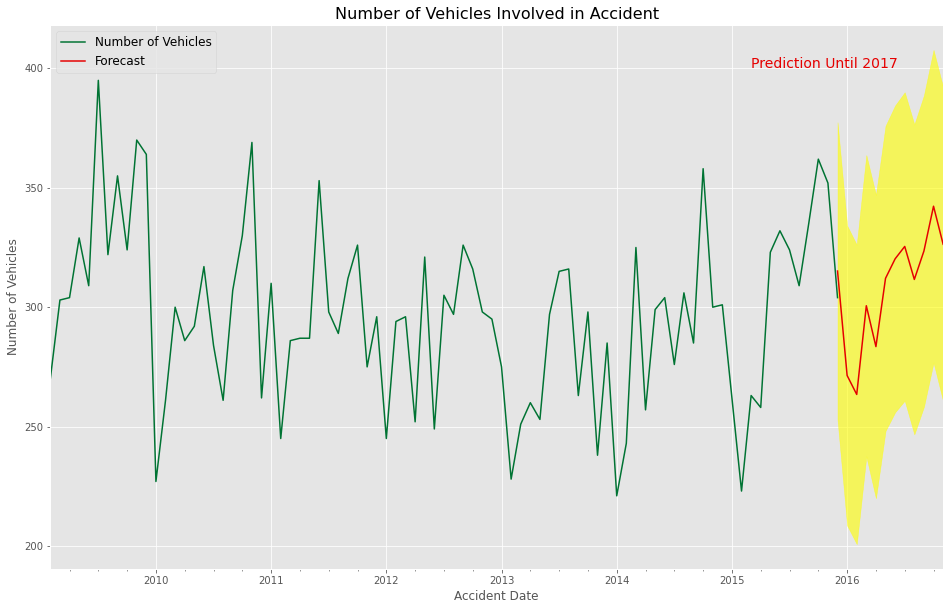

In [175]:
plt.style.use('ggplot')

forecast_values = model_fit3.get_forecast(steps = 12)

forecast_ci = forecast_values.conf_int()

ax = df_time_series_M.plot( y = 'Number of Vehicles', figsize = (16, 10), legend = True, color = '#007333')

forecast_values.predicted_mean.plot(ax = ax, label = 'Forecast', figsize = (16, 10), grid = True, color= '#e50000')


ax.fill_between(forecast_ci.index,
                forecast_ci.iloc[: , 0],
                forecast_ci.iloc[: , 1], color = 'yellow', alpha = .6)

plt.title('Number of Vehicles Involved in Accident', size = 16)
plt.ylabel('Number of Vehicles', size = 12)
plt.legend(loc = 'upper left', prop = {'size': 12})
ax.axes.get_xaxis().set_visible(True)
ax.text(542, 400, 'Prediction Until 2017', fontsize = 14,  color = '#e50000')
plt.show()

# Team Work

In [176]:
CodeTeam = pd.DataFrame({"Name" :["Rodel", "Tom", "Billy", "JayJay", "Edmundo"], "Contribution in Hours for Coding": [50, 50, 50, 24, 24 ]},columns = ["Name", "Contribution in Hours for Coding"], index = ["a","b","c","d", "e"])
CodeTeam

,Name,Contribution in Hours for Coding
a,Rodel,50
b,Tom,50
c,Billy,50
d,JayJay,24
e,Edmundo,24


In [177]:
ResearchTeam = pd.DataFrame({"Name" :["Rodel", "Tom", "Billy", "Jay Jay", "Edmundo"], "Contribution in Hours for Research": [25, 25, 25, 50, 50]},columns = ["Name", "Contribution in Hours for Research"], index = ["a","b","c","d","e"])
ResearchTeam

,Name,Contribution in Hours for Research
a,Rodel,25
b,Tom,25
c,Billy,25
d,Jay Jay,50
e,Edmundo,50


In [178]:
ContributionTotal = pd.concat([CodeTeam, ResearchTeam], axis = 1)
ContributionTotal

,Name,Contribution in Hours for Coding,Name,Contribution in Hours for Research
a,Rodel,50,Rodel,25
b,Tom,50,Tom,25
c,Billy,50,Billy,25
d,JayJay,24,Jay Jay,50
e,Edmundo,24,Edmundo,50


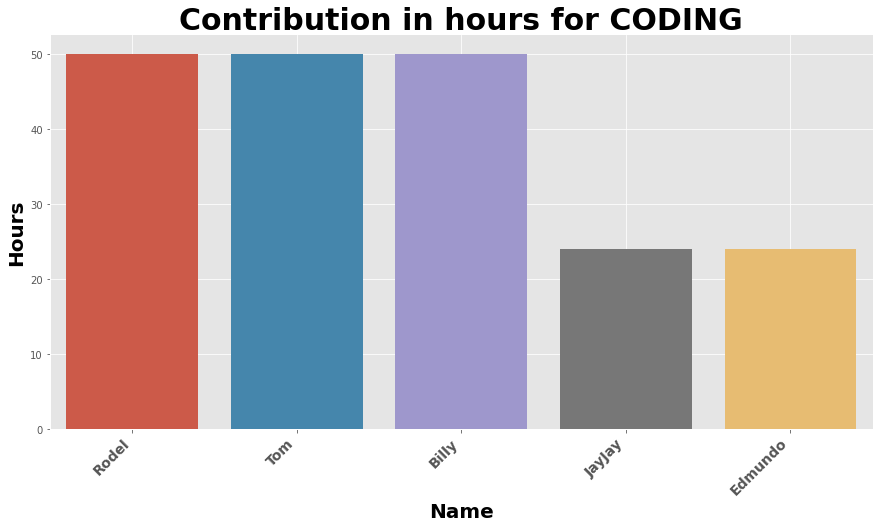

In [179]:
g = sns.catplot(x = 'Name', y = "Contribution in Hours for Coding",data =  CodeTeam, aspect= 2, height = 6, kind = "bar",label = "big")
plt.xticks(rotation=45, horizontalalignment='right', fontweight = "bold", fontsize = 14);
plt.title("Contribution in hours for CODING",color="black", fontweight="bold", fontsize=30)
plt.xlabel("Name",color="black", fontweight="bold", fontsize = 20)
plt.ylabel("Hours",color="black", fontweight="bold", fontsize = 20);
plt.grid(True)

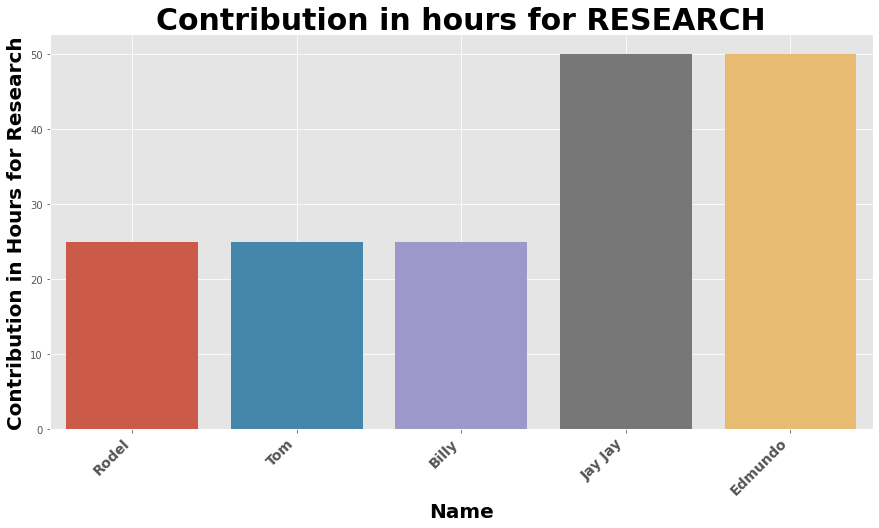

In [180]:
g = sns.catplot(x = 'Name', y = "Contribution in Hours for Research",data =  ResearchTeam, aspect= 2, height = 6, kind = "bar",label = "big")
plt.xticks(rotation=45, horizontalalignment='right', fontweight = "bold", fontsize = 14);
plt.title("Contribution in hours for RESEARCH",color="black", fontweight="bold", fontsize=30)
plt.xlabel("Name",color="black", fontweight="bold", fontsize = 20)
plt.ylabel("Contribution in Hours for Research",color="black", fontweight="bold", fontsize = 20);
plt.grid(True)

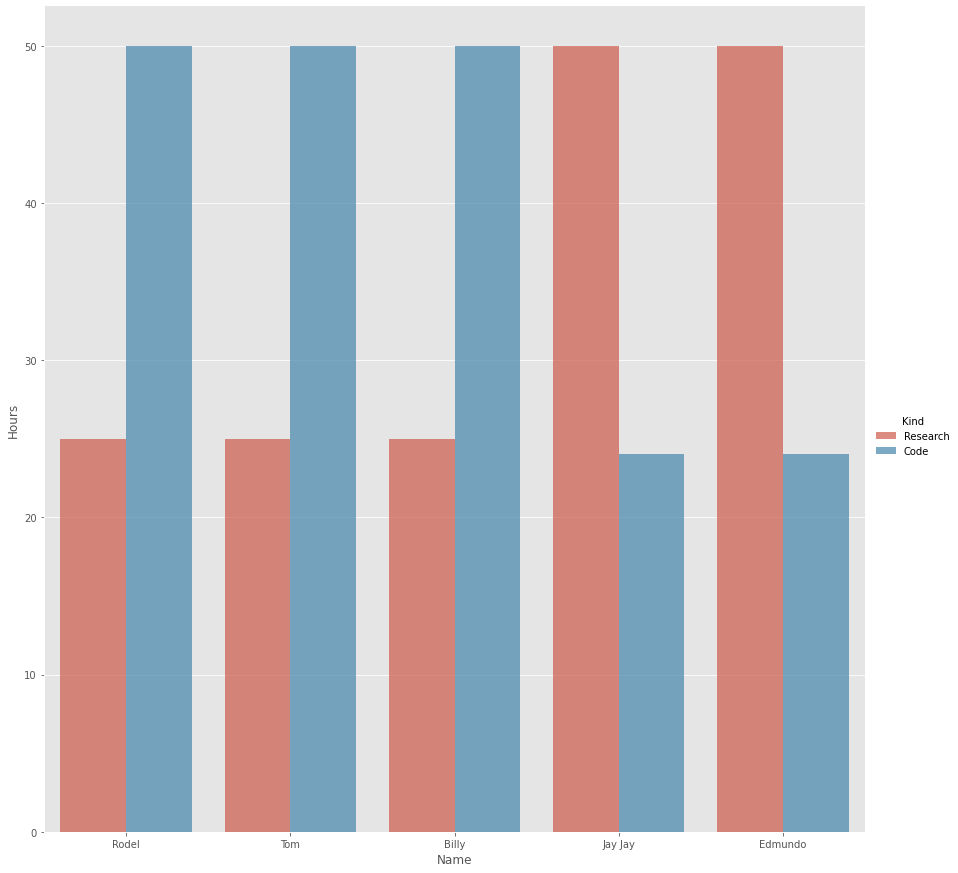

In [181]:
Contribution = pd.DataFrame({"Name" :["Rodel", "Tom", "Billy", "Jay Jay", "Edmundo", "Rodel", "Tom", "Billy","Jay Jay", "Edmundo"], "Hours": [25, 25, 25, 50, 50, 50, 50, 50, 24, 24,], "Kind": ['Research', 'Research', 'Research', 'Research', 'Research', 'Code', 'Code','Code','Code','Code', ]},columns = ["Name", "Hours", "Kind"])
sns.catplot(data=Contribution, kind="bar", x= "Name", y="Hours",hue="Kind", alpha=.7, height=12)

<b>References for EDA and Visualisation Section:</b>

docs.pydata.org. (n.d.a). datetime — Basic date and time types. [online] Available at: https://docs.python.org/3/library/datetime.html [Accessed 2 Nov. 2022].

(IPython Development Team, n.d.). Module: display. [online] Available at: https://ipython.readthedocs.io/en/stable/api/generated/IPython.display.html [Accessed 2 Nov. 2022].

Matplotlib development team (n.d.a). matplotlib.pyplot.bar_label. [online] matplotlib.org. Available at: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.bar_label.html [Accessed 2 Nov. 2022].

Matplotlib development team (n.d.b). matplotlib.container. [online] matplotlib.org. Available at: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.bar_label.html[Accessed 2 Nov. 2022].

Matplotlib development team (n.d.c). matplotlib.axes.Axes.ticklabel_format. [online] Available at: https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.ticklabel_format.html [Accessed 2 Nov. 2022].

pandas.pydata.org. (n.d.a). pandas.Series.str.zfill. [online] Available at: https://pandas.pydata.org/docs/reference/api/pandas.Series.str.zfill.html [Accessed 2 Nov. 2022].

pandas.pydata.org. (n.d.b). pandas.Series.apply. [online] Available at: https://pandas.pydata.org/docs/reference/api/pandas.Series.apply.html [Accessed 2 Nov. 2022].

pandas.pydata.org. (n.d.c). pandas.to_datetime [online] Available at: https://pandas.pydata.org/docs/reference/api/pandas.to_datetime.html[Accessed 2 Nov. 2022].

pandas.pydata.org. (n.d.d). Group by: split-apply-combine [online] Available at: https://pandas.pydata.org/pandas-docs/stable/user_guide/groupby.html.html[Accessed 2 Nov. 2022].

Waskom, M. (n.d.a). seaborn.heatmap. [online] seaborn.pydata.org. Available at: https://seaborn.pydata.org/generated/seaborn.heatmap.html [Accessed 2 Nov. 2022].

Waskom, M. (n.d.b). seaborn.pairplot. [online] seaborn.pydata.org. Available at: https://seaborn.pydata.org/generated/seaborn.pairplot.html[Accessed 2 Nov. 2022].

Waskom, M. (n.d.c). seaborn.boxplot. [online] seaborn.pydata.org. Available at: https://seaborn.pydata.org/generated/seaborn.boxplot.html[Accessed 2 Nov. 2022].

Waskom, M. (n.d.d). seaborn.distplot. [online] seaborn.pydata.org. Available at: https://seaborn.pydata.org/generated/seaborn.distplot.html[Accessed 2 Nov. 2022].

Waskom, M. (n.d.e). seaborn.violinplot. [online] seaborn.pydata.org. Available at: https://seaborn.pydata.org/generated/seaborn.violinplot.html[Accessed 2 Nov. 2022].

Waskom, M. (n.d.f). seaborn.countplot. [online] seaborn.pydata.org. Available at: https://seaborn.pydata.org/generated/seaborn.countplot.html[Accessed 2 Nov. 2022].

Waskom, M. (n.d.g). seaborn.scatterplot. [online] seaborn.pydata.org. Available at: https://seaborn.pydata.org/generated/seaborn.scatterplot.html[Accessed 2 Nov. 2022].

<b> References for Kprototype:</b>
Kemmer, R. (2021). Clustering on Mixed Data Types in Python. [online] Analytics Vidhya. Available at: https://medium.com/analytics-vidhya/clustering-on-mixed-data-types-in-python-7c22b3898086#:~:text=One%20hot%20encoding%20involves%20creating [Accessed 6 Nov. 2022].

Zazueta, Z. (2021). K-Prototypes clustering — for when you’re clustering continuous and categorical data. [online] Medium. Available at: https://zachary-a-zazueta.medium.com/k-prototypes-clustering-for-when-youre-clustering-continuous-and-categorical-data-6ea42c2ab2b9.

<b>References for K-Modes and K-Means Section:</b>

Bonthu, H. (2022). KModes Clustering Algorithm for Categorical data. [online] analyticsvidhya.com. Available at: https://www.analyticsvidhya.com/blog/2021/06/kmodes-clustering-algorithm-for-categorical-data/ [Accessed 1 Nov. 2022].

nicodv, N. de V. (2022). nicodv / kmodes. [online] github.com. Available at: https://github.com/nicodv/kmodes/blob/master/kmodes/kmodes.py [Accessed 1 Nov. 2022].

pandas.pydata.org. (n.d.a). pandas.DataFrame.select_dtypes. [online] Available at: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.select_dtypes.html [Accessed 1 Nov. 2022].

pandas.pydata.org. (n.d.e). pandas.DataFrame.insert. [online] Available at: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.insert.html [Accessed 1 Nov. 2022].

pandas.pydata.org. (n.d.f). pandas.DataFrame.values [online] Available at: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.values.html[Accessed 2 Nov. 2022].

pypi.org. (2022). kmodes 0.12.2. [online] Available at: https://pypi.org/project/kmodes/ [Accessed 1 Nov. 2022].

Weiss, S. (2022a). Introduction to Clustering [Lecture]. CCT College Dublin

Weiss, S. (2022b). Hierarchial approaches: Fuzzy C-Means and Agglomerative (HAC) [Lecture]. CCT College Dublin

Weiss, S. (2022c). Density-based approaches: DBSCAN, OPTICS [Lecture]. CCT College Dublin

<b> Time Series References Section:</b>
Cerqueira, V., Torgo, L. and Mozetič, I. (2020). Evaluating time series forecasting models: an empirical study on performance estimation methods. Machine Learning. doi:10.1007/s10994-020-05910-7.

Harris, R.I., 1992. Testing for unit roots using the augmented Dickey-Fuller test: Some issues relating to the size, power and the lag structure of the test. Economics letters, 38(4), pp.381-386

Kumar, A. (2022). Performance metrics for Time-series Forecasting models. [online] Data Analytics. Available at: https://vitalflux.com/performance-metrics-for-time-series-forecasting-models/ [Accessed 3 Nov. 2022].

Kumar, R. (2020). MAD Over MAPE? [online] Medium. Available at: https://towardsdatascience.com/mad-over-mape-a86a8d831447.

Lewinson, E. (2020). An intuitive guide to differencing time series in Python. [online] Medium. Available at: https://towardsdatascience.com/an-intuitive-guide-to-differencing-time-series-in-python-1d6c7a2c067a.

Nau, R. (2019). Stationarity and differencing of time series data. [online] Duke.edu. Available at: https://people.duke.edu/~rnau/411diff.htm.

Penn State University (2022). 5.1 Decomposition Models | STAT 510. [online] PennState: Statistics Online Courses. Available at: https://online.stat.psu.edu/stat510/lesson/5/5.1.

Prabhakaran, S. (2019). Augmented Dickey Fuller Test (ADF Test) – Must Read Guide. [online] Machine Learning Plus. Available at: https://www.machinelearningplus.com/time-series/augmented-dickey-fuller-test/.

ProjectPro (2022). Data Preparation for Machine Learning Projects: Know It All Here. [online] ProjectPro. Available at: https://www.projectpro.io/article/data-preparation-for-machine-learning/595#:~:text=Data%20preparation%20is%20necessary%20in [Accessed 2 Nov. 2022].

Smith, T. (2017). pmdarima.arima.auto_arima — pmdarima 1.5.3 documentation. [online] alkaline-ml.com. Available at: https://alkaline-ml.com/pmdarima/modules/generated/pmdarima.arima.auto_arima.html.

Tashman, Leonard J. 2000. “Out-of-sample tests of forecasting accuracy: An analysis and review.” International Journal of Forecasting 16 (4): 437–50. https://doi.org/10.1016/S0169-2070(00)00065-0